# Final Project

By Gilad Toval and Adam Bublil

We decided to examine the following dataset:

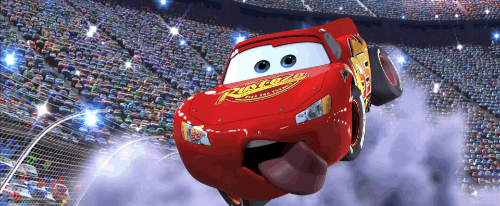

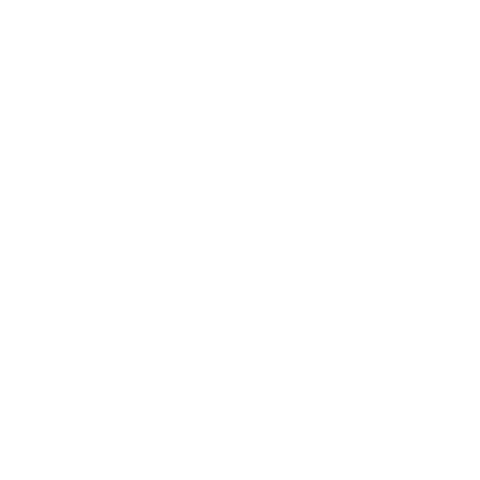

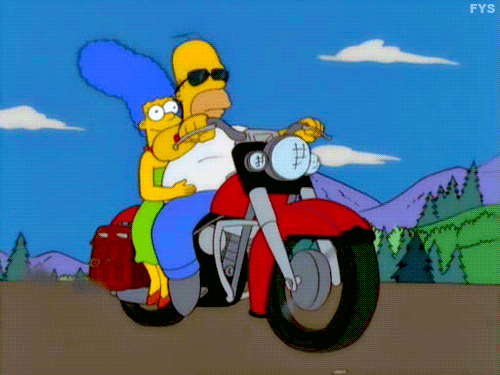

Cars vs Bikes! The dataset has 4000 instances, 2000 for each class

## Imports

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision import models, transforms
from PIL import Image
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, confusion_matrix, f1_score, roc_auc_score


## Load the Data

In [61]:

# The dataset directory
base_dir = "C:/Users/GiladTK/Desktop/python/deep learning/final project/"

# Categories and their corresponding labels
categories = {'Car': 0, 'Bike': 1}

# Lists to store images and labels
images = []
labels = []

# Load each image and its label
for category, label in categories.items():
    folder_path = os.path.join(base_dir, category)
    for file in os.listdir(folder_path):
        file_path = os.path.join(folder_path, file)
        with Image.open(file_path).convert('RGB') as img:  # Convert image to RGB
            img_resized = img.resize((224, 224))  # Resize image to ensure uniformity
            images.append(np.array(img_resized))
            labels.append(label)

# Convert the list of images to a numpy array
images_array = np.array(images)

print(f"Images array shape: {images_array.shape}")


C:\Users\GiladTK\anaconda3\lib\site-packages\PIL\Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Images array shape: (4000, 224, 224, 3)


In [62]:
# Convert the labels list to a numpy array
labels_array = np.array(labels)

Let's plot the first image:

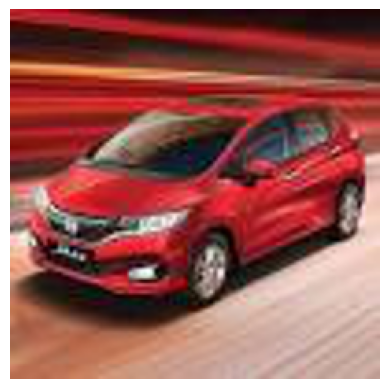

In [63]:
# Select the first image
img_display = images_array[0]  

# Display the image
plt.imshow(img_display)
plt.axis('off')  # Turn off axis numbers and ticks
plt.show()


In [64]:
# Convert images and labels to PyTorch tensors
images_tensor = torch.from_numpy(images_array).float()
labels_tensor = torch.from_numpy(labels_array).long()

# Adjusting the shape for PyTorch (N, C, H, W)
images_tensor = images_tensor.permute(0, 3, 1, 2)

print(f"Images tensor shape: {images_tensor.shape}")  # Should be (N, 3, 224, 224)
print(f"Labels tensor shape: {labels_tensor.shape}")


Images tensor shape: torch.Size([4000, 3, 224, 224])
Labels tensor shape: torch.Size([4000])


Let's plot back from tensor:

In [65]:
image_np = images_tensor.cpu().numpy()

image_np = np.transpose(image_np, (0,2, 3, 1))
image_np = image_np.astype(np.float32) / 255.0

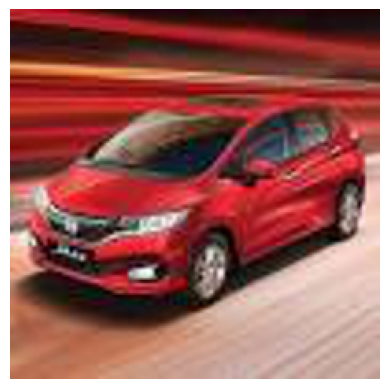

In [66]:
# Display the image using matplotlib
plt.imshow(image_np[0])
plt.axis('off')  # Turn off axis
plt.show()

### Split to train and test

In [67]:
class CustomDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]
        if self.transform:
            image = self.transform(image)
        return image, label



In [68]:
# Split data into training and testing sets
train_images, test_images, train_labels, test_labels = train_test_split(images_tensor, labels_tensor, test_size=0.2, random_state=42)    
    
train_dataset = CustomDataset(images=train_images, labels=train_labels)
test_dataset = CustomDataset(images=test_images, labels=test_labels)

# Define DataLoader
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False)


In [69]:
train_images.shape

torch.Size([3200, 3, 224, 224])

## Baseline Classification

An important note - The training accuracy is lower than the test accuracy because it's measured across the entire epoch, during which the model is still adjusting and likely making more errors initially than towards the end. Therefore, the cumulative result over the epoch may be lower. In contrast, the test accuracy reflects the model's performance after it has completed its learning phase, potentially leading to higher accuracy on the test set. In different models, this can be attributed to regularization effects (such as dropout, L1/L2 regularization or batch normalization) as well.

#### Labels for evaluation

In [31]:
true_labels = []
with torch.no_grad():
    for images, labels in test_loader:
        true_labels.extend(labels.cpu().tolist())


### Resnet

In [71]:
resnet = models.resnet18(pretrained=True)
num_ftrs = resnet.fc.in_features
resnet.fc = nn.Linear(num_ftrs, 2)  # 2 classes (cars and bikes)

# loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(resnet.parameters(), lr=0.001)


In [72]:
num_epochs = 2
print_every = 100

for epoch in range(num_epochs):
    resnet.train()
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader, 1):
        optimizer.zero_grad()
        outputs = resnet(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every 100 iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0  # Reset running loss
        
        # Compute train accuracy
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")


Epoch [1/2], Iteration [100/800], Loss: 0.6232
Epoch [1/2], Iteration [200/800], Loss: 0.4186
Epoch [1/2], Iteration [300/800], Loss: 0.4773
Epoch [1/2], Iteration [400/800], Loss: 0.4449
Epoch [1/2], Iteration [500/800], Loss: 0.4060
Epoch [1/2], Iteration [600/800], Loss: 0.3246
Epoch [1/2], Iteration [700/800], Loss: 0.3776
Epoch [1/2], Iteration [800/800], Loss: 0.3239
Epoch [1/2], Loss: 0.0568, Train Accuracy: 83.56%
Epoch [2/2], Iteration [100/800], Loss: 0.3400
Epoch [2/2], Iteration [200/800], Loss: 0.3335
Epoch [2/2], Iteration [300/800], Loss: 0.3409
Epoch [2/2], Iteration [400/800], Loss: 0.2422
Epoch [2/2], Iteration [500/800], Loss: 0.2988
Epoch [2/2], Iteration [600/800], Loss: 0.2433
Epoch [2/2], Iteration [700/800], Loss: 0.1892
Epoch [2/2], Iteration [800/800], Loss: 0.2048
Epoch [2/2], Loss: 0.0192, Train Accuracy: 89.31%
Training completed.


In [75]:
# Set the model to evaluation mode
resnet.eval()

# Initialize variables to track the number of correct predictions and total predictions
correct_test = 0
total_test = 0

# Initialize a list to store predictions for ResNet
predicted_resnet = []

# Disable gradient computation for inference
with torch.no_grad():
    for images, labels in test_loader:
        # Forward pass to get the model's predictions
        outputs = resnet(images)
        
        # Get the predictions
        _, predicted = torch.max(outputs.data, 1)
        
        # Append the predictions to the list
        predicted_resnet.extend(predicted.cpu().tolist())
        
        # Update total and correct predictions
        total_test += labels.size(0)
        correct_test += (predicted == labels).sum().item()

# Calculate test accuracy
test_accuracy = 100 * correct_test / total_test
print(f'Test Accuracy: {test_accuracy:.2f}%')


Test Accuracy: 95.38%


### VGG

We will implement Simplier VGG, because of long running time

In [181]:
import torch
import torch.nn as nn
import torch.optim as optim

class SimpleVGG(nn.Module):
    def __init__(self, num_classes=2):
        super(SimpleVGG, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 512),
            nn.ReLU(True),
            nn.Dropout(),
            nn.Linear(512, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

In [182]:
# Create an instance of the SimpleVGG model
vgg = SimpleVGG()

# Initialize optimizer 
optimizer = optim.Adam(vgg.parameters(), lr=0.001)

criterion = nn.CrossEntropyLoss()

# Set number of epochs and print_every
num_epochs = 2
print_every = 100

# Training loop
for epoch in range(num_epochs):
    vgg.train()
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader, 1):
        optimizer.zero_grad()
        outputs = vgg(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every print_every iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0  # Reset running loss
        
        # Compute train accuracy
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")


Epoch [1/2], Iteration [100/800], Loss: 17.8963
Epoch [1/2], Iteration [200/800], Loss: 0.6933
Epoch [1/2], Iteration [300/800], Loss: 0.6968
Epoch [1/2], Iteration [400/800], Loss: 0.6936
Epoch [1/2], Iteration [500/800], Loss: 0.6903
Epoch [1/2], Iteration [600/800], Loss: 0.6992
Epoch [1/2], Iteration [700/800], Loss: 0.7707
Epoch [1/2], Iteration [800/800], Loss: 0.6946
Epoch [1/2], Loss: 0.6991, Train Accuracy: 50.44%
Epoch [2/2], Iteration [100/800], Loss: 0.6937
Epoch [2/2], Iteration [200/800], Loss: 0.6943
Epoch [2/2], Iteration [300/800], Loss: 0.6936
Epoch [2/2], Iteration [400/800], Loss: 0.7172
Epoch [2/2], Iteration [500/800], Loss: 0.7006
Epoch [2/2], Iteration [600/800], Loss: 0.7224
Epoch [2/2], Iteration [700/800], Loss: 0.6930
Epoch [2/2], Iteration [800/800], Loss: 0.6946
Epoch [2/2], Loss: 0.6770, Train Accuracy: 49.22%
Training completed.


The model doesn't learn, let's try different lr:

In [186]:
# Create an instance of the SimpleVGG model
vgg = SimpleVGG()

# Initialize optimizer 
optimizer = optim.Adam(vgg.parameters(), lr=0.01)

criterion = nn.CrossEntropyLoss()

# Set number of epochs and print_every
num_epochs = 2
print_every = 100

# Training loop
for epoch in range(num_epochs):
    vgg.train()
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader, 1):
        optimizer.zero_grad()
        outputs = vgg(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every print_every iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0  # Reset running loss
        
        # Compute train accuracy
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")


Epoch [1/2], Iteration [100/800], Loss: 601979.6787
Epoch [1/2], Iteration [200/800], Loss: 0.6985
Epoch [1/2], Iteration [300/800], Loss: 0.6955
Epoch [1/2], Iteration [400/800], Loss: 0.6963
Epoch [1/2], Iteration [500/800], Loss: 0.6973
Epoch [1/2], Iteration [600/800], Loss: 0.7005
Epoch [1/2], Iteration [700/800], Loss: 0.6979
Epoch [1/2], Iteration [800/800], Loss: 0.6943
Epoch [1/2], Loss: 0.6756, Train Accuracy: 49.62%
Epoch [2/2], Iteration [100/800], Loss: 0.6989
Epoch [2/2], Iteration [200/800], Loss: 0.6901
Epoch [2/2], Iteration [300/800], Loss: 0.7005
Epoch [2/2], Iteration [400/800], Loss: 0.6942
Epoch [2/2], Iteration [500/800], Loss: 0.6963
Epoch [2/2], Iteration [600/800], Loss: 0.6954
Epoch [2/2], Iteration [700/800], Loss: 0.6958
Epoch [2/2], Iteration [800/800], Loss: 0.6935
Epoch [2/2], Loss: 0.6942, Train Accuracy: 49.41%
Training completed.


The same problem, since it is only the baseline models part, we won't explore it throughly. Let's try different models

### SENet

In [185]:

# Assuming SENet model with 3 input channels and 2 output classes for binary classification
senet = models.squeezenet1_0(pretrained=True)
num_classes = 2
senet.classifier[1] = nn.Conv2d(512, num_classes, kernel_size=(1,1), stride=(1,1))
senet.num_classes = num_classes

# Initialize optimizer
optimizer = optim.Adam(senet.parameters(), lr=0.001)

criterion = nn.CrossEntropyLoss()

# Set number of epochs and print_every
num_epochs = 2
print_every = 100

# Training loop
for epoch in range(num_epochs):
    senet.train()
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader, 1):
        optimizer.zero_grad()
        outputs = senet(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every print_every iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0  # Reset running loss
        
        # Compute train accuracy
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")


C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SqueezeNet1_0_Weights.IMAGENET1K_V1`. You can also use `weights=SqueezeNet1_0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/squeezenet1_0-b66bff10.pth" to C:\Users\adamb/.cache\torch\hub\checkpoints\squeezenet1_0-b66bff10.pth
100%|█████████████████████████████████████████████████████████████████████████████| 4.78M/4.78M [00:00<00:00, 11.9MB/s]


Epoch [1/2], Iteration [100/800], Loss: 3.2225
Epoch [1/2], Iteration [200/800], Loss: 0.6952
Epoch [1/2], Iteration [300/800], Loss: 0.6961
Epoch [1/2], Iteration [400/800], Loss: 0.6959
Epoch [1/2], Iteration [500/800], Loss: 0.6933
Epoch [1/2], Iteration [600/800], Loss: 0.6936
Epoch [1/2], Iteration [700/800], Loss: 0.6941
Epoch [1/2], Iteration [800/800], Loss: 0.6932
Epoch [1/2], Loss: 0.6931, Train Accuracy: 49.00%
Epoch [2/2], Iteration [100/800], Loss: 0.6926
Epoch [2/2], Iteration [200/800], Loss: 0.6940
Epoch [2/2], Iteration [300/800], Loss: 0.6948
Epoch [2/2], Iteration [400/800], Loss: 0.6935
Epoch [2/2], Iteration [500/800], Loss: 0.6933
Epoch [2/2], Iteration [600/800], Loss: 0.6947
Epoch [2/2], Iteration [700/800], Loss: 0.6957
Epoch [2/2], Iteration [800/800], Loss: 0.6933
Epoch [2/2], Loss: 0.6931, Train Accuracy: 49.25%
Training completed.


Again, the model doesn't learn. Let's try different lr:

In [187]:

# Assuming SENet model with 3 input channels and 2 output classes for binary classification
senet = models.squeezenet1_0(pretrained=True)
num_classes = 2
senet.classifier[1] = nn.Conv2d(512, num_classes, kernel_size=(1,1), stride=(1,1))
senet.num_classes = num_classes

# Initialize optimizer
optimizer = optim.Adam(senet.parameters(), lr=0.01)

criterion = nn.CrossEntropyLoss()

# Set number of epochs and print_every
num_epochs = 2
print_every = 100

# Training loop
for epoch in range(num_epochs):
    senet.train()
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader, 1):
        optimizer.zero_grad()
        outputs = senet(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every print_every iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0  # Reset running loss
        
        # Compute train accuracy
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")


Epoch [1/2], Iteration [100/800], Loss: 339561.3559
Epoch [1/2], Iteration [200/800], Loss: 0.6948
Epoch [1/2], Iteration [300/800], Loss: 0.6931
Epoch [1/2], Iteration [400/800], Loss: 0.6932
Epoch [1/2], Iteration [500/800], Loss: 0.6932
Epoch [1/2], Iteration [600/800], Loss: 0.6931
Epoch [1/2], Iteration [700/800], Loss: 0.6932
Epoch [1/2], Iteration [800/800], Loss: 0.6932
Epoch [1/2], Loss: 0.6931, Train Accuracy: 49.47%
Epoch [2/2], Iteration [100/800], Loss: 0.6931
Epoch [2/2], Iteration [200/800], Loss: 0.6931
Epoch [2/2], Iteration [300/800], Loss: 0.6958
Epoch [2/2], Iteration [400/800], Loss: 0.6932
Epoch [2/2], Iteration [500/800], Loss: 0.8686
Epoch [2/2], Iteration [600/800], Loss: 0.6939
Epoch [2/2], Iteration [700/800], Loss: 0.6931
Epoch [2/2], Iteration [800/800], Loss: 0.6931
Epoch [2/2], Loss: 0.6931, Train Accuracy: 49.47%
Training completed.


Doesn't improve... Let's try different criterion

In [188]:

# SENet model with 3 input channels and 1 output class for binary classification
senet = models.squeezenet1_0(pretrained=True)
senet.classifier[1] = nn.Conv2d(512, 1, kernel_size=(1,1), stride=(1,1))  # Adjust output channels to 1
senet.num_classes = 1  # Set the number of classes to 1 for binary classification

# Initialize optimizer 
optimizer = optim.Adam(senet.parameters(), lr=0.001)

criterion = nn.BCEWithLogitsLoss()

# Set number of epochs and print_every
num_epochs = 2
print_every = 100

# Training loop
for epoch in range(num_epochs):
    senet.train()
    total_loss = 0.0
    for i, (images, labels) in enumerate(train_loader, 1):
        optimizer.zero_grad()
        outputs = senet(images)
        
        # Convert binary labels to match the shape of outputs
        labels = labels.unsqueeze(1).float()
        
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item()
        
        # Print loss every print_every iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader)}], Loss: {total_loss / print_every:.4f}')
            total_loss = 0.0  # Reset total loss
    
    print(f'Epoch [{epoch+1}/{num_epochs}] completed.')

print("Training completed.")


Epoch [1/2], Iteration [100/800], Loss: 1.1382
Epoch [1/2], Iteration [200/800], Loss: 0.6931
Epoch [1/2], Iteration [300/800], Loss: 0.6931
Epoch [1/2], Iteration [400/800], Loss: 0.6931
Epoch [1/2], Iteration [500/800], Loss: 0.6931
Epoch [1/2], Iteration [600/800], Loss: 0.6931
Epoch [1/2], Iteration [700/800], Loss: 0.6931
Epoch [1/2], Iteration [800/800], Loss: 0.6931
Epoch [1/2] completed.
Epoch [2/2], Iteration [100/800], Loss: 0.6931
Epoch [2/2], Iteration [200/800], Loss: 0.6931
Epoch [2/2], Iteration [300/800], Loss: 0.6931
Epoch [2/2], Iteration [400/800], Loss: 0.6931
Epoch [2/2], Iteration [500/800], Loss: 0.6931
Epoch [2/2], Iteration [600/800], Loss: 0.6931
Epoch [2/2], Iteration [700/800], Loss: 0.6931
Epoch [2/2], Iteration [800/800], Loss: 0.6931
Epoch [2/2] completed.
Training completed.


Same problem as VGG, let's continue

### Inception V1 - GoogLeNet

In [82]:

# GoogLeNet model with 3 input channels and 2 output classes for binary classification
googlenet = models.googlenet(pretrained=True)
googlenet.fc = nn.Linear(1024, 2)  # Adjust output size for binary classification

# Initialize optimizer 
optimizer = optim.Adam(googlenet.parameters(), lr=0.001)

criterion = nn.CrossEntropyLoss()

# Set number of epochs and print_every
num_epochs = 2
print_every = 100

# Training loop
for epoch in range(num_epochs):
    googlenet.train()
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader, 1):
        optimizer.zero_grad()
        outputs = googlenet(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every print_every iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0  # Reset running loss
        
        # Compute train accuracy
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")


C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/2], Iteration [100/800], Loss: 0.4490
Epoch [1/2], Iteration [200/800], Loss: 0.3747
Epoch [1/2], Iteration [300/800], Loss: 0.3883
Epoch [1/2], Iteration [400/800], Loss: 0.3442
Epoch [1/2], Iteration [500/800], Loss: 0.2332
Epoch [1/2], Iteration [600/800], Loss: 0.3897
Epoch [1/2], Iteration [700/800], Loss: 0.3084
Epoch [1/2], Iteration [800/800], Loss: 0.2747
Epoch [1/2], Loss: 0.0620, Train Accuracy: 86.56%
Epoch [2/2], Iteration [100/800], Loss: 0.4185
Epoch [2/2], Iteration [200/800], Loss: 0.4275
Epoch [2/2], Iteration [300/800], Loss: 0.2764
Epoch [2/2], Iteration [400/800], Loss: 0.2180
Epoch [2/2], Iteration [500/800], Loss: 0.3316
Epoch [2/2], Iteration [600/800], Loss: 0.2186
Epoch [2/2], Iteration [700/800], Loss: 0.2671
Epoch [2/2], Iteration [800/800], Loss: 0.1948
Epoch [2/2], Loss: 0.0155, Train Accuracy: 88.69%
Training completed.


In [83]:

# Set the model to evaluation mode
googlenet.eval()

# Initialize variables to track the number of correct predictions and total predictions
correct_test_googlenet = 0
total_test_googlenet = 0

# Initialize a list to store predictions for GoogLeNet
predicted_googlenet = []

# Disable gradient computation for inference
with torch.no_grad():
    for images, labels in test_loader:
        # Forward pass to get the model's predictions
        outputs = googlenet(images)
        
        # Get the predictions
        _, predicted = torch.max(outputs.data, 1)
        
        # Append the predictions to the list
        predicted_googlenet.extend(predicted.cpu().tolist())
        
        # Update total and correct predictions
        total_test_googlenet += labels.size(0)
        correct_test_googlenet += (predicted == labels).sum().item()

# Calculate test accuracy for GoogLeNet
test_accuracy_googlenet = 100 * correct_test_googlenet / total_test_googlenet
print(f'Test Accuracy for GoogLeNet: {test_accuracy_googlenet:.2f}%')



Test Accuracy for GoogLeNet: 96.88%


Very good performance!

### DenseNet

In [84]:

# Load a pretrained DenseNet model
# Let's use DenseNet-121 
densenet = models.densenet121(pretrained=True)

# Modify the classifier for binary classification
# DenseNet models use 'classifier' instead of 'fc' for their final fully connected layer
num_ftrs = densenet.classifier.in_features
densenet.classifier = nn.Linear(num_ftrs, 2)  # Adjust output size for binary classification

# Initialize optimizer 
optimizer = optim.Adam(densenet.parameters(), lr=0.001)

# loss function 
criterion = nn.CrossEntropyLoss()

# Set number of epochs and print_every
num_epochs = 2
print_every = 100

# Training loop
for epoch in range(num_epochs):
    densenet.train()
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader, 1):
        optimizer.zero_grad()
        outputs = densenet(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every print_every iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0  # Reset running loss
        
        # Compute train accuracy
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")


C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/2], Iteration [100/800], Loss: 0.5791
Epoch [1/2], Iteration [200/800], Loss: 0.3787
Epoch [1/2], Iteration [300/800], Loss: 0.4783
Epoch [1/2], Iteration [400/800], Loss: 0.4462
Epoch [1/2], Iteration [500/800], Loss: 0.4827
Epoch [1/2], Iteration [600/800], Loss: 0.3622
Epoch [1/2], Iteration [700/800], Loss: 0.3593
Epoch [1/2], Iteration [800/800], Loss: 0.3115
Epoch [1/2], Loss: 0.0685, Train Accuracy: 82.59%
Epoch [2/2], Iteration [100/800], Loss: 0.3617
Epoch [2/2], Iteration [200/800], Loss: 0.3057
Epoch [2/2], Iteration [300/800], Loss: 0.2960
Epoch [2/2], Iteration [400/800], Loss: 0.2682
Epoch [2/2], Iteration [500/800], Loss: 0.3880
Epoch [2/2], Iteration [600/800], Loss: 0.2745
Epoch [2/2], Iteration [700/800], Loss: 0.3416
Epoch [2/2], Iteration [800/800], Loss: 0.2346
Epoch [2/2], Loss: 0.3114, Train Accuracy: 87.88%
Training completed.


In [85]:

# Set the model to evaluation mode
densenet.eval()

# Initialize variables to track the number of correct predictions and total predictions
correct_test_densenet = 0
total_test_densenet = 0

# Initialize a list to store predictions for DenseNet
predicted_densenet = []

# Disable gradient computation for inference
with torch.no_grad():
    for images, labels in test_loader:
        # Forward pass to get the model's predictions
        outputs = densenet(images)
        
        # Get the predictions
        _, predicted = torch.max(outputs.data, 1)
        
        # Append the predictions to the list
        predicted_densenet.extend(predicted.cpu().tolist())
        
        # Update total and correct predictions
        total_test_densenet += labels.size(0)
        correct_test_densenet += (predicted == labels).sum().item()

# Calculate test accuracy for DenseNet
test_accuracy_densenet = 100 * correct_test_densenet / total_test_densenet
print(f'Test Accuracy for DenseNet: {test_accuracy_densenet:.2f}%')



Test Accuracy for DenseNet: 94.62%


Good!

### AlexNet

In [61]:

# Load the pretrained AlexNet model
alexnet = models.alexnet(pretrained=True)

# Modify the classifier to fit the binary classification task
# AlexNet's classifier uses the variable 'classifier' instead of 'fc' used by models like ResNet or GoogLeNet.
# The last layer of the classifier (classifier[6] for AlexNet) is replaced for binary classification.
alexnet.classifier[6] = nn.Linear(4096, 2)  # Adjust the output size for binary classification

# Initialize optimizer 
optimizer = optim.Adam(alexnet.parameters(), lr=0.001)

# loss function 
criterion = nn.CrossEntropyLoss()

# Set number of epochs and print_every
num_epochs = 2
print_every = 100

# Training loop
for epoch in range(num_epochs):
    alexnet.train()  # Set the model to training mode
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader_norm, 1):
        optimizer.zero_grad()
        outputs = alexnet(images)  # Pass the images through the model
        loss = criterion(outputs, labels)  # Calculate the loss
        loss.backward()  # Backpropagate the loss
        optimizer.step()  # Update the weights
        
        running_loss += loss.item()  # Accumulate the loss
        
        # Print the average loss every 'print_every' iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0  # Reset the running loss for the next set of 'print_every' iterations
        
        # Calculate the number of correct predictions
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print the loss and training accuracy for the epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")


Epoch [1/2], Iteration [100/800], Loss: 0.9160
Epoch [1/2], Iteration [200/800], Loss: 0.6991
Epoch [1/2], Iteration [300/800], Loss: 0.6944
Epoch [1/2], Iteration [400/800], Loss: 0.6971
Epoch [1/2], Iteration [500/800], Loss: 0.6993
Epoch [1/2], Iteration [600/800], Loss: 0.6978
Epoch [1/2], Iteration [700/800], Loss: 0.6998
Epoch [1/2], Iteration [800/800], Loss: 0.6962
Epoch [1/2], Loss: 0.7221, Train Accuracy: 50.00%
Epoch [2/2], Iteration [100/800], Loss: 0.6973
Epoch [2/2], Iteration [200/800], Loss: 0.6974
Epoch [2/2], Iteration [300/800], Loss: 0.6978
Epoch [2/2], Iteration [400/800], Loss: 0.6967
Epoch [2/2], Iteration [500/800], Loss: 0.7011
Epoch [2/2], Iteration [600/800], Loss: 0.6971
Epoch [2/2], Iteration [700/800], Loss: 0.6911
Epoch [2/2], Iteration [800/800], Loss: 0.6934
Epoch [2/2], Loss: 0.7210, Train Accuracy: 50.56%
Training completed.


The model doesn't learn...

Since we we are in the baseline models part, we didn't tune the models much. As a result, some of them didn't preform well, it can be explained by our selection of larning rate, the architecture, the fact that we decided to use the pretrained models and more. We use pretrained models but don't freeze their weights, allowing the models to learn from a good starting point. We now have 3 models that preform well and it is sufficiant for us to continue to the next part.

### Image Tiling

We will start with the tiling functions and look at an example

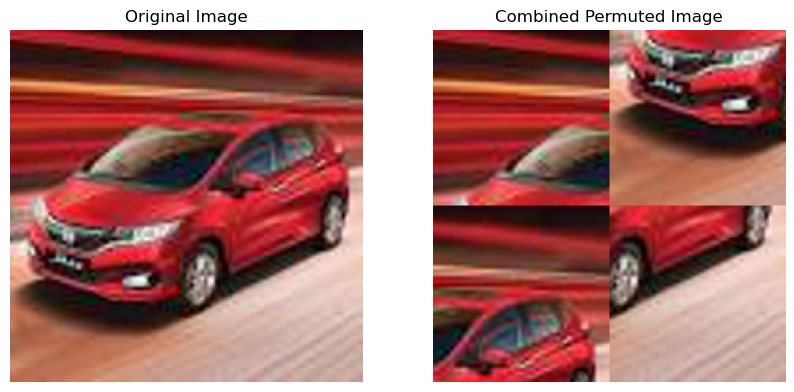

In [70]:

def split_into_tiles(img, num_tiles):
    tiles = []
    height, width, _ = img.shape
    tile_width = width // num_tiles
    tile_height = height // num_tiles

    for y in range(num_tiles):
        for x in range(num_tiles):
            # Crop the image to get the tile
            tile = img[y * tile_height: (y + 1) * tile_height, x * tile_width: (x + 1) * tile_width]
            tiles.append(tile)

    return tiles

def permute_tiles(tiles, num_tiles):
    # Permute the order of tiles
    permuted_tiles = [tiles[(j*num_tiles)+i] for i in range(num_tiles) for j in range(num_tiles)]
    return permuted_tiles

def combine_tiles(tiles, num_tiles):
    tile_height, tile_width, _ = tiles[0].shape
    combined_width = tile_width * num_tiles
    combined_height = tile_height * num_tiles
    combined_image = np.zeros((combined_height, combined_width, 3), dtype=np.uint8)

    for i, tile in enumerate(tiles):
        x = (i % num_tiles) * tile_width
        y = (i // num_tiles) * tile_height
        combined_image[y:y+tile_height, x:x+tile_width, :] = tile

    return combined_image

img_display = images_array[0] 
# Define the number of tiles you want to divide the image into (2 for a 2x2 grid)
num_tiles = 2

# Split the image into tiles
tiles = split_into_tiles(img_display, num_tiles)

# Permute the order of tiles
permuted_tiles = permute_tiles(tiles, num_tiles)

# Combine permuted tiles into a single image
combined_image = combine_tiles(permuted_tiles, num_tiles)

# Display the original and combined images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(img_display)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Combined Permuted Image')
plt.imshow(combined_image)
plt.axis('off')

plt.show()

Another example

In [71]:
combined_images_list = []
for img_array in images_array:
    # Define the number of tiles you want to divide the image into (2 for a 2x2 grid)
    num_tiles = 2

    # Split the image into tiles
    tiles = split_into_tiles(img_array, num_tiles)

    # Permute the order of tiles
    permuted_tiles = permute_tiles(tiles, num_tiles)

    # Combine permuted tiles into a single image
    combined_image = combine_tiles(permuted_tiles, num_tiles)

    # Append the combined image to the list
    combined_images_list.append(combined_image)

# Convert the list of combined images to a numpy array
combined_images_array = np.array(combined_images_list)

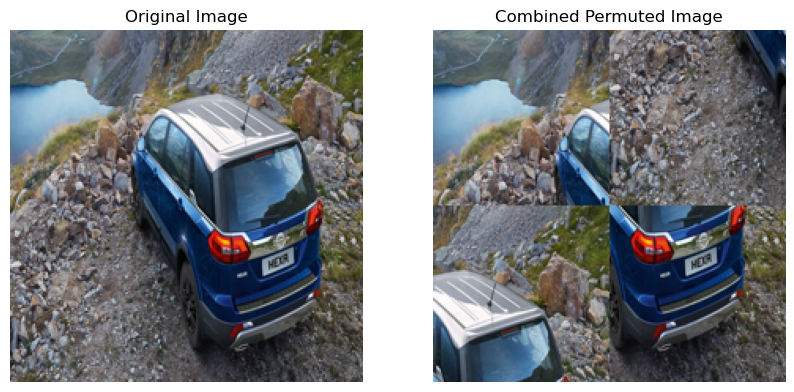

In [72]:
# Display the original and combined images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(images_array[1] )
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Combined Permuted Image')
plt.imshow(combined_images_array[1])
plt.axis('off')

plt.show()


We decided to use a permutation that takes the original picture and turns its rows to columns, keeping the diagonal tilies (which starts at upper left) at their original spot.

### 2x2 Permuteation

In [73]:
combined_images_list = []
for img_array in images_array:
    # Number of tiles you want to divide the image into 
    num_tiles = 2

    # Split the image into tiles
    tiles = split_into_tiles(img_array, num_tiles)

    # Permute the order of tiles
    permuted_tiles = permute_tiles(tiles, num_tiles)

    # Combine permuted tiles into a single image
    combined_image = combine_tiles(permuted_tiles, num_tiles)

    # Append the combined image to the list
    combined_images_list.append(combined_image)

# Convert the list of combined images to a numpy array
combined_images_array2 = np.array(combined_images_list)

In [74]:
# Create loaders

images_tensor_2x2 = torch.from_numpy(combined_images_array2).float()
labels_tensor = torch.from_numpy(labels_array).long()

images_tensor_2x2 = images_tensor_2x2.permute(0, 3, 1, 2)

print(f"Images tensor shape: {images_tensor_2x2.shape}")  # Should be (N, 3, 224, 224)
print(f"Labels tensor shape: {images_tensor_2x2.shape}")

# Split data into training and testing sets
train_images_2x2, test_images_2x2, train_labels_2x2, test_labels_2x2 = train_test_split(images_tensor_2x2, labels_tensor, test_size=0.2, random_state=42)    
    
# Assuming you have defined your images and labels tensors
train_dataset_2x2 = CustomDataset(images=train_images_2x2, labels=train_labels)
test_dataset_2x2 = CustomDataset(images=test_images_2x2, labels=test_labels)

# Define DataLoader
train_loader_2x2 = DataLoader(train_dataset_2x2, batch_size=4, shuffle=True)
test_loader_2x2 = DataLoader(test_dataset_2x2, batch_size=4, shuffle=False)


Images tensor shape: torch.Size([4000, 3, 224, 224])
Labels tensor shape: torch.Size([4000, 3, 224, 224])


### 3x3 Permuteation

In [75]:
combined_images_list = []
for img_array in images_array:
    # Number of tiles you want to divide the image into
    num_tiles = 3

    # Split the image into tiles
    tiles = split_into_tiles(img_array, num_tiles)

    # Permute the order of tiles
    permuted_tiles = permute_tiles(tiles, num_tiles)

    # Combine permuted tiles into a single image
    combined_image = combine_tiles(permuted_tiles, num_tiles)

    # Append the combined image to the list
    combined_images_list.append(combined_image)

# Convert the list of combined images to a numpy array
combined_images_array3 = np.array(combined_images_list)

In [76]:
# Create loaders
images_tensor_3x3 = torch.from_numpy(combined_images_array3).float()
labels_tensor = torch.from_numpy(labels_array).long()

images_tensor_3x3 = images_tensor_3x3.permute(0, 3, 1, 2)

print(f"Images tensor shape: {images_tensor_3x3.shape}")  # Should be (N, 3, 224, 224)
print(f"Labels tensor shape: {labels_tensor.shape}")

# Split data into training and testing sets
train_images_3x3, test_images_3x3, train_labels_3x3, test_labels_3x3 = train_test_split(images_tensor_3x3, labels_tensor, test_size=0.2, random_state=42)    
    
# Assuming you have defined your images and labels tensors
train_dataset_3x3 = CustomDataset(images=train_images_3x3, labels=train_labels_3x3)
test_dataset_3x3 = CustomDataset(images=test_images_3x3, labels=test_labels_3x3)

# Define DataLoader
train_loader_3x3 = DataLoader(train_dataset_3x3, batch_size=4, shuffle=True)
test_loader_3x3 = DataLoader(test_dataset_3x3, batch_size=4, shuffle=False)


Images tensor shape: torch.Size([4000, 3, 222, 222])
Labels tensor shape: torch.Size([4000])


### 4x4 Permuteation

In [77]:
combined_images_list = []
for img_array in images_array:
    # Number of tiles you want to divide the image into
    num_tiles = 4 

    # Split the image into tiles
    tiles = split_into_tiles(img_array, num_tiles)

    # Permute the order of tiles
    permuted_tiles = permute_tiles(tiles, num_tiles)

    # Combine permuted tiles into a single image
    combined_image = combine_tiles(permuted_tiles, num_tiles)

    # Append the combined image to the list
    combined_images_list.append(combined_image)

# Convert the list of combined images to a numpy array
combined_images_array4 = np.array(combined_images_list)

In [78]:
# Create loaders
images_tensor_4x4 = torch.from_numpy(combined_images_array4).float()
labels_tensor = torch.from_numpy(labels_array).long()

images_tensor_4x4 = images_tensor_4x4.permute(0, 3, 1, 2)

print(f"Images tensor shape: {images_tensor_4x4.shape}")  # Should be (N, 3, 224, 224)
print(f"Labels tensor shape: {images_tensor_4x4.shape}")

# Split data into training and testing sets
train_images_4x4, test_images_4x4, train_labels_4x4, test_labels_4x4 = train_test_split(images_tensor_4x4, labels_tensor, test_size=0.2, random_state=42)    
    
# Assuming you have defined your images and labels tensors
train_dataset_4x4 = CustomDataset(images=train_images_4x4, labels=train_labels_4x4)
test_dataset_4x4 = CustomDataset(images=test_images_4x4, labels=test_labels_4x4)

# Define DataLoader
train_loader_4x4 = DataLoader(train_dataset_4x4, batch_size=4, shuffle=True)
test_loader_4x4 = DataLoader(test_dataset_4x4, batch_size=4, shuffle=False)


Images tensor shape: torch.Size([4000, 3, 224, 224])
Labels tensor shape: torch.Size([4000, 3, 224, 224])


### 5x5 Permuteation

In [79]:
combined_images_list = []
for img_array in images_array:
    # Number of tiles you want to divide the image into 
    num_tiles = 5

    # Split the image into tiles
    tiles = split_into_tiles(img_array, num_tiles)

    # Permute the order of tiles
    permuted_tiles = permute_tiles(tiles, num_tiles)

    # Combine permuted tiles into a single image
    combined_image = combine_tiles(permuted_tiles, num_tiles)

    # Append the combined image to the list
    combined_images_list.append(combined_image)

# Convert the list of combined images to a numpy array
combined_images_array5 = np.array(combined_images_list)

In [80]:
# Create loaders
images_tensor_5x5 = torch.from_numpy(combined_images_array5).float()
labels_tensor = torch.from_numpy(labels_array).long()

images_tensor_5x5 = images_tensor_5x5.permute(0, 3, 1, 2)

print(f"Images tensor shape: {images_tensor_5x5.shape}")  # Should be (N, 3, 224, 224)
print(f"Labels tensor shape: {images_tensor_5x5.shape}")

# Split data into training and testing sets
train_images_5x5, test_images_5x5, train_labels_5x5, test_labels_5x5 = train_test_split(images_tensor_5x5, labels_tensor, test_size=0.2, random_state=42)    
    
# Assuming you have defined your images and labels tensors
train_dataset_5x5 = CustomDataset(images=train_images_5x5, labels=train_labels_5x5)
test_dataset_5x5 = CustomDataset(images=test_images_5x5, labels=test_labels_5x5)

# Define DataLoader
train_loader_5x5 = DataLoader(train_dataset_5x5, batch_size=4, shuffle=True)
test_loader_5x5 = DataLoader(test_dataset_5x5, batch_size=4, shuffle=False)


RuntimeError: [enforce fail at alloc_cpu.cpp:80] data. DefaultCPUAllocator: not enough memory: you tried to allocate 2323200000 bytes.

Example of 4x4 image

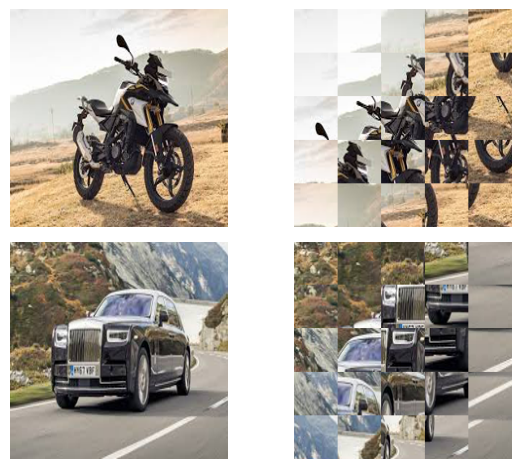

In [82]:
import matplotlib.pyplot as plt

# Create a figure and axes
fig, axes = plt.subplots(2, 2)

# Plotting images in a 2x2 grid
axes[0, 0].imshow(images_array[2721])

axes[0, 1].imshow(combined_images_array5[2721])

axes[1, 0].imshow(images_array[69])

axes[1, 1].imshow(combined_images_array5[69])

# Hide the axes for a cleaner look
for ax in axes.flatten():
    ax.axis('off')

plt.tight_layout()
plt.show()


In [59]:
img_display = images_array[69]  

# Display the image
plt.imshow(img_display)
plt.axis('off')  # Turn off axis numbers and ticks
plt.show()
print(img_display.shape)

IndexError: list index out of range

## Models on premuted data

### Resnet - 2x2

In [290]:
resnet_2x2 = models.resnet18(pretrained=True)
num_ftrs = resnet_2x2.fc.in_features
resnet_2x2.fc = nn.Linear(num_ftrs, 2)  # 2 classes (cars and bikes)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(resnet_2x2.parameters(), lr=0.001)


C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [291]:
num_epochs = 2
print_every = 100

for epoch in range(num_epochs):
    resnet_2x2.train()
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader_2x2, 1):
        optimizer.zero_grad()
        outputs = resnet_2x2(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every 100 iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader_2x2)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0  # Reset running loss
        
        # Compute train accuracy
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")


Epoch [1/2], Iteration [100/800], Loss: 0.6853
Epoch [1/2], Iteration [200/800], Loss: 0.4649
Epoch [1/2], Iteration [300/800], Loss: 0.4897
Epoch [1/2], Iteration [400/800], Loss: 0.4394
Epoch [1/2], Iteration [500/800], Loss: 0.4071
Epoch [1/2], Iteration [600/800], Loss: 0.3143
Epoch [1/2], Iteration [700/800], Loss: 0.4309
Epoch [1/2], Iteration [800/800], Loss: 0.3503
Epoch [1/2], Loss: 0.3311, Train Accuracy: 81.72%
Epoch [2/2], Iteration [100/800], Loss: 0.3355
Epoch [2/2], Iteration [200/800], Loss: 0.3628
Epoch [2/2], Iteration [300/800], Loss: 0.2733
Epoch [2/2], Iteration [400/800], Loss: 0.2825
Epoch [2/2], Iteration [500/800], Loss: 0.2295
Epoch [2/2], Iteration [600/800], Loss: 0.2418
Epoch [2/2], Iteration [700/800], Loss: 0.2555
Epoch [2/2], Iteration [800/800], Loss: 0.2621
Epoch [2/2], Loss: 0.0590, Train Accuracy: 89.88%
Training completed.


In [292]:

# Set the model to evaluation mode
resnet_2x2.eval()

# Initialize variables to track the number of correct predictions and total predictions
correct_test_resnet_2x2 = 0
total_test_resnet_2x2 = 0

# Initialize a list to store predictions for DenseNet
predicted_resnet_2x2 = []

# Disable gradient computation for inference
with torch.no_grad():
    for images, labels in test_loader_2x2:
        # Forward pass to get the model's predictions
        outputs = resnet_2x2(images)
        
        # Get the predictions
        _, predicted = torch.max(outputs.data, 1)
        
        # Append the predictions to the list
        predicted_resnet_2x2.extend(predicted.cpu().tolist())
        
        # Update total and correct predictions
        total_test_resnet_2x2 += labels.size(0)
        correct_test_resnet_2x2 += (predicted == labels).sum().item()

# Calculate test accuracy for DenseNet
test_accuracy_resnet_2x2 = 100 * correct_test_resnet_2x2/ total_test_resnet_2x2
print(f'Test Accuracy for resnet_2x2: {test_accuracy_resnet_2x2:.2f}%')

Test Accuracy for resnet_2x2: 93.50%


### Inception V1 - GoogLeNet - 2x2

In [293]:

googlenet_2x2 = models.googlenet(pretrained=True)
num_ftrs = googlenet_2x2.fc.in_features
googlenet_2x2.fc = nn.Linear(num_ftrs, 2)  # 2 classes (cars and bikes)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(googlenet_2x2.parameters(), lr=0.001)


In [294]:
# Training loop
for epoch in range(num_epochs):
    googlenet_2x2.train()
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader_2x2, 1):
        optimizer.zero_grad()
        outputs = googlenet_2x2(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every print_every iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader_2x2)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0  # Reset running loss
        
        # Compute train accuracy
        _, predicted = torch.max(outputs, 1)  # Use logits for predictions
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")


Epoch [1/2], Iteration [100/800], Loss: 0.4656
Epoch [1/2], Iteration [200/800], Loss: 0.4390
Epoch [1/2], Iteration [300/800], Loss: 0.4203
Epoch [1/2], Iteration [400/800], Loss: 0.3844
Epoch [1/2], Iteration [500/800], Loss: 0.2663
Epoch [1/2], Iteration [600/800], Loss: 0.4617
Epoch [1/2], Iteration [700/800], Loss: 0.4316
Epoch [1/2], Iteration [800/800], Loss: 0.3847
Epoch [1/2], Loss: 0.2659, Train Accuracy: 83.03%
Epoch [2/2], Iteration [100/800], Loss: 0.3129
Epoch [2/2], Iteration [200/800], Loss: 0.3442
Epoch [2/2], Iteration [300/800], Loss: 0.3339
Epoch [2/2], Iteration [400/800], Loss: 0.3087
Epoch [2/2], Iteration [500/800], Loss: 0.2829
Epoch [2/2], Iteration [600/800], Loss: 0.2394
Epoch [2/2], Iteration [700/800], Loss: 0.2452
Epoch [2/2], Iteration [800/800], Loss: 0.1949
Epoch [2/2], Loss: 0.4539, Train Accuracy: 89.09%
Training completed.


In [295]:

# Set the model to evaluation mode
googlenet_2x2.eval()

# Initialize variables to track the number of correct predictions and total predictions
correct_test_glenet_2x2 = 0
total_test_glenet_2x2 = 0

# Initialize a list to store predictions for DenseNet
predicted_glenet_2x2 = []

# Disable gradient computation for inference
with torch.no_grad():
    for images, labels in test_loader_2x2:
        # Forward pass to get the model's predictions
        outputs = googlenet_2x2(images)
        
        # Get the predictions
        _, predicted = torch.max(outputs.data, 1)
        
        # Append the predictions to the list
        predicted_glenet_2x2.extend(predicted.cpu().tolist())
        
        # Update total and correct predictions
        total_test_glenet_2x2 += labels.size(0)
        correct_test_glenet_2x2 += (predicted == labels).sum().item()

# Calculate test accuracy for DenseNet
test_accuracy_glenet_2x2 = 100 * correct_test_glenet_2x2/ total_test_glenet_2x2
print(f'Test Accuracy for glenet_2x2: {test_accuracy_glenet_2x2:.2f}%')

Test Accuracy for glenet_2x2: 94.62%


### DenseNet 2x2

In [296]:

# Load the pretrained DenseNet model and modify it for binary classification
densenet_2x2 = models.densenet121(pretrained=True)
# DenseNet's classifier has 'in_features' attribute; adjust the classifier for 2 output classes
num_ftrs = densenet_2x2.classifier.in_features
densenet_2x2.classifier = nn.Linear(num_ftrs, 2)  # Adjust output size for binary classification

# Initialize optimizer 
optimizer = optim.Adam(densenet_2x2.parameters(), lr=0.001)

# loss function
criterion = nn.CrossEntropyLoss()

# Set number of epochs and print_every
num_epochs = 2
print_every = 100

# Training loop
for epoch in range(num_epochs):
    densenet_2x2.train()  # Set the model to training mode
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader_2x2, 1):
        optimizer.zero_grad()
        outputs = densenet_2x2(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every print_every iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader_2x2)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0  # Reset running loss
        
        # Compute train accuracy
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")


C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/2], Iteration [100/800], Loss: 0.5532
Epoch [1/2], Iteration [200/800], Loss: 0.5614
Epoch [1/2], Iteration [300/800], Loss: 0.4259
Epoch [1/2], Iteration [400/800], Loss: 0.4966
Epoch [1/2], Iteration [500/800], Loss: 0.4146
Epoch [1/2], Iteration [600/800], Loss: 0.3820
Epoch [1/2], Iteration [700/800], Loss: 0.4127
Epoch [1/2], Iteration [800/800], Loss: 0.3328
Epoch [1/2], Loss: 0.9450, Train Accuracy: 81.38%
Epoch [2/2], Iteration [100/800], Loss: 0.3773
Epoch [2/2], Iteration [200/800], Loss: 0.3804
Epoch [2/2], Iteration [300/800], Loss: 0.3547
Epoch [2/2], Iteration [400/800], Loss: 0.4198
Epoch [2/2], Iteration [500/800], Loss: 0.3857
Epoch [2/2], Iteration [600/800], Loss: 0.3639
Epoch [2/2], Iteration [700/800], Loss: 0.3421
Epoch [2/2], Iteration [800/800], Loss: 0.3018
Epoch [2/2], Loss: 1.0894, Train Accuracy: 84.75%
Training completed.


In [297]:

# Set the model to evaluation mode
densenet_2x2.eval()

# Initialize variables to track the number of correct predictions and total predictions
correct_test_densenet_2x2 = 0
total_test_densenet_2x2 = 0

# Initialize a list to store predictions for DenseNet
predicted_densenet_2x2 = []

# Disable gradient computation for inference
with torch.no_grad():
    for images, labels in test_loader_2x2:
        # Forward pass to get the model's predictions
        outputs = densenet_2x2(images)
        
        # Get the predictions
        _, predicted = torch.max(outputs.data, 1)
        
        # Append the predictions to the list
        predicted_densenet_2x2.extend(predicted.cpu().tolist())
        
        # Update total and correct predictions
        total_test_densenet_2x2 += labels.size(0)
        correct_test_densenet_2x2 += (predicted == labels).sum().item()

# Calculate test accuracy for DenseNet
test_accuracy_densenet_2x2 = 100 * correct_test_densenet_2x2/ total_test_densenet_2x2
print(f'Test Accuracy for DenseNet_2x2: {test_accuracy_densenet_2x2:.2f}%')

Test Accuracy for DenseNet_2x2: 93.50%


### Resnet - 3x3

In [127]:
resnet_3x3 = models.resnet18(pretrained=True)
num_ftrs = resnet_3x3.fc.in_features
resnet_3x3.fc = nn.Linear(num_ftrs, 2)  # 2 classes (cars and bikes)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(resnet_3x3.parameters(), lr=0.001)


C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [128]:
num_epochs = 2
print_every = 100

for epoch in range(num_epochs):
    resnet_3x3.train()
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader_3x3, 1):
        optimizer.zero_grad()
        outputs = resnet_3x3(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every 100 iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader_3x3)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0  # Reset running loss
        
        # Compute train accuracy
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")


Epoch [1/2], Iteration [100/800], Loss: 0.6941
Epoch [1/2], Iteration [200/800], Loss: 0.5187
Epoch [1/2], Iteration [300/800], Loss: 0.5494
Epoch [1/2], Iteration [400/800], Loss: 0.4278
Epoch [1/2], Iteration [500/800], Loss: 0.4849
Epoch [1/2], Iteration [600/800], Loss: 0.4224
Epoch [1/2], Iteration [700/800], Loss: 0.4033
Epoch [1/2], Iteration [800/800], Loss: 0.4472
Epoch [1/2], Loss: 0.5393, Train Accuracy: 78.62%
Epoch [2/2], Iteration [100/800], Loss: 0.4318
Epoch [2/2], Iteration [200/800], Loss: 0.3361
Epoch [2/2], Iteration [300/800], Loss: 0.3532
Epoch [2/2], Iteration [400/800], Loss: 0.3683
Epoch [2/2], Iteration [500/800], Loss: 0.3542
Epoch [2/2], Iteration [600/800], Loss: 0.3529
Epoch [2/2], Iteration [700/800], Loss: 0.3988
Epoch [2/2], Iteration [800/800], Loss: 0.3822
Epoch [2/2], Loss: 0.2839, Train Accuracy: 84.94%
Training completed.


In [129]:

# Set the model to evaluation mode
resnet_3x3.eval()

# Initialize variables to track the number of correct predictions and total predictions
correct_test_resnet_3x3 = 0
total_test_resnet_3x3 = 0

# Initialize a list to store predictions for DenseNet
predicted_resnet_3x3 = []

# Disable gradient computation for inference
with torch.no_grad():
    for images, labels in test_loader_3x3:
        # Forward pass to get the model's predictions
        outputs = resnet_3x3(images)
        
        # Get the predictions
        _, predicted = torch.max(outputs.data, 1)
        
        # Append the predictions to the list
        predicted_resnet_3x3.extend(predicted.cpu().tolist())
        
        # Update total and correct predictions
        total_test_resnet_3x3 += labels.size(0)
        correct_test_resnet_3x3 += (predicted == labels).sum().item()

# Calculate test accuracy for DenseNet
test_accuracy_resnet_3x3 = 100 * correct_test_resnet_3x3 / total_test_resnet_3x3
print(f'Test Accuracy for resnet_3x3: {test_accuracy_resnet_3x3:.2f}%')

Test Accuracy for resnet_3x3: 94.38%


### Inception V1 - GoogLeNet - 3x3

In [262]:

googlenet_3x3 = models.googlenet(pretrained=True)
num_ftrs = googlenet_3x3.fc.in_features
googlenet_3x3.fc = nn.Linear(num_ftrs, 2)  # 2 classes (cars and bikes)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(googlenet_3x3.parameters(), lr=0.001)


In [263]:
# Training loop
for epoch in range(num_epochs):
    googlenet_3x3.train()
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader_3x3, 1):
        optimizer.zero_grad()
        outputs = googlenet_3x3(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every print_every iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader_3x3)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0  # Reset running loss
        
        # Compute train accuracy
        _, predicted = torch.max(outputs, 1)  # Use logits for predictions
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")


Epoch [1/2], Iteration [100/800], Loss: 0.5391
Epoch [1/2], Iteration [200/800], Loss: 0.5130
Epoch [1/2], Iteration [300/800], Loss: 0.4151
Epoch [1/2], Iteration [400/800], Loss: 0.3809
Epoch [1/2], Iteration [500/800], Loss: 0.4240
Epoch [1/2], Iteration [600/800], Loss: 0.3858
Epoch [1/2], Iteration [700/800], Loss: 0.3755
Epoch [1/2], Iteration [800/800], Loss: 0.3626
Epoch [1/2], Loss: 0.1675, Train Accuracy: 81.84%
Epoch [2/2], Iteration [100/800], Loss: 0.3740
Epoch [2/2], Iteration [200/800], Loss: 0.3457
Epoch [2/2], Iteration [300/800], Loss: 0.3407
Epoch [2/2], Iteration [400/800], Loss: 0.3205
Epoch [2/2], Iteration [500/800], Loss: 0.2847
Epoch [2/2], Iteration [600/800], Loss: 0.2550
Epoch [2/2], Iteration [700/800], Loss: 0.3363
Epoch [2/2], Iteration [800/800], Loss: 0.2978
Epoch [2/2], Loss: 0.3871, Train Accuracy: 86.78%
Training completed.


In [65]:

# Set the model to evaluation mode
googlenet_3x3.eval()

# Initialize variables to track the number of correct predictions and total predictions
correct_test_glenet_3x3 = 0
total_test_glenet_3x3 = 0

# Initialize a list to store predictions for DenseNet
predicted_glenet_3x3 = []

# Disable gradient computation for inference
with torch.no_grad():
    for images, labels in test_loader_3x3:
        # Forward pass to get the model's predictions
        outputs = googlenet_3x3(images)
        
        # Get the predictions
        _, predicted = torch.max(outputs.data, 1)
        
        # Append the predictions to the list
        predicted_glenet_3x3.extend(predicted.cpu().tolist())
        
        # Update total and correct predictions
        total_test_glenet_3x3 += labels.size(0)
        correct_test_glenet_3x3 += (predicted == labels).sum().item()

# Calculate test accuracy for DenseNet
test_accuracy_glenet_3x3 = 100 * correct_test_glenet_3x3 / total_test_glenet_3x3
print(f'Test Accuracy for glenet_3x3: {test_accuracy_glenet_3x3:.2f}%')

Test Accuracy for glenet_3x3: 95.50%


### DenseNet 3x3

In [39]:

# Load the pretrained DenseNet model and modify it for binary classification
densenet_3x3 = models.densenet121(pretrained=True)
# DenseNet's classifier has 'in_features' attribute; adjust the classifier for 2 output classes
num_ftrs = densenet_2x2.classifier.in_features
densenet_3x3.classifier = nn.Linear(num_ftrs, 2)  # Adjust output size for binary classification

# Initialize optimizer 
optimizer = optim.Adam(densenet_3x3.parameters(), lr=0.001)

# loss function 
criterion = nn.CrossEntropyLoss()

# Set number of epochs and print_every
num_epochs = 2
print_every = 100

# Training loop
for epoch in range(num_epochs):
    densenet_3x3.train()  # Set the model to training mode
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader_3x3, 1):
        optimizer.zero_grad()
        outputs = densenet_3x3(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every print_every iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader_2x2)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0  # Reset running loss
        
        # Compute train accuracy
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")


Epoch [1/2], Iteration [100/800], Loss: 0.6010
Epoch [1/2], Iteration [200/800], Loss: 0.5462
Epoch [1/2], Iteration [300/800], Loss: 0.4657
Epoch [1/2], Iteration [400/800], Loss: 0.4771
Epoch [1/2], Iteration [500/800], Loss: 0.4591
Epoch [1/2], Iteration [600/800], Loss: 0.3975
Epoch [1/2], Iteration [700/800], Loss: 0.3975
Epoch [1/2], Iteration [800/800], Loss: 0.3536
Epoch [1/2], Loss: 0.0482, Train Accuracy: 79.91%
Epoch [2/2], Iteration [100/800], Loss: 0.4595
Epoch [2/2], Iteration [200/800], Loss: 0.3922
Epoch [2/2], Iteration [300/800], Loss: 0.3966
Epoch [2/2], Iteration [400/800], Loss: 0.4822
Epoch [2/2], Iteration [500/800], Loss: 0.3929
Epoch [2/2], Iteration [600/800], Loss: 0.3303
Epoch [2/2], Iteration [700/800], Loss: 0.3801
Epoch [2/2], Iteration [800/800], Loss: 0.3332
Epoch [2/2], Loss: 0.2207, Train Accuracy: 83.28%
Training completed.


In [66]:

# Set the model to evaluation mode
densenet_3x3.eval()

# Initialize variables to track the number of correct predictions and total predictions
correct_test_densenet_3x3 = 0
total_test_densenet_3x3 = 0

# Initialize a list to store predictions for DenseNet
predicted_densenet_3x3 = []

# Disable gradient computation for inference
with torch.no_grad():
    for images, labels in test_loader_3x3:
        # Forward pass to get the model's predictions
        outputs = densenet_3x3(images)
        
        # Get the predictions
        _, predicted = torch.max(outputs.data, 1)
        
        # Append the predictions to the list
        predicted_densenet_3x3.extend(predicted.cpu().tolist())
        
        # Update total and correct predictions
        total_test_densenet_3x3 += labels.size(0)
        correct_test_densenet_3x3 += (predicted == labels).sum().item()

# Calculate test accuracy for DenseNet
test_accuracy_densenet_3x3 = 100 * correct_test_densenet_3x3 / total_test_densenet_3x3
print(f'Test Accuracy for DenseNet: {test_accuracy_densenet_3x3:.2f}%')

Test Accuracy for DenseNet: 94.50%


### Resnet - 4x4

In [26]:
resnet_4x4 = models.resnet18(pretrained=True)
num_ftrs = resnet_4x4.fc.in_features
resnet_4x4.fc = nn.Linear(num_ftrs, 2)  # 2 classes (cars and bikes)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(resnet_4x4.parameters(), lr=0.001)


C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [27]:
num_epochs = 2
print_every = 100

for epoch in range(num_epochs):
    resnet_4x4.train()
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader_4x4, 1):
        optimizer.zero_grad()
        outputs = resnet_4x4(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every 100 iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader_4x4)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0  # Reset running loss
        
        # Compute train accuracy
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")


Epoch [1/2], Iteration [100/800], Loss: 0.7027
Epoch [1/2], Iteration [200/800], Loss: 0.5126
Epoch [1/2], Iteration [300/800], Loss: 0.4847
Epoch [1/2], Iteration [400/800], Loss: 0.4223
Epoch [1/2], Iteration [500/800], Loss: 0.4725
Epoch [1/2], Iteration [600/800], Loss: 0.4634
Epoch [1/2], Iteration [700/800], Loss: 0.4315
Epoch [1/2], Iteration [800/800], Loss: 0.4746
Epoch [1/2], Loss: 0.3811, Train Accuracy: 78.78%
Epoch [2/2], Iteration [100/800], Loss: 0.3843
Epoch [2/2], Iteration [200/800], Loss: 0.3964
Epoch [2/2], Iteration [300/800], Loss: 0.2325
Epoch [2/2], Iteration [400/800], Loss: 0.3940
Epoch [2/2], Iteration [500/800], Loss: 0.3565
Epoch [2/2], Iteration [600/800], Loss: 0.4387
Epoch [2/2], Iteration [700/800], Loss: 0.3629
Epoch [2/2], Iteration [800/800], Loss: 0.3802
Epoch [2/2], Loss: 0.0616, Train Accuracy: 85.19%
Training completed.


In [86]:
resnet_4x4.eval()  # Set the model to evaluation mode
correct_test = 0
total_test = 0
predicted_resnet_4x4 = []  # Initialize a list to store predictions for ResNet 4x4

with torch.no_grad():
    for images, labels in test_loader_4x4:
        outputs = resnet_4x4(images)
        _, predicted = torch.max(outputs.data, 1)
        predicted_resnet_4x4.extend(predicted.cpu().tolist())  # Append predictions to the list
        total_test += labels.size(0)
        correct_test += (predicted == labels).sum().item()

print(f'Test Accuracy: {(100 * correct_test / total_test):.2f}%')



Test Accuracy: 91.12%


### Inception V1 - GoogLeNet - 4x4

In [28]:

# GoogLeNet model with 3 input channels and 2 output classes for binary classification
googlenet_4x4 = models.googlenet(pretrained=True)
googlenet_4x4.fc = nn.Linear(1024, 2)  # Adjust output size for binary classification

# Assuming you have defined your images and labels tensors and DataLoader
# Initialize optimizer (e.g., Adam optimizer)
optimizer = optim.Adam(googlenet_4x4.parameters(), lr=0.001)

# loss function 
criterion = nn.CrossEntropyLoss()
# Set number of epochs and print_every
num_epochs = 2
print_every = 100

# Training loop
for epoch in range(num_epochs):
    googlenet_4x4.train()
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader_4x4, 1):
        optimizer.zero_grad()
        outputs = googlenet_4x4(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every print_every iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0  # Reset running loss
        
        # Compute train accuracy
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")


C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/2], Iteration [100/800], Loss: 0.5273
Epoch [1/2], Iteration [200/800], Loss: 0.3674
Epoch [1/2], Iteration [300/800], Loss: 0.4564
Epoch [1/2], Iteration [400/800], Loss: 0.3919
Epoch [1/2], Iteration [500/800], Loss: 0.4147
Epoch [1/2], Iteration [600/800], Loss: 0.3841
Epoch [1/2], Iteration [700/800], Loss: 0.3685
Epoch [1/2], Iteration [800/800], Loss: 0.3296
Epoch [1/2], Loss: 0.3773, Train Accuracy: 83.34%
Epoch [2/2], Iteration [100/800], Loss: 0.3321
Epoch [2/2], Iteration [200/800], Loss: 0.3611
Epoch [2/2], Iteration [300/800], Loss: 0.3675
Epoch [2/2], Iteration [400/800], Loss: 0.3525
Epoch [2/2], Iteration [500/800], Loss: 0.2516
Epoch [2/2], Iteration [600/800], Loss: 0.3156
Epoch [2/2], Iteration [700/800], Loss: 0.3131
Epoch [2/2], Iteration [800/800], Loss: 0.2939
Epoch [2/2], Loss: 0.2156, Train Accuracy: 87.09%
Training completed.


In [87]:
googlenet_4x4.eval()  # Set the model to evaluation mode
correct_test = 0
total_test = 0
predicted_googlenet_4x4 = []  # Initialize a list to store predictions

with torch.no_grad():
    for images, labels in test_loader_4x4:
        # Forward pass
        outputs = googlenet_4x4(images)

        # Compute the prediction by selecting the class with the highest score
        _, predicted = torch.max(outputs.data, 1)

        # Append predictions to the list
        predicted_googlenet_4x4.extend(predicted.cpu().tolist())

        # Update total and correctly predicted counts
        total_test += labels.size(0)
        correct_test += (predicted == labels).sum().item()

# Calculate and print test accuracy
test_accuracy = 100 * correct_test / total_test
print(f'Test Accuracy: {test_accuracy:.2f}%')



Test Accuracy: 94.50%


### DenseNet 4x4

In [66]:

# Load the pretrained DenseNet model and modify it for binary classification
densenet_4x4 = models.densenet121(pretrained=True)
# DenseNet's classifier has 'in_features' attribute; adjust the classifier for 2 output classes
num_ftrs = densenet_4x4.classifier.in_features
densenet_4x4.classifier = nn.Linear(num_ftrs, 2)  # Adjust output size for binary classification

# Initialize optimizer 
optimizer = optim.Adam(densenet_4x4.parameters(), lr=0.001)

# loss function
criterion = nn.CrossEntropyLoss()

# Set number of epochs and print_every
num_epochs = 2
print_every = 100

# Training loop
for epoch in range(num_epochs):
    densenet_4x4.train()  # Set the model to training mode
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader_4x4, 1):
        optimizer.zero_grad()
        outputs = densenet_4x4(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every print_every iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader_4x4)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0  # Reset running loss
        
        # Compute train accuracy
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")


Epoch [1/2], Iteration [100/800], Loss: 0.6762
Epoch [1/2], Iteration [200/800], Loss: 0.5402
Epoch [1/2], Iteration [300/800], Loss: 0.5631
Epoch [1/2], Iteration [400/800], Loss: 0.4157
Epoch [1/2], Iteration [500/800], Loss: 0.4181
Epoch [1/2], Iteration [600/800], Loss: 0.4630
Epoch [1/2], Iteration [700/800], Loss: 0.5520
Epoch [1/2], Iteration [800/800], Loss: 0.4392
Epoch [1/2], Loss: 1.1513, Train Accuracy: 78.28%
Epoch [2/2], Iteration [100/800], Loss: 0.4003
Epoch [2/2], Iteration [200/800], Loss: 0.4521
Epoch [2/2], Iteration [300/800], Loss: 0.5006
Epoch [2/2], Iteration [400/800], Loss: 0.4003
Epoch [2/2], Iteration [500/800], Loss: 0.4419
Epoch [2/2], Iteration [600/800], Loss: 0.4414
Epoch [2/2], Iteration [700/800], Loss: 0.3680
Epoch [2/2], Iteration [800/800], Loss: 0.4465
Epoch [2/2], Loss: 0.4867, Train Accuracy: 81.62%
Training completed.


In [88]:
densenet_4x4.eval()  # Set the model to evaluation mode
correct_test = 0
total_test = 0
predicted_densenet_4x4 = []  # Initialize a list to store predictions for DenseNet 4x4

with torch.no_grad():
    for images, labels in test_loader_4x4:
        # Forward pass to get the model's predictions
        outputs = densenet_4x4(images)
        _, predicted = torch.max(outputs.data, 1)
        
        # Append the predictions to the list
        predicted_densenet_4x4.extend(predicted.cpu().tolist())
        
        # Update total and correctly predicted counts
        total_test += labels.size(0)
        correct_test += (predicted == labels).sum().item()

# Calculate and print test accuracy
test_accuracy = 100 * correct_test / total_test
print(f'Test Accuracy: {test_accuracy:.2f}%')



Test Accuracy: 90.38%
Saved DenseNet 4x4 predictions.


### Resnet - 5x5

In [30]:
resnet_5x5 = models.resnet18(pretrained=True)
num_ftrs = resnet_5x5.fc.in_features
resnet_5x5.fc = nn.Linear(num_ftrs, 2)  # 2 classes (cars and bikes)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(resnet_5x5.parameters(), lr=0.001)


In [31]:
num_epochs = 2
print_every = 100

for epoch in range(num_epochs):
    resnet_5x5.train()
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader_5x5, 1):
        optimizer.zero_grad()
        outputs = resnet_5x5(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every 100 iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader_5x5)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0  # Reset running loss
        
        # Compute train accuracy
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")


Epoch [1/2], Iteration [100/800], Loss: 0.6674
Epoch [1/2], Iteration [200/800], Loss: 0.5762
Epoch [1/2], Iteration [300/800], Loss: 0.5436
Epoch [1/2], Iteration [400/800], Loss: 0.4338
Epoch [1/2], Iteration [500/800], Loss: 0.3681
Epoch [1/2], Iteration [600/800], Loss: 0.4222
Epoch [1/2], Iteration [700/800], Loss: 0.3282
Epoch [1/2], Iteration [800/800], Loss: 0.4290
Epoch [1/2], Loss: 0.0792, Train Accuracy: 80.69%
Epoch [2/2], Iteration [100/800], Loss: 0.3657
Epoch [2/2], Iteration [200/800], Loss: 0.3308
Epoch [2/2], Iteration [300/800], Loss: 0.4174
Epoch [2/2], Iteration [400/800], Loss: 0.4340
Epoch [2/2], Iteration [500/800], Loss: 0.3682
Epoch [2/2], Iteration [600/800], Loss: 0.3649
Epoch [2/2], Iteration [700/800], Loss: 0.3234
Epoch [2/2], Iteration [800/800], Loss: 0.2438
Epoch [2/2], Loss: 0.2070, Train Accuracy: 86.09%
Training completed.


In [89]:
resnet_5x5.eval()  # Set the model to evaluation mode
correct_test = 0
total_test = 0
predicted_resnet_5x5 = []  # Initialize a list to store predictions for ResNet 5x5

with torch.no_grad():
    for images, labels in test_loader_5x5:
        # Forward pass to get the model's predictions
        outputs = resnet_5x5(images)
        _, predicted = torch.max(outputs.data, 1)
        
        # Append the predictions to the list
        predicted_resnet_5x5.extend(predicted.cpu().tolist())
        
        # Update the total and correct counts
        total_test += labels.size(0)
        correct_test += (predicted == labels).sum().item()

# Calculate and print the accuracy of the model on the test dataset
test_accuracy = 100 * correct_test / total_test
print(f'Test Accuracy: {test_accuracy:.2f}%')


Test Accuracy: 91.38%


### Inception V1 - GoogLeNet - 5x5

In [32]:

# Assuming GoogLeNet model with 3 input channels and 2 output classes for binary classification
googlenet_5x5 = models.googlenet(pretrained=True)
googlenet_5x5.fc = nn.Linear(1024, 2)  # Adjust output size for binary classification

# Initialize optimizer 
optimizer = optim.Adam(googlenet_5x5.parameters(), lr=0.001)

# loss function
criterion = nn.CrossEntropyLoss()
# Set number of epochs and print_every
num_epochs = 2
print_every = 100

# Training loop
for epoch in range(num_epochs):
    googlenet_5x5.train()
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader_5x5, 1):
        optimizer.zero_grad()
        outputs = googlenet_5x5(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every print_every iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0  # Reset running loss
        
        # Compute train accuracy
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")


Epoch [1/2], Iteration [100/800], Loss: 0.5077
Epoch [1/2], Iteration [200/800], Loss: 0.4080
Epoch [1/2], Iteration [300/800], Loss: 0.4631
Epoch [1/2], Iteration [400/800], Loss: 0.4323
Epoch [1/2], Iteration [500/800], Loss: 0.4285
Epoch [1/2], Iteration [600/800], Loss: 0.3817
Epoch [1/2], Iteration [700/800], Loss: 0.3474
Epoch [1/2], Iteration [800/800], Loss: 0.3600
Epoch [1/2], Loss: 1.0268, Train Accuracy: 82.97%
Epoch [2/2], Iteration [100/800], Loss: 0.3628
Epoch [2/2], Iteration [200/800], Loss: 0.3610
Epoch [2/2], Iteration [300/800], Loss: 0.3327
Epoch [2/2], Iteration [400/800], Loss: 0.3272
Epoch [2/2], Iteration [500/800], Loss: 0.3253
Epoch [2/2], Iteration [600/800], Loss: 0.3323
Epoch [2/2], Iteration [700/800], Loss: 0.3122
Epoch [2/2], Iteration [800/800], Loss: 0.2909
Epoch [2/2], Loss: 0.0458, Train Accuracy: 86.81%
Training completed.


In [90]:
googlenet_5x5.eval()  # Set the model to evaluation mode
correct_test = 0
total_test = 0
predicted_googlenet_5x5 = []  # Initialize a list to store predictions for GoogLeNet 5x5

with torch.no_grad():
    for images, labels in test_loader_5x5:
        # Forward pass to get the model's predictions
        outputs = googlenet_5x5(images)
        _, predicted = torch.max(outputs.data, 1)
        
        # Append the predictions to the list
        predicted_googlenet_5x5.extend(predicted.cpu().tolist())
        
        # Update the total and correct counters
        total_test += labels.size(0)
        correct_test += (predicted == labels).sum().item()

# Calculate the accuracy of the model on the test dataset
test_accuracy = 100 * correct_test / total_test
print(f'Test Accuracy: {test_accuracy:.2f}%')



Test Accuracy: 93.38%


### Densnet 5x5

In [68]:

# Load the pretrained DenseNet model and modify it for binary classification
densenet_5x5 = models.densenet121(pretrained=True)
# Adjust the classifier for 2 output classes, specific for your binary classification task
num_ftrs = densenet_5x5.classifier.in_features
densenet_5x5.classifier = nn.Linear(num_ftrs, 2)  # Adjust output size for binary classification

# Initialize optimizer 
optimizer = optim.Adam(densenet_5x5.parameters(), lr=0.001)

# loss function
criterion = nn.CrossEntropyLoss()

# Set number of epochs and print_every
num_epochs = 2
print_every = 100

# Training loop
for epoch in range(num_epochs):
    densenet_5x5.train()  # Set the model to training mode
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader_5x5, 1):
        optimizer.zero_grad()
        outputs = densenet_5x5(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every print_every iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader_5x5)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0  # Reset running loss
        
        # Compute train accuracy
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")


Epoch [1/2], Iteration [100/800], Loss: 0.6807
Epoch [1/2], Iteration [200/800], Loss: 0.5377
Epoch [1/2], Iteration [300/800], Loss: 0.4412
Epoch [1/2], Iteration [400/800], Loss: 0.4812
Epoch [1/2], Iteration [500/800], Loss: 0.4759
Epoch [1/2], Iteration [600/800], Loss: 0.4483
Epoch [1/2], Iteration [700/800], Loss: 0.4307
Epoch [1/2], Iteration [800/800], Loss: 0.4152
Epoch [1/2], Loss: 0.8469, Train Accuracy: 79.00%
Epoch [2/2], Iteration [100/800], Loss: 0.3745
Epoch [2/2], Iteration [200/800], Loss: 0.4499
Epoch [2/2], Iteration [300/800], Loss: 0.5030
Epoch [2/2], Iteration [400/800], Loss: 0.2978
Epoch [2/2], Iteration [500/800], Loss: 0.3595
Epoch [2/2], Iteration [600/800], Loss: 0.3744
Epoch [2/2], Iteration [700/800], Loss: 0.2914
Epoch [2/2], Iteration [800/800], Loss: 0.4155
Epoch [2/2], Loss: 0.4779, Train Accuracy: 84.72%
Training completed.


In [91]:
densenet_5x5.eval()  # Set the model to evaluation mode
correct_test = 0
total_test = 0
predicted_densenet_5x5 = []  # Initialize a list to store predictions for DenseNet 5x5

with torch.no_grad():
    for images, labels in test_loader_5x5:
        # Forward pass to get the model's predictions
        outputs = densenet_5x5(images)
        _, predicted = torch.max(outputs.data, 1)
        
        # Append the predictions to the list
        predicted_densenet_5x5.extend(predicted.cpu().tolist())
        
        # Update the total and correctly predicted counts
        total_test += labels.size(0)
        correct_test += (predicted == labels).sum().item()

# Calculate and print the accuracy of the model on the test dataset
test_accuracy = 100 * correct_test / total_test
print(f'Test Accuracy: {test_accuracy:.2f}%')




Test Accuracy: 74.38%


## Evaluation

### Resnet

In [154]:

# Calculate accuracy, precision, recall, and F1 score
accuracy = accuracy_score(true_labels, predicted_resnet)
precision, recall, f1, _ = precision_recall_fscore_support(predicted_resnet, true_labels , average='binary')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Generate and analyze the confusion matrix
conf_matrix = confusion_matrix(predicted_resnet, true_labels)
print("Confusion Matrix:")
print(conf_matrix)


Accuracy: 0.9537
Precision: 0.9180
Recall: 0.9830
F1 Score: 0.9494
Confusion Matrix:
[[416  31]
 [  6 347]]


### Googlenet

In [155]:

# Calculate accuracy, precision, recall, and F1 score
accuracy = accuracy_score(true_labels, predicted_googlenet)
precision, recall, f1, _ = precision_recall_fscore_support(predicted_googlenet, true_labels, average='binary')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Generate and analyze the confusion matrix
conf_matrix = confusion_matrix(predicted_googlenet, true_labels)
print("Confusion Matrix:")
print(conf_matrix)


Accuracy: 0.9688
Precision: 0.9444
Recall: 0.9889
F1 Score: 0.9662
Confusion Matrix:
[[418  21]
 [  4 357]]


### Densenet

In [156]:

# Calculate accuracy, precision, recall, and F1 score
accuracy = accuracy_score(true_labels, predicted_densenet)
precision, recall, f1, _ = precision_recall_fscore_support(predicted_densenet, true_labels, average='binary')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Generate and analyze the confusion matrix
conf_matrix = confusion_matrix(predicted_densenet, true_labels)
print("Confusion Matrix:")
print(conf_matrix)


Accuracy: 0.9463
Precision: 0.9286
Recall: 0.9564
F1 Score: 0.9423
Confusion Matrix:
[[406  27]
 [ 16 351]]


### Resnet 2x2

In [298]:

# Calculate accuracy, precision, recall, and F1 score
accuracy = accuracy_score(predicted_resnet_2x2, true_labels)
precision, recall, f1, _ = precision_recall_fscore_support(predicted_resnet_2x2, true_labels, average='binary')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Generate and analyze the confusion matrix
conf_matrix = confusion_matrix(predicted_resnet_2x2, true_labels)
print("Confusion Matrix:")
print(conf_matrix)

Accuracy: 0.9350
Precision: 0.9974
Recall: 0.8808
F1 Score: 0.9355
Confusion Matrix:
[[371   1]
 [ 51 377]]


### Googlenet 2x2

In [299]:
# Calculate accuracy, precision, recall, and F1 score
accuracy = accuracy_score(true_labels, predicted_glenet_2x2)
precision, recall, f1, _ = precision_recall_fscore_support(predicted_glenet_2x2, true_labels, average='binary')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Generate and analyze the confusion matrix
conf_matrix = confusion_matrix(predicted_glenet_2x2, true_labels)
print("Confusion Matrix:")
print(conf_matrix)

Accuracy: 0.9463
Precision: 0.9180
Recall: 0.9666
F1 Score: 0.9417
Confusion Matrix:
[[410  31]
 [ 12 347]]


### Densnet 2x2

In [300]:
#### densnet 2x2# Calculate accuracy, precision, recall, and F1 score
accuracy = accuracy_score(true_labels, predicted_densenet_2x2)
precision, recall, f1, _ = precision_recall_fscore_support(predicted_densenet_2x2, true_labels, average='binary')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Generate and analyze the confusion matrix
conf_matrix = confusion_matrix(predicted_densenet_2x2, true_labels)
print("Confusion Matrix:")
print(conf_matrix)

Accuracy: 0.9350
Precision: 0.9365
Recall: 0.9267
F1 Score: 0.9316
Confusion Matrix:
[[394  24]
 [ 28 354]]


### Resnet 3x3

In [158]:

# Calculate accuracy, precision, recall, and F1 score
accuracy = accuracy_score(true_labels, predicted_resnet_3x3)
precision, recall, f1, _ = precision_recall_fscore_support(predicted_resnet_3x3, true_labels, average='binary')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Generate and analyze the confusion matrix
conf_matrix = confusion_matrix(predicted_resnet_3x3, true_labels)
print("Confusion Matrix:")
print(conf_matrix)

Accuracy: 0.9437
Precision: 0.9471
Recall: 0.9347
F1 Score: 0.9409
Confusion Matrix:
[[397  20]
 [ 25 358]]


### Googlenet 3x3

In [381]:
# Calculate accuracy, precision, recall, and F1 score
accuracy = accuracy_score(true_labels, predicted_glenet_3x3)
precision, recall, f1, _ = precision_recall_fscore_support(predicted_glenet_3x3, true_labels, average='binary')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Generate and analyze the confusion matrix
conf_matrix = confusion_matrix(predicted_glenet_3x3, true_labels)
print("Confusion Matrix:")
print(conf_matrix)

Accuracy: 0.9350
Precision: 0.9180
Recall: 0.9429
F1 Score: 0.9303
Confusion Matrix:
[[401  31]
 [ 21 347]]


In [171]:
# Calculate accuracy, precision, recall, and F1 score
accuracy = accuracy_score(true_labels, predicted_glenet_3x3)
precision, recall, f1, _ = precision_recall_fscore_support(predicted_glenet_3x3, true_labels, average='binary')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Generate and analyze the confusion matrix
conf_matrix = confusion_matrix(predicted_glenet_3x3, true_labels)
print("Confusion Matrix:")
print(conf_matrix)

Accuracy: 0.9550
Precision: 0.9259
Recall: 0.9777
F1 Score: 0.9511
Confusion Matrix:
[[414  28]
 [  8 350]]


### Densnet 3x3

In [172]:
#### densnet 3x3# Calculate accuracy, precision, recall, and F1 score
accuracy = accuracy_score(true_labels, predicted_densenet_3x3)
precision, recall, f1, _ = precision_recall_fscore_support(predicted_densenet_3x3, true_labels, average='binary')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Generate and analyze the confusion matrix
conf_matrix = confusion_matrix(predicted_densenet_3x3, true_labels)
print("Confusion Matrix:")
print(conf_matrix)

Accuracy: 0.9450
Precision: 0.9418
Recall: 0.9418
F1 Score: 0.9418
Confusion Matrix:
[[400  22]
 [ 22 356]]


### Resnet4x4

In [159]:

# Calculate accuracy, precision, recall, and F1 score
accuracy = accuracy_score(true_labels, predicted_resnet_4x4)
precision, recall, f1, _ = precision_recall_fscore_support(predicted_resnet_4x4, true_labels, average='binary')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Generate and analyze the confusion matrix
conf_matrix = confusion_matrix(predicted_resnet_4x4, true_labels)
print("Confusion Matrix:")
print(conf_matrix)


Accuracy: 0.9113
Precision: 0.9735
Recall: 0.8578
F1 Score: 0.9120
Confusion Matrix:
[[361  10]
 [ 61 368]]


### Googlenet 4x4

In [160]:

# Calculate accuracy, precision, recall, and F1 score
accuracy = accuracy_score(true_labels, predicted_googlenet_4x4)
precision, recall, f1, _ = precision_recall_fscore_support(predicted_googlenet_4x4, true_labels, average='binary')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Generate and analyze the confusion matrix
conf_matrix = confusion_matrix(predicted_googlenet_4x4, true_labels)
print("Confusion Matrix:")
print(conf_matrix)


Accuracy: 0.9450
Precision: 0.9735
Recall: 0.9154
F1 Score: 0.9436
Confusion Matrix:
[[388  10]
 [ 34 368]]


### Densenet 4x4

In [161]:

# Calculate accuracy, precision, recall, and F1 score
accuracy = accuracy_score(true_labels, predicted_densenet_4x4)
precision, recall, f1, _ = precision_recall_fscore_support(predicted_densenet_4x4, true_labels, average='binary')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Generate and analyze the confusion matrix
conf_matrix = confusion_matrix(predicted_densenet_4x4, true_labels)
print("Confusion Matrix:")
print(conf_matrix)


Accuracy: 0.9038
Precision: 0.9365
Recall: 0.8698
F1 Score: 0.9019
Confusion Matrix:
[[369  24]
 [ 53 354]]


### Resnet 5x5

In [153]:


# Calculate accuracy, precision, recall, and F1 score
accuracy = accuracy_score(true_labels, predicted_resnet_5x5)
precision, recall, f1, _ = precision_recall_fscore_support(predicted_resnet_5x5, true_labels, average='binary')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Generate and analyze the confusion matrix
conf_matrix = confusion_matrix(predicted_resnet_5x5, true_labels)
print("Confusion Matrix:")
print(conf_matrix)


Accuracy: 0.9137
Precision: 0.9418
Recall: 0.8834
F1 Score: 0.9117
Confusion Matrix:
[[375  22]
 [ 47 356]]


### Googlenet 5x5

In [163]:

# Calculate accuracy, precision, recall, and F1 score
accuracy = accuracy_score(true_labels, predicted_googlenet_5x5)
precision, recall, f1, _ = precision_recall_fscore_support(predicted_googlenet_5x5, true_labels, average='binary')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Generate and analyze the confusion matrix
conf_matrix = confusion_matrix(predicted_googlenet_5x5, true_labels)
print("Confusion Matrix:")
print(conf_matrix)


Accuracy: 0.9337
Precision: 0.9735
Recall: 0.8954
F1 Score: 0.9328
Confusion Matrix:
[[379  10]
 [ 43 368]]


### Densenet 5x5

In [164]:

# Calculate accuracy, precision, recall, and F1 score
accuracy = accuracy_score(true_labels, predicted_densenet_5x5)
precision, recall, f1, _ = precision_recall_fscore_support(predicted_densenet_5x5, true_labels, average='binary')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Generate and analyze the confusion matrix
conf_matrix = confusion_matrix(predicted_densenet_5x5, true_labels)
print("Confusion Matrix:")
print(conf_matrix)


Accuracy: 0.7438
Precision: 0.9233
Recall: 0.6648
F1 Score: 0.7730
Confusion Matrix:
[[246  29]
 [176 349]]


### Graphs

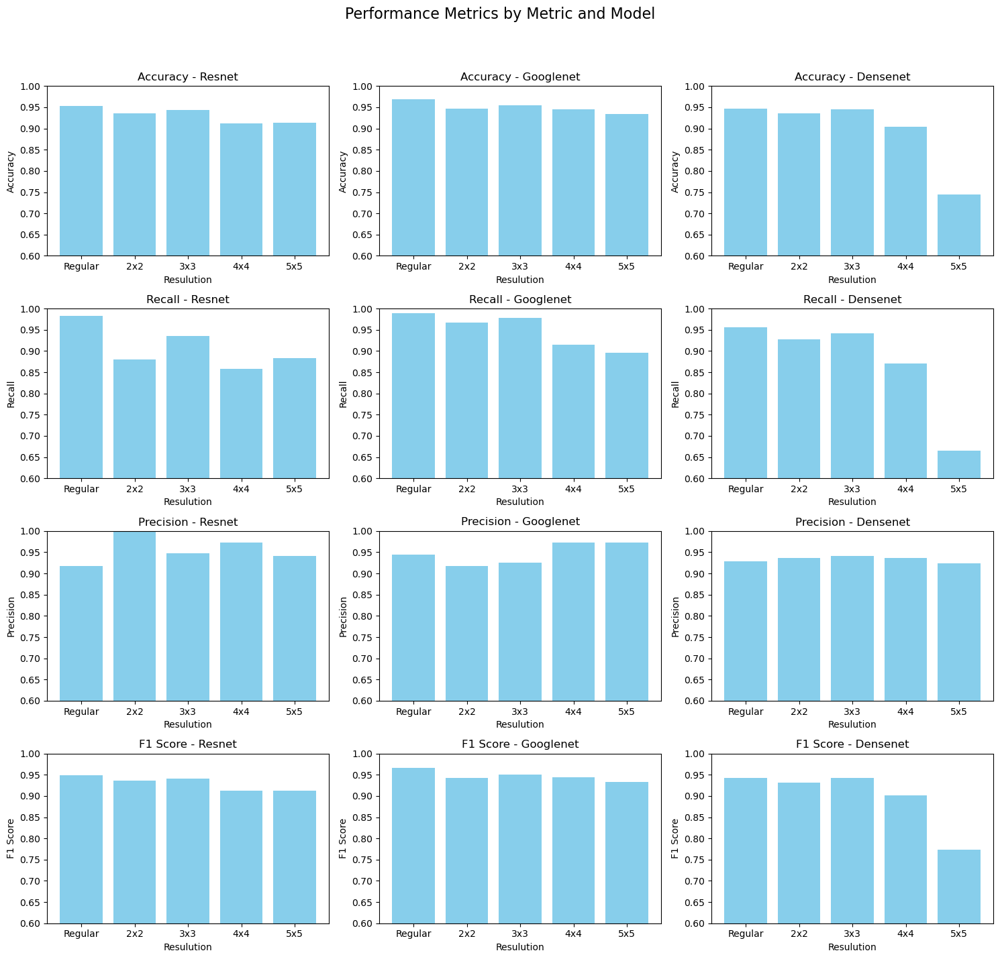

In [301]:

# Define the data
models = ['Resnet', 'Googlenet', 'Densenet']
permutations = ['Regular', '2x2', '3x3', '4x4', '5x5']

resnet_data = {
    'Accuracy': [0.9537, 0.9350, 0.9437, 0.9113, 0.9137],
    'Recall': [0.9830, 0.8808, 0.9347, 0.8578, 0.8834],
    'Precision': [0.9180, 0.9974, 0.9471, 0.9735, 0.9418],
    'F1 Score': [0.9494, 0.9355, 0.9409, 0.9120, 0.9117]
}

googlenet_data = {
    'Accuracy': [0.9688, 0.9463, 0.9550, 0.9450, 0.9337],
    'Recall': [0.9889, 0.9666, 0.9777, 0.9154, 0.8954],
    'Precision': [0.9444, 0.9180, 0.9259, 0.9735, 0.9735],
    'F1 Score': [0.9662, 0.9417, 0.9511, 0.9436, 0.9328]
}

densenet_data = {
    'Accuracy': [0.9463, 0.9350, 0.9450, 0.9038, 0.7438],
    'Recall': [0.9564, 0.9267, 0.9418, 0.8698, 0.6648],
    'Precision': [0.9286,  0.9365, 0.9418, 0.9365, 0.9233],
    'F1 Score': [0.9423, 0.9316, 0.9418, 0.9019, 0.7730]
}

metrics = ['Accuracy', 'Recall','Precision', 'F1 Score']

# Plotting
fig, axes = plt.subplots(4, 3, figsize=(15, 15))
fig.suptitle('Performance Metrics by Metric and Model', fontsize=16)

for i, metric in enumerate(metrics):
    for j, model_data in enumerate([resnet_data, googlenet_data, densenet_data]):
        axes[i, j].bar(permutations, model_data[metric], color='skyblue')
        axes[i, j].set_title(f'{metric} - {models[j]}')
        axes[i, j].set_ylim(0.6, 1)  # Adjust y-limits
        axes[i, j].set_xlabel('Resulution')
        axes[i, j].set_ylabel(metric)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

It looks like there is a decrease in performance when the resulution gets higher, let's look at it in average:

### Average across al resolutions

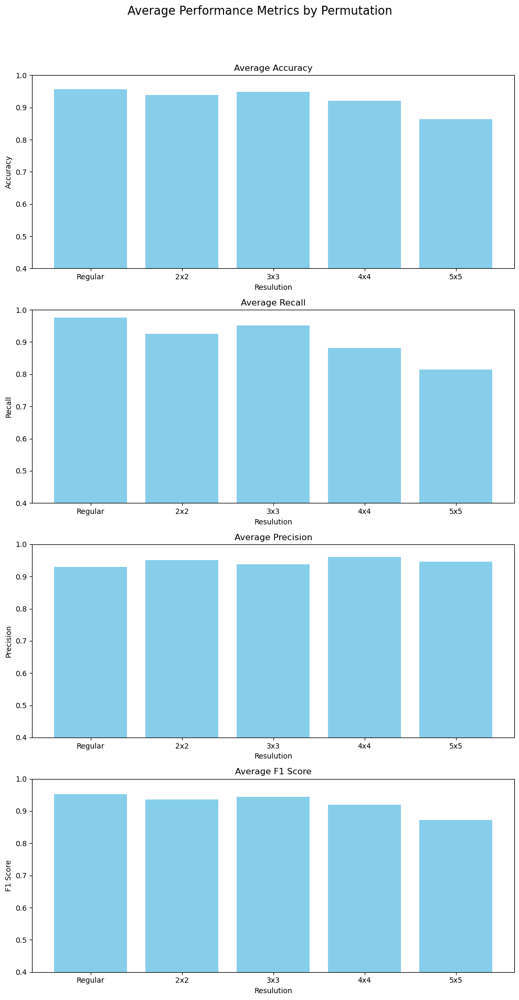

In [302]:

# Calculate average performance for each permutation in each metric
permutation_avg = {}
for metric in metrics:
    permutation_avg[metric] = {
        perm: np.mean([resnet_data[metric][perm_idx], 
                       googlenet_data[metric][perm_idx], 
                       densenet_data[metric][perm_idx]]) 
        for perm_idx, perm in enumerate(permutations)
    }

# Plotting
fig, axes = plt.subplots(4, 1, figsize=(10, 20))
fig.suptitle('Average Performance Metrics by Permutation', fontsize=16)

for i, metric in enumerate(metrics):
    axes[i].bar(permutations, [permutation_avg[metric][perm] for perm in permutations], color='skyblue')
    axes[i].set_title(f'Average {metric}')
    axes[i].set_ylim(0.4, 1)  # Adjust y-limits
    axes[i].set_xlabel('Resulution')
    axes[i].set_ylabel(metric)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

#### Performance decrease

The performence decreases! almost in all metrics except precision which we will discuss later. The general trend of performance degradation in larger permutation settings (like 4x4 and 5x5) could be due to the fact that as you increase the permutation grid, you're essentially introducing more randomness or noise into the label assignment, which any model would struggle with. It loses the spactial context of the image.

#### 3x3 has the best performance (from all tile resolution)

The 3x3 tile resolution achieves superior results because it balances detail and context optimally. By dividing images into neither too large nor too small tiles, it preserves crucial features and their spatial relationships, aiding pattern recognition. This intermediate granularity facilitates effective learning, avoiding the pitfalls of feature loss in larger tiles and excessive fragmentation in finer resolutions.

#### Precision

The precision remains consistently high, indicating that when the model predicts an image to be a bike, it is usually accurate in its classification.
The models consistently identify the positive class (bikes) correctly, regardless of image alterations. This indicates that the models have learned robust and distinctive features of bikes that remain effective even when the images are permuted. It reflects good generalization and suggests the models can be reliably used in various conditions without a drop in the quality of its positive predictions, but there is a drop in quantity as we saw at the confusion matrices above.

### Best model

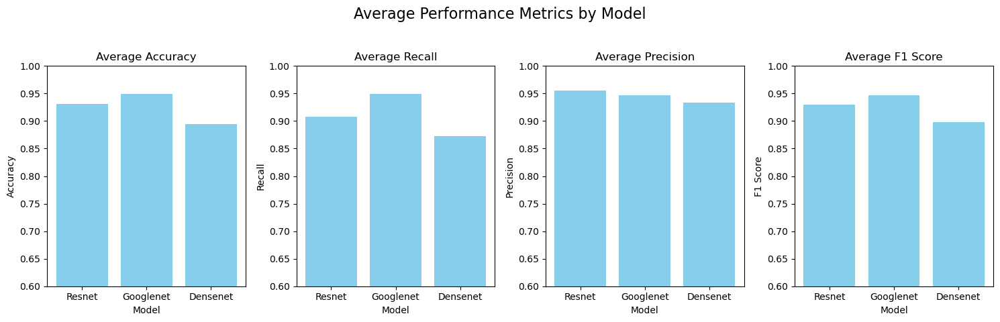

In [303]:

# Calculate average performance for each model
resnet_avg = {metric: np.mean(resnet_data[metric]) for metric in metrics}
googlenet_avg = {metric: np.mean(googlenet_data[metric]) for metric in metrics}
densenet_avg = {metric: np.mean(densenet_data[metric]) for metric in metrics}

# Plotting
fig, axes = plt.subplots(1, 4, figsize=(15, 5))
fig.suptitle('Average Performance Metrics by Model', fontsize=16)

for i, metric in enumerate(metrics):
    axes[i].bar(models, [resnet_avg[metric], googlenet_avg[metric], densenet_avg[metric]], color='skyblue')
    axes[i].set_title(f'Average {metric}')
    axes[i].set_ylim(0.6, 1)  # Adjust y-limits
    axes[i].set_xlabel('Model')
    axes[i].set_ylabel(metric)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

As we can see, the model that performs the best is Googlenet as its average performance across all resulutions (except precision by a small margin) is the best.

This superior performance could be attributed to Googlenet's architecture, which uses Inception modules to capture information at various scales effectively. This allows it to learn more complex features with fewer parameters, leading to better generalization on test data. Additionally, Googlenet's architecture is deep enough to learn a hierarchy of features, yet it avoids overfitting through dimensionality reduction at each stage of the Inception module, making it adept at handling diverse image resolutions and achieving high performance across different metrics.

It should be highlighted that the models in question are standard ones, utilized without any specialized preprocessing or adjustments to their hyperparameters.

### Confusion Matrix

By just looking at the confusion matrices, we can see the following:

As permutations increase, the models generally tend to struggle more with correctly identifying bikes, leading to more FNs. This suggests that bike features are more susceptible to distortion due to permutations.
Car misclassifications (FP) exhibit varied trends across models and permutations. While Resnet and Googlenet improve or maintain a relatively stable FP rate through permutations, Densenet experiences a marked increase in FPs at the highest permutation level (5x5).

Now let's plot, with focus on recall and specifity

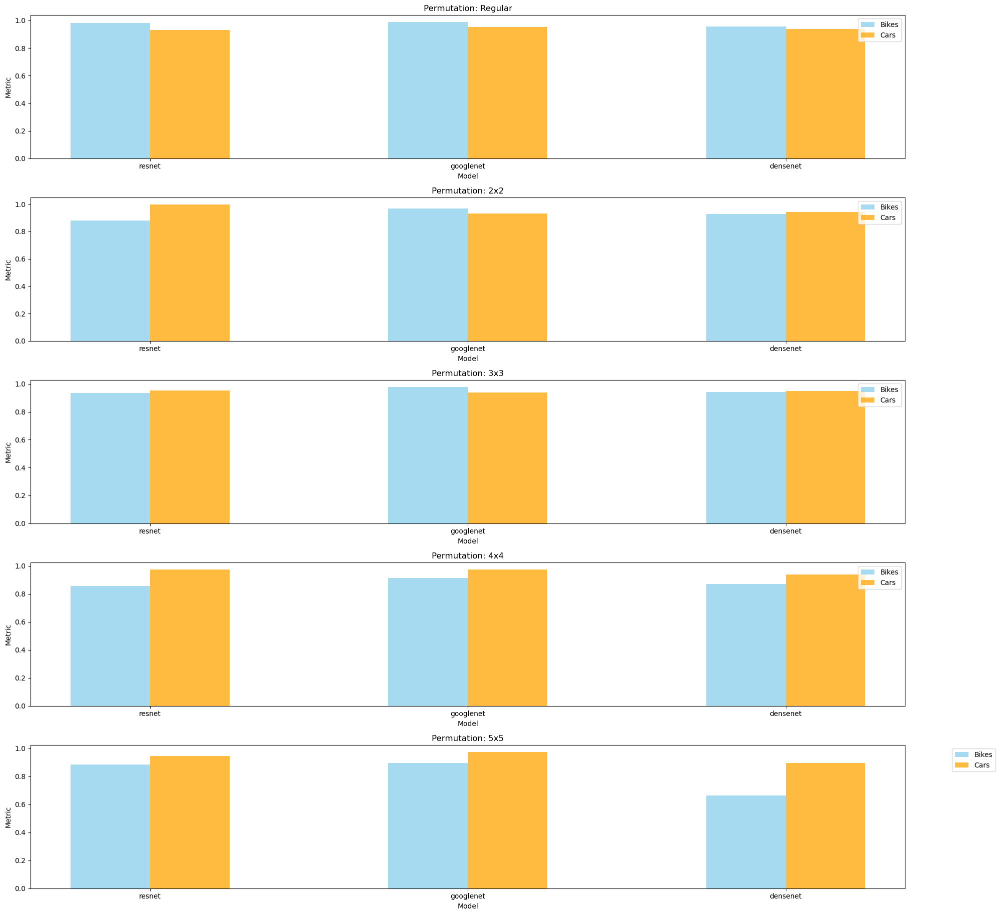

In [304]:
confusion_matrices = {
    ('resnet', 'regular'): [[416, 31], [6, 347]],
    ('resnet', '2x2'): [[371 ,  1], [51, 377]],
    ('resnet', '3x3'): [[397, 20], [25, 358]],
    ('resnet', '4x4'): [[361, 10], [61, 368]],
    ('resnet', '5x5'): [[375, 22], [47, 356]],
    ('googlenet', 'regular'): [[418, 21], [4, 357]],
    ('googlenet', '2x2'): [[410 , 31], [12 ,347]],
    ('googlenet', '3x3'): [[414, 28], [8, 350]],
    ('googlenet', '4x4'): [[388, 10], [34, 368]],
    ('googlenet', '5x5'): [[379, 10], [43, 368]],
    ('densenet', 'regular'): [[406, 27], [16, 351]],
    ('densenet', '2x2'): [[394 , 24], [28 , 354]],
    ('densenet', '3x3'): [[400, 22], [22, 356]],
    ('densenet', '4x4'): [[369, 24], [53, 354]],
    ('densenet', '5x5'): [[246, 29], [176, 349]]
}


# Initialize dictionaries to store metrics
metrics = {'TP/(TP+FN)': [], 'TN/(FP+TN)': []}

# Calculate metrics for each model and permutation
for key, cm in confusion_matrices.items():
    model, permutation = key
    tn, fp, fn, tp = cm[0][0], cm[0][1], cm[1][0], cm[1][1]
    bikes_metric = tp / (tp + fn)
    cars_metric = tn / (fp + tn)
    metrics['TP/(TP+FN)'].append({'model': model, 'permutation': permutation, 'class': 'bike', 'value': bikes_metric})
    metrics['TN/(FP+TN)'].append({'model': model, 'permutation': permutation, 'class': 'car', 'value': cars_metric})

# Initialize lists to store metrics for each model and permutation
bikes_metrics = {'resnet': [], 'googlenet': [], 'densenet': []}
cars_metrics = {'resnet': [], 'googlenet': [], 'densenet': []}

# Calculate metrics for each model and permutation
for key, cm in confusion_matrices.items():
    model, permutation = key
    tn, fp, fn, tp = cm[0][0], cm[0][1], cm[1][0], cm[1][1]
    bikes_metric = tp / (tp + fn)
    cars_metric = tn / (fp + tn)
    bikes_metrics[model].append(bikes_metric)
    cars_metrics[model].append(cars_metric)

# Plotting
fig, axes = plt.subplots(5, 1, figsize=(20, 20))  # Vertical arrangement

for i, perm in enumerate(permutations[:5]):  # Iterate over the first four permutations
    ax = axes[i]
    x = np.arange(3)
    width = 0.25

    for j, model in enumerate(bikes_metrics.keys()):
        bikes_data = bikes_metrics[model][i]
        cars_data = cars_metrics[model][i]
        
        ax.bar(x[j] - width/2, bikes_data, width, color='skyblue', label='Bikes' if j == 0 else '', alpha=0.75)
        ax.bar(x[j] + width/2, cars_data, width, color='orange', label='Cars' if j == 0 else '', alpha=0.75)
        
    ax.set_title(f'Permutation: {perm}')
    ax.set_xticks(x)
    ax.set_xticklabels(bikes_metrics.keys())
    ax.set_xlabel('Model')
    ax.set_ylabel('Metric')

    # Remove legend from individual plots
    ax.legend().set_visible(True)

# Set legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

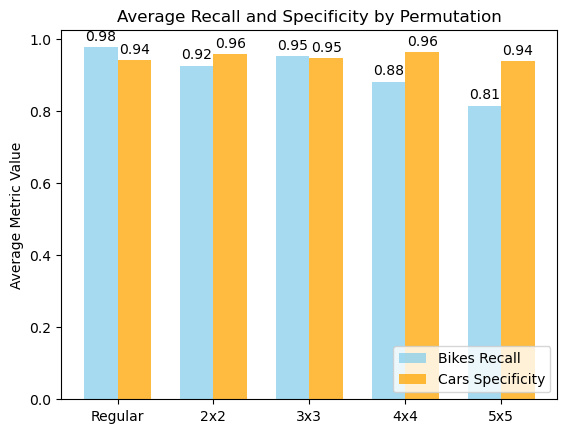

In [305]:

# Initialize dictionaries to store aggregated metrics for each permutation
aggregated_metrics = {'TP/(TP+FN)': {}, 'TN/(FP+TN)': {}}

# Iterate over confusion_matrices to calculate aggregated metrics
for (model, permutation), cm in confusion_matrices.items():
    tn, fp, fn, tp = cm[0][0], cm[0][1], cm[1][0], cm[1][1]
    bikes_metric = tp / (tp + fn)  # Recall for bikes
    cars_metric = tn / (tn + fp)  # Specificity for cars
    
    # Aggregate the metrics
    if permutation not in aggregated_metrics['TP/(TP+FN)']:
        aggregated_metrics['TP/(TP+FN)'][permutation] = []
        aggregated_metrics['TN/(FP+TN)'][permutation] = []
    aggregated_metrics['TP/(TP+FN)'][permutation].append(bikes_metric)
    aggregated_metrics['TN/(FP+TN)'][permutation].append(cars_metric)

# Calculate average metrics for each permutation
average_metrics = {'TP/(TP+FN)': [], 'TN/(FP+TN)': []}
for permutation in ['regular', '2x2', '3x3', '4x4', '5x5']:
    bikes_avg = np.mean(aggregated_metrics['TP/(TP+FN)'][permutation])
    cars_avg = np.mean(aggregated_metrics['TN/(FP+TN)'][permutation])
    average_metrics['TP/(TP+FN)'].append(bikes_avg)
    average_metrics['TN/(FP+TN)'].append(cars_avg)
    
    
# Plotting
x = np.arange(len(average_metrics['TP/(TP+FN)']))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, average_metrics['TP/(TP+FN)'], width, label='Bikes Recall', color='skyblue', alpha=0.75)
rects2 = ax.bar(x + width/2, average_metrics['TN/(FP+TN)'], width, label='Cars Specificity', color='orange', alpha=0.75)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Average Metric Value')
ax.set_title('Average Recall and Specificity by Permutation')
ax.set_xticks(x)
ax.set_xticklabels(['Regular', '2x2', '3x3', '4x4', '5x5'])

# Function to add labels to the bars
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(round(height, 2)),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

# Call the autolabel function for both sets of bars
autolabel(rects1)
autolabel(rects2)

# Move the legend to the bottom right
ax.legend(loc='lower right')

# Display the plot
plt.show()


First, let's talk about the metrics in the graphs:

Bikes Metric: tp / (tp + fn)
This metric calculates the Recall or Sensitivity for the class labeled as "bikes." It's a measure of the model's ability to correctly identify all relevant instances of the "bike" class.

Cars Metric: tn / (fp + tn)
This metric calculates the Specificity for the class labeled as "cars." It's a measure of the model's ability to correctly identify all instances that are not part of the "bike" class. Specifically, it quantifies the model's ability to identify cars accurately.

Optimizing both metrics is crucial for ensuring that a model is not only good at recognizing the positive class but also effective at correctly identifying negative class instances, balancing sensitivity and specificity.







Earlier observations indicated that as the complexity of the image permutations grows, the models recall for bikes diminishes, suggesting a decline in the models effectiveness at identifying all bikes within increasingly complex data. Conversely, the specificity for cars remains robust across various permutation resolutions, indicating the models' sustained ability to correctly recognize cars even as the data's complexity escalates. Initially, the models demonstrate a higher recall than specificity, implying a stronger detection of bikes compared to cars. However, as the resolution of the permutations heightens, this trend reverses, with specificity for cars surpassing the recall for bikes.

This can be explained by few possible reasons: As image permutations increase, the recall for bikes decreases due to feature distortion; subtle and complex bike features get disrupted, making bikes harder to detect. Cars, with their more robust and less intricate features, maintain consistent specificity as these features are less affected by permutations. The neural networks' differing feature hierarchies mean that while basic features may still correctly identify cars, the more complex features required to identify bikes are lost in higher permutations.

## Feature maps / Activation layers

A mechanism for hooking into a neural network's layer to capture its activations-

In [ ]:
# Hook the chosen layer
activation = {}
def get_activation(name):
    def hook(model, input, output):
        activation[name] = output.detach()
    return hook

Let's resnet take resnet as an example:

### Resnet 2x2

First layer feature maps:

In [306]:

resnet_2x2.layer1.register_forward_hook(get_activation('layer1'))

# Set your model to evaluation mode
resnet_2x2.eval()

# Get a batch of images from your DataLoader
images, _ = next(iter(test_loader_2x2))  # Replace with your DataLoader

# Perform a forward pass to get the activations
with torch.no_grad():
    _ = resnet_2x2(images)

# Now, visualize the first feature map
feature_map = activation['layer1'][0]  # Get the first batch item's feature maps



Let's take a look on the batch

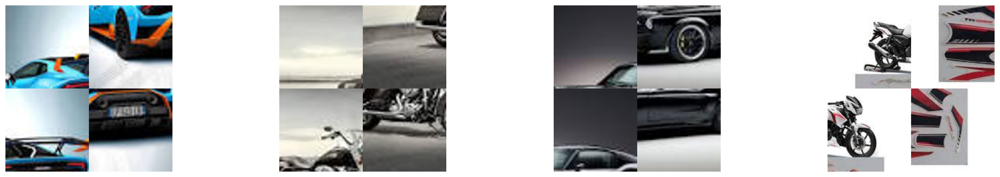

In [307]:

# Assuming images are in the range [0, 255]
def imshow(img):
    img = img.numpy().transpose((1, 2, 0))  # Convert from Tensor image to numpy array
    img = img / 255.0  # Scale pixel values to [0, 1]
    img = np.clip(img, 0, 1)  # Ensure values are within [0, 1] after any transformations
    plt.imshow(img)
    plt.axis('off')

# Display the first few images from the batch
fig = plt.figure(figsize=(25, 4))
# Show first 4 images
for idx in range(4):
    ax = fig.add_subplot(1, 4, idx + 1, xticks=[], yticks=[])
    imshow(images[idx])  # Assuming 'images' are tensors with pixel values in [0, 255]

plt.show()


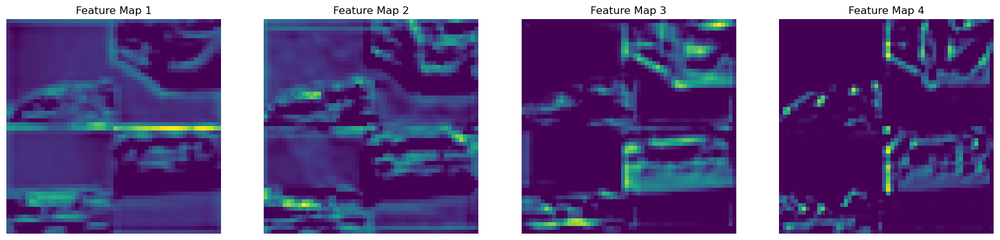

In [309]:
# Let's create a code snippet to visualize the first four feature maps of the ResNet model - of the first picture.

# Function to visualize a single feature map
def visualize_feature_map(feature_map, ax, idx):
    # Get the specific feature map
    fmap = feature_map[idx].cpu().numpy()
    # Display the feature map
    ax.imshow(fmap, cmap='viridis')
    ax.axis('off')
    ax.set_title(f'Feature Map {idx+1}')
 
    
# Plot the first four feature maps
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
for i in range(4):
    visualize_feature_map(feature_map, axes[i], i)

plt.show()


Third layer feature maps:

In [310]:

resnet_2x2.layer3.register_forward_hook(get_activation('layer3'))

# Set your model to evaluation mode
resnet_2x2.eval()

# Get a batch of images from your DataLoader
images, _ = next(iter(test_loader_2x2))  # Replace with your DataLoader

# Perform a forward pass to get the activations
with torch.no_grad():
    _ = resnet_2x2(images)

# Now, visualize the first feature map
feature_map = activation['layer3'][0]  # Get the first batch item's feature maps


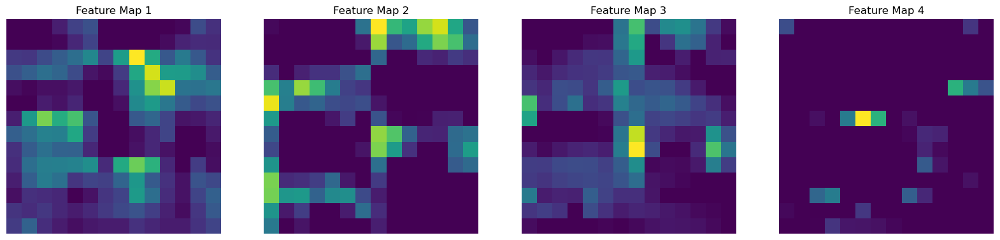

In [311]:

# Plot the first four feature maps
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
for i in range(4):
    visualize_feature_map(feature_map, axes[i], i)

plt.show()


We can see how the first layer recognizes patterns, lines and dots. The third layer captures something more abstract which is hard for us to recognize.

### Resnet 3x3

In [280]:

resnet_3x3.layer1.register_forward_hook(get_activation('layer1'))

# Set your model to evaluation mode
resnet_3x3.eval()

# Get a batch of images from your DataLoader
images, _ = next(iter(test_loader_3x3))  # Replace with your DataLoader

# Perform a forward pass to get the activations
with torch.no_grad():
    _ = resnet_3x3(images)

# Now, visualize the first feature map
feature_map = activation['layer1'][0]  # Get the first batch item's feature maps


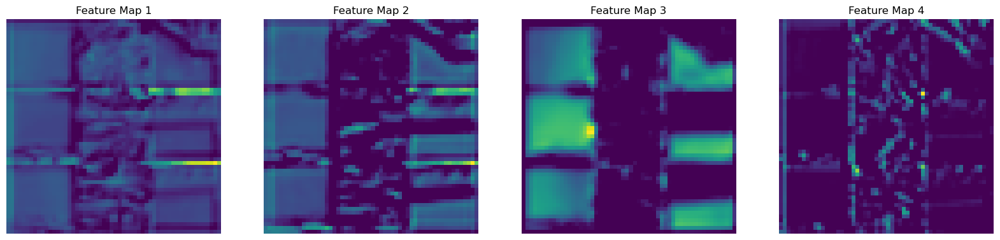

In [244]:

# Plot the first four feature maps
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
for i in range(4):
    visualize_feature_map(feature_map, axes[i], i)

plt.show()


In [245]:


resnet_3x3.layer3.register_forward_hook(get_activation('layer3'))

# Set your model to evaluation mode
resnet_3x3.eval()

# Get a batch of images from your DataLoader
images, _ = next(iter(test_loader_3x3))  # Replace with your DataLoader

# Perform a forward pass to get the activations
with torch.no_grad():
    _ = resnet_3x3(images)

# Now, visualize the first feature map
feature_map = activation['layer3'][0]  # Get the first batch item's feature maps


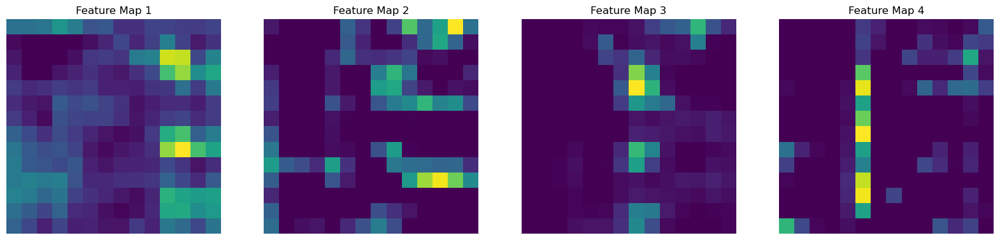

In [246]:

# Plot the first four feature maps
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
for i in range(4):
    visualize_feature_map(feature_map, axes[i], i)

plt.show()


We can see that the first layer recognizes patterns but it looks like it divides the image to tiles and learns in each on its own (same in 2x2), in addition, it looks like each tile in the same column is similar. The third layer is more abstract and it is harder to recognise that it is a 3x3 permuted image.

### Resnet 4x4

In [247]:

resnet_4x4.layer1.register_forward_hook(get_activation('layer1'))

# Set your model to evaluation mode
resnet_4x4.eval()

# Get a batch of images from your DataLoader
images, _ = next(iter(test_loader_4x4))  # Replace with your DataLoader

# Perform a forward pass to get the activations
with torch.no_grad():
    _ = resnet_4x4(images)

# Now, visualize the first feature map
feature_map = activation['layer1'][0]  # Get the first batch item's feature maps


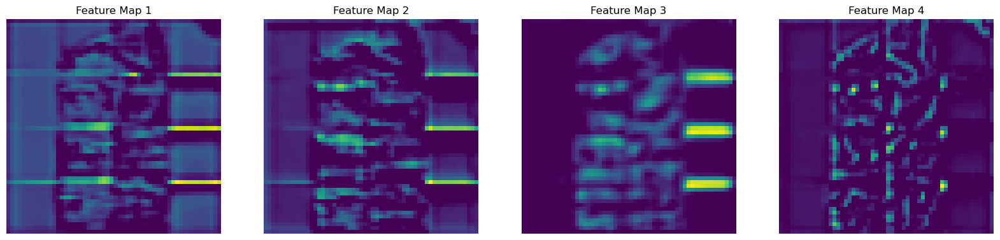

In [248]:

# Plot the first four feature maps
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
for i in range(4):
    visualize_feature_map(feature_map, axes[i], i)

plt.show()


In [249]:

resnet_4x4.layer3.register_forward_hook(get_activation('layer3'))

# Set your model to evaluation mode
resnet_4x4.eval()

# Get a batch of images from your DataLoader
images, _ = next(iter(test_loader_4x4))  # Replace with your DataLoader

# Perform a forward pass to get the activations
with torch.no_grad():
    _ = resnet_4x4(images)

# Now, visualize the first feature map
feature_map = activation['layer3'][0]  # Get the first batch item's feature maps


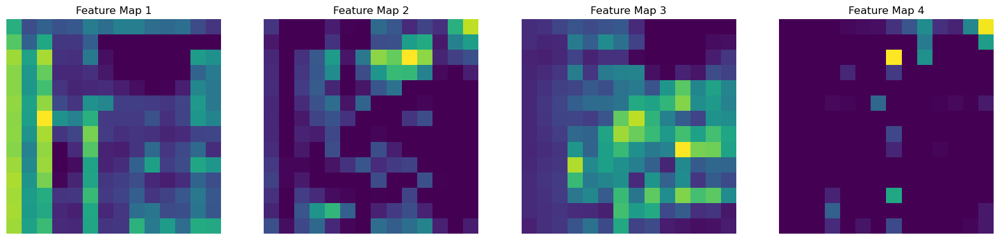

In [250]:

# Plot the first four feature maps
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
for i in range(4):
    visualize_feature_map(feature_map, axes[i], i)

plt.show()


We can see that the first layer recognizes patterns but it looks like it divides the image to tiles and learns in each on its ownm in addition, it looks like each tile in the same column is similar. The third layer is more abstract and it is even harder to recognise that it is a 4x4 permuted image.

### Resnet 5x5

In [251]:

resnet_5x5.layer1.register_forward_hook(get_activation('layer1'))

# Set your model to evaluation mode
resnet_5x5.eval()

# Get a batch of images from your DataLoader
images, _ = next(iter(test_loader_5x5))  # Replace with your DataLoader

# Perform a forward pass to get the activations
with torch.no_grad():
    _ = resnet_5x5(images)

# Now, visualize the first feature map
feature_map = activation['layer1'][0]  # Get the first batch item's feature maps


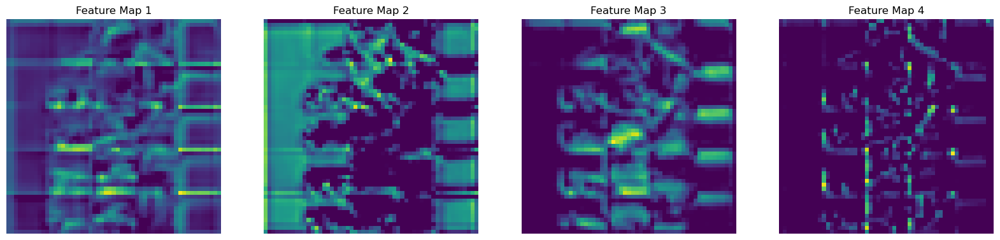

In [252]:

# Plot the first four feature maps
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
for i in range(4):
    visualize_feature_map(feature_map, axes[i], i)

plt.show()


In [253]:

resnet_5x5.layer3.register_forward_hook(get_activation('layer3'))

# Set your model to evaluation mode
resnet_5x5.eval()

# Get a batch of images from your DataLoader
images, _ = next(iter(test_loader_5x5))  # Replace with your DataLoader

# Perform a forward pass to get the activations
with torch.no_grad():
    _ = resnet_5x5(images)

# Now, visualize the first feature map
feature_map = activation['layer3'][0]  # Get the first batch item's feature maps


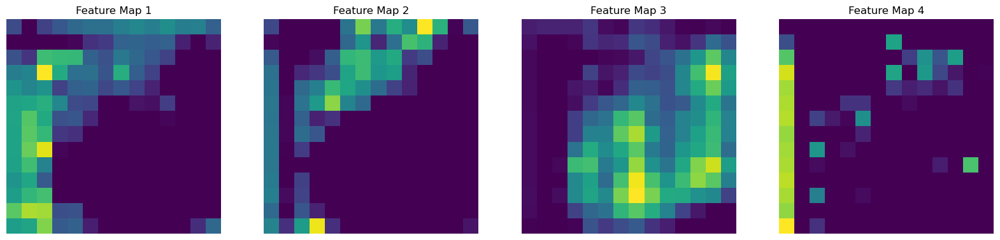

In [254]:

# Plot the first four feature maps
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
for i in range(4):
    visualize_feature_map(feature_map, axes[i], i)

plt.show()


We can see that the first layer recognizes patterns but it looks like it divides the image to tiles and learns in each on its own,  in addition, it looks like each tile in the same column is similar. The third layer is more abstract and it almost imposibole to recognise that it is a 5x5 permuted image.

Let's see if it is similar at googlenet, where we look at inception layers:

### Googlenet 2x2

In [312]:

# Register the hook to the first inception layer
googlenet_2x2.inception3a.register_forward_hook(get_activation('inception3a'))

images, _ = next(iter(test_loader_2x2))

# Perform forward pass with the first batch of images to capture feature maps
googlenet_2x2.eval()
with torch.no_grad():
    output = googlenet_2x2(images)

# The feature maps are now stored in the 'activation' dictionary
feature_maps = activation['inception3a']



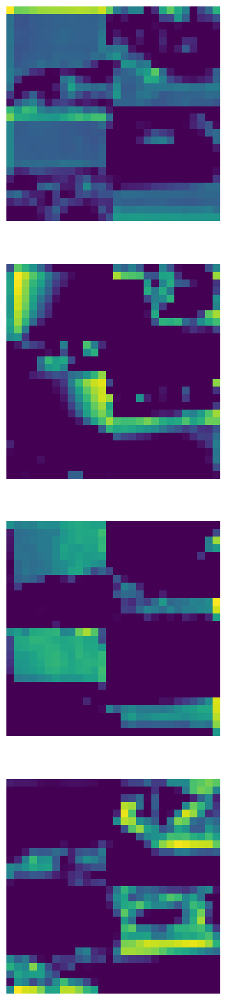

In [313]:
# Visualize the feature maps for the first image in the batch
# Selecting a single image (index 0), and accessing all feature maps
first_image_feature_maps = feature_maps[0]

# Determine the number of feature maps (i.e., number of output channels from the inception layer)
num_feature_maps = first_image_feature_maps.size(0)

# Plot the feature maps
fig, axarr = plt.subplots(min(num_feature_maps, 4), figsize=(20, 20))  
for idx in range(min(num_feature_maps, 4)):
    axarr[idx].imshow(first_image_feature_maps[idx].cpu().numpy(), cmap='viridis')
    axarr[idx].axis('off')
plt.show()


The third inception layer

In [314]:

# Register the hook to the first inception layer
googlenet_2x2.inception3b.register_forward_hook(get_activation('inception3b'))

images, _ = next(iter(test_loader_2x2))

# Perform forward pass with the first batch of images to capture feature maps
googlenet_2x2.eval()
with torch.no_grad():
    output = googlenet_2x2(images)

# The feature maps are now stored in the 'activation' dictionary
feature_maps = activation['inception3b']



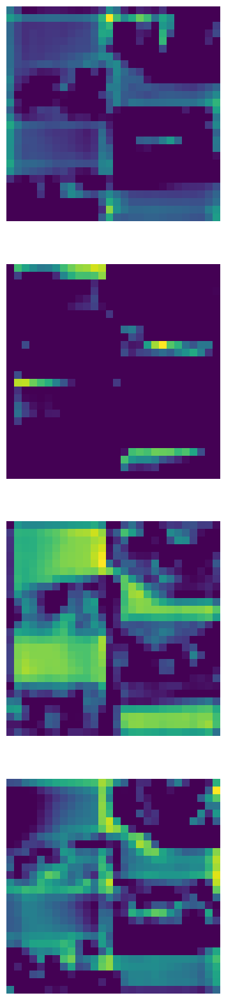

In [315]:
# Visualize the feature maps for the first image in the batch
# Selecting a single image (index 0), and accessing all feature maps
first_image_feature_maps = feature_maps[0]

# Determine the number of feature maps (i.e., number of output channels from the inception layer)
num_feature_maps = first_image_feature_maps.size(0)

# Plot the feature maps
fig, axarr = plt.subplots(min(num_feature_maps, 4), figsize=(20, 20))  # Adjust the number to visualize as needed
for idx in range(min(num_feature_maps, 4)):
    axarr[idx].imshow(first_image_feature_maps[idx].cpu().numpy(), cmap='viridis')
    axarr[idx].axis('off')
plt.show()


### Googlenet 3x3

In [269]:

# Register the hook to the first inception layer
googlenet_3x3.inception3a.register_forward_hook(get_activation('inception3a'))

images, _ = next(iter(test_loader_3x3))

# Perform forward pass with the first batch of images to capture feature maps
googlenet_3x3.eval()
with torch.no_grad():
    output = googlenet_3x3(images)

# The feature maps are now stored in the 'activation' dictionary
feature_maps = activation['inception3a']



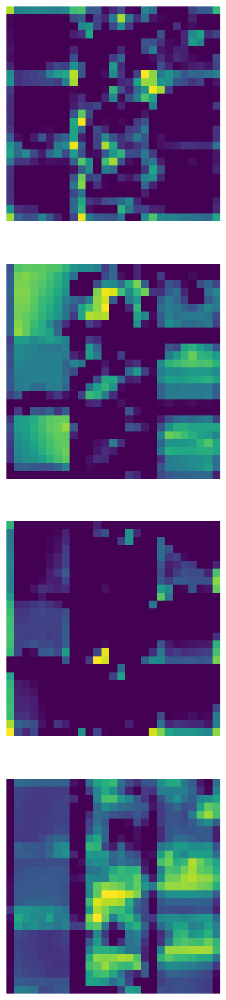

In [270]:
# Visualize the feature maps for the first image in the batch
# Selecting a single image (index 0), and accessing all feature maps
first_image_feature_maps = feature_maps[0]

# Determine the number of feature maps (i.e., number of output channels from the inception layer)
num_feature_maps = first_image_feature_maps.size(0)

# Plot the feature maps
fig, axarr = plt.subplots(min(num_feature_maps, 4), figsize=(20, 20)) 
for idx in range(min(num_feature_maps, 4)):
    axarr[idx].imshow(first_image_feature_maps[idx].cpu().numpy(), cmap='viridis')
    axarr[idx].axis('off')
plt.show()


The third inception layer

In [271]:

# Register the hook to the first inception layer
googlenet_3x3.inception3b.register_forward_hook(get_activation('inception3b'))

images, _ = next(iter(test_loader_3x3))

# Perform forward pass with the first batch of images to capture feature maps
googlenet_3x3.eval()
with torch.no_grad():
    output = googlenet_3x3(images)

# The feature maps are now stored in the 'activation' dictionary
feature_maps = activation['inception3b']



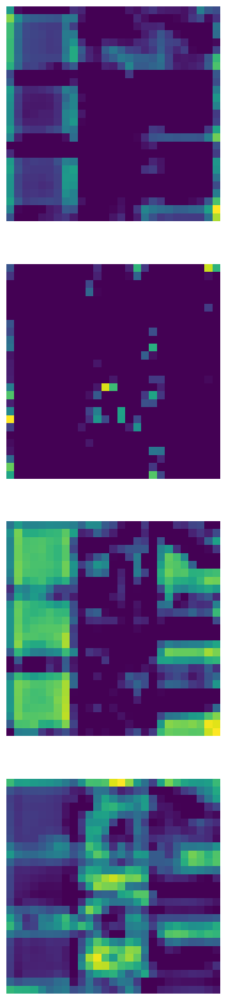

In [272]:
# Visualize the feature maps for the first image in the batch
# Selecting a single image (index 0), and accessing all feature maps
first_image_feature_maps = feature_maps[0]

# Determine the number of feature maps (i.e., number of output channels from the inception layer)
num_feature_maps = first_image_feature_maps.size(0)

# Plot the feature maps
fig, axarr = plt.subplots(min(num_feature_maps, 4), figsize=(20, 20)) 
for idx in range(min(num_feature_maps, 4)):
    axarr[idx].imshow(first_image_feature_maps[idx].cpu().numpy(), cmap='viridis')
    axarr[idx].axis('off')
plt.show()


### Googlenet 4x4

In [231]:

# Register the hook to the first inception layer
googlenet_4x4.inception3a.register_forward_hook(get_activation('inception3a'))

images, _ = next(iter(test_loader_4x4))

# Perform forward pass with the first batch of images to capture feature maps
googlenet_4x4.eval()
with torch.no_grad():
    output = googlenet_4x4(images)

# The feature maps are now stored in the 'activation' dictionary
feature_maps = activation['inception3a']



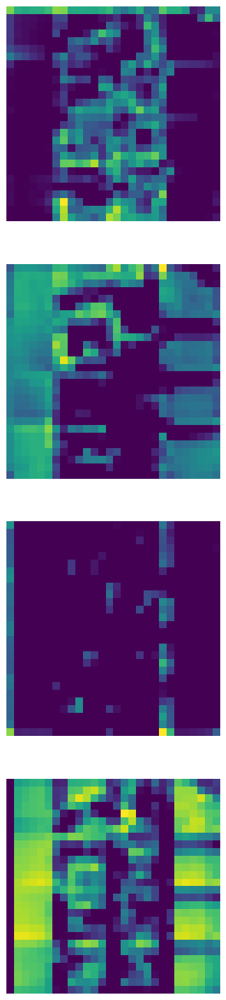

In [232]:
# Visualize the feature maps for the first image in the batch
# Selecting a single image (index 0), and accessing all feature maps
first_image_feature_maps = feature_maps[0]

# Determine the number of feature maps (i.e., number of output channels from the inception layer)
num_feature_maps = first_image_feature_maps.size(0)

# Plot the feature maps
fig, axarr = plt.subplots(min(num_feature_maps, 4), figsize=(20, 20)) 
for idx in range(min(num_feature_maps, 4)):
    axarr[idx].imshow(first_image_feature_maps[idx].cpu().numpy(), cmap='viridis')
    axarr[idx].axis('off')
plt.show()


The third inception layer

In [229]:

# Register the hook to the first inception layer
googlenet_4x4.inception3b.register_forward_hook(get_activation('inception3b'))

images, _ = next(iter(test_loader_4x4))

# Perform forward pass with the first batch of images to capture feature maps
googlenet_4x4.eval()
with torch.no_grad():
    output = googlenet_4x4(images)

# The feature maps are now stored in the 'activation' dictionary
feature_maps = activation['inception3b']



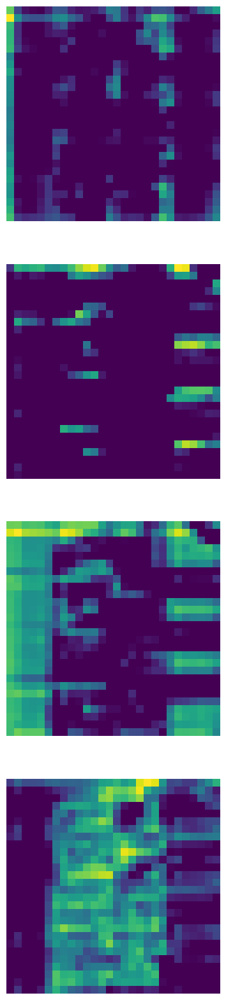

In [230]:
# Visualize the feature maps for the first image in the batch
# Selecting a single image (index 0), and accessing all feature maps
first_image_feature_maps = feature_maps[0]

# Determine the number of feature maps (i.e., number of output channels from the inception layer)
num_feature_maps = first_image_feature_maps.size(0)

# Plot the feature maps
fig, axarr = plt.subplots(min(num_feature_maps, 4), figsize=(20, 20)) 
for idx in range(min(num_feature_maps, 4)):
    axarr[idx].imshow(first_image_feature_maps[idx].cpu().numpy(), cmap='viridis')
    axarr[idx].axis('off')
plt.show()


### Googlenet 5x5

In [189]:

# Register the hook to the first inception layer
googlenet_5x5.inception3a.register_forward_hook(get_activation('inception3a'))

images, _ = next(iter(test_loader_5x5))

# Perform forward pass with the first batch of images to capture feature maps
googlenet_5x5.eval()
with torch.no_grad():
    output = googlenet_5x5(images)

# The feature maps are now stored in the 'activation' dictionary
feature_maps = activation['inception3a']



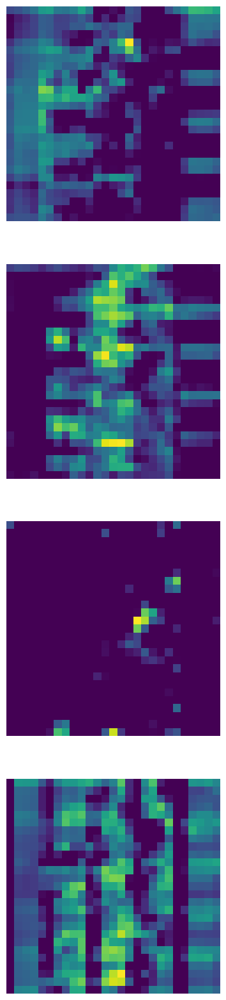

In [190]:
# Visualize the feature maps for the first image in the batch
# Selecting a single image (index 0), and accessing all feature maps
first_image_feature_maps = feature_maps[0]

# Determine the number of feature maps (i.e., number of output channels from the inception layer)
num_feature_maps = first_image_feature_maps.size(0)

# Plot the feature maps
fig, axarr = plt.subplots(min(num_feature_maps, 4), figsize=(20, 20))  
for idx in range(min(num_feature_maps, 4)):
    axarr[idx].imshow(first_image_feature_maps[idx].cpu().numpy(), cmap='viridis')
    axarr[idx].axis('off')
plt.show()


In [233]:

# Register the hook to the first inception layer
googlenet_5x5.inception3b.register_forward_hook(get_activation('inception3b'))

images, _ = next(iter(test_loader_5x5))

# Perform forward pass with the first batch of images to capture feature maps
googlenet_5x5.eval()
with torch.no_grad():
    output = googlenet_5x5(images)

# The feature maps are now stored in the 'activation' dictionary
feature_maps = activation['inception3b']



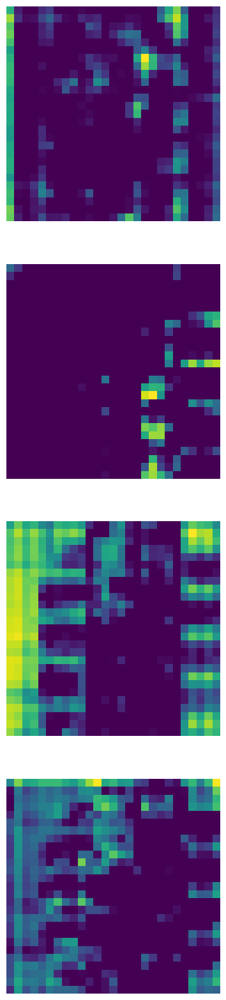

In [234]:
# Visualize the feature maps for the first image in the batch
# Selecting a single image (index 0), and accessing all feature maps
first_image_feature_maps = feature_maps[0]

# Determine the number of feature maps (i.e., number of output channels from the inception layer)
num_feature_maps = first_image_feature_maps.size(0)

# Plot the feature maps
fig, axarr = plt.subplots(min(num_feature_maps, 4), figsize=(20, 20))  
for idx in range(min(num_feature_maps, 4)):
    axarr[idx].imshow(first_image_feature_maps[idx].cpu().numpy(), cmap='viridis')
    axarr[idx].axis('off')
plt.show()


The higher resolutions look similar to in resnet, the feature maps describe each tile on its own and each tyle in the same column is similar. In the third layer it is a bit harder to see the tiles but we can still see it.

#### Summary

To sum up, the activation maps show us that the model learns each tile almost as it own, it "knows" that it is a permutated image. In later layers where it is more abstract it is harder to notice that. The fact that the activation map of each tile at the same column (in 1 image) is similar, can be explained by our permutation technique- It switches the tiles such that each row in the original image is represented as a column in the permutated image (only the high left to bottom right diagonal stays put). For example, that is why all the tiles in the right column looks similar, they all represent the bottom of the original picture (which can be floor which looks more or like the same).

## Improving Performance


Based on the runtime constraints, we will adopt the following approach:

**Using 3 Kfold cross valdation** with 1 epoch each (leaving final test dataset) we will experiment with modifications on:

1. Increasing Fully Connected Layer Complexity: Adding layers, activations, increasing dimensions and adding dropouts.
2. Changing Learning Rate.
3. Using differant loss function- Binary Cross Entropy.
4. Regulation and Normalization- data standart normaliztion + Channel normlaztion
5. Model Parametrs: Using untrained / trained & freezeing paramenters / trained and retrained 

We will improve the GoogLenet model as it has the best performance.

First testing performance after modification **only on the 3x3 premutation** as an indication for modification "goodnes".

Finally, we will combine these modifications to maximize the performance of our model where we will train it one last time with increased batch size and test it on different permutations to further evaluate its effectiveness..

**Making Sure Our Traning Is sufficiant:**

total data ~ 4000 images (2000 per class)

Final test ~ 800 (20% of 4000)

validation ~ 1066 (33% of 3200)

training ~ 2144 (1070 per class)

validation and training sets are different (with the same size) at each fold

### Side Note

We did more printing (every 20 iterations) because of problems in the cross validation and need to insure the model resets after each train & validiation "iteration". 
Stil we decided to keep this outputs because of runtime we are sorry in advanced for not shotring our printings.

In [24]:
def train(model, optimizer, criterion, train_loader, num_epochs=2, print_every=100):
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        
        for i, (images, labels) in enumerate(train_loader, 1):
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

            if i % print_every == 0:
                print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader)}], Loss: {running_loss / print_every:.4f}')
                running_loss = 0.0



In [25]:
def evaluate(model, val_loader):
    model.eval()
    val_labels = []
    val_predictions = []
    with torch.no_grad():
        for images, labels in val_loader:
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            val_labels.extend(labels.cpu().numpy())
            val_predictions.extend(predicted.cpu().numpy())

    # Calculate validation metrics
    val_accuracy = accuracy_score(val_labels, val_predictions)
    precision, recall, f1, _ = precision_recall_fscore_support(val_labels, val_predictions, average='binary')

    print(f'Validation Accuracy: {val_accuracy:.2f}%')
    print(f'Validation Precision: {precision:.2f}')
    print(f'Validation Recall: {recall:.2f}')
    print(f'Validation F1 Score: {f1:.2f}')



In [26]:
def cross_validate(model_class, optimizer, criterion, train_dataset, batch_size=4, num_epochs=2, print_every=100):
    kf = KFold(n_splits=3, shuffle=True)
    fold = 0
    for train_index, val_index in kf.split(train_dataset):
        fold += 1
        print(f'Fold {fold}/3')

        train_dataset_fold = Subset(train_dataset, train_index)
        val_dataset_fold = Subset(train_dataset, val_index)

        train_loader_fold = DataLoader(train_dataset_fold, batch_size=batch_size, shuffle=True)
        val_loader_fold = DataLoader(val_dataset_fold, batch_size=batch_size, shuffle=False)

        # Create a new instance of the model
        model = model_class
        for layer in model.children():
            if hasattr(layer, 'reset_parameters'):
                layer.reset_parameters()

        # Train the model
        train(model, optimizer, criterion, train_loader_fold, num_epochs=num_epochs, print_every=print_every)

        # Evaluate the model
        print("Validation metrics:")
        evaluate(model, val_loader_fold)

In [27]:
def test_model(model , test_loader) :
    # Set the model to evaluation mode
    model.eval()

    # Initialize variables to track the number of correct predictions and total predictions
    correct_test = 0
    total_test = 0

    # Initialize a list to store predictions for GoogLeNet
    predicted_model = []

    # Disable gradient computation for inference
    with torch.no_grad():
        for images, labels in test_loader:
            # Forward pass to get the model's predictions
            outputs = model(images)

            # Get the predictions
            _, predicted = torch.max(outputs.data, 1)

            # Append the predictions to the list
            predicted_model.extend(predicted.cpu().tolist())

            # Update total and correct predictions
            total_test += labels.size(0)
            correct_test += (predicted == labels).sum().item()

    # Calculate accuracy, precision, recall, and F1 score
    accuracy = accuracy_score(true_labels, predicted_model)
    precision, recall, f1, _ = precision_recall_fscore_support(predicted_model, true_labels, average='binary')

    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")

    # Generate and analyze the confusion matrix
    conf_matrix = confusion_matrix(predicted_model, true_labels)
    print("Confusion Matrix:")
    print(conf_matrix)

* **Original Model**

In [53]:
googlenet_original = models.googlenet(pretrained=True)
num_ftrs = googlenet_original.fc.in_features
googlenet_original.fc = nn.Linear(num_ftrs, 2) 

optimizer = optim.Adam(googlenet_original.parameters(), lr=0.001)

criterion = nn.CrossEntropyLoss()

cross_validate(googlenet_original,optimizer,criterion,train_dataset_3x3,batch_size=4,num_epochs=1,print_every=20)

Fold 1/3
Epoch [1/1], Iteration [20/534], Loss: 0.3990
Epoch [1/1], Iteration [40/534], Loss: 0.1743
Epoch [1/1], Iteration [60/534], Loss: 0.0624
Epoch [1/1], Iteration [80/534], Loss: 0.1818
Epoch [1/1], Iteration [100/534], Loss: 0.1754
Epoch [1/1], Iteration [120/534], Loss: 0.2108
Epoch [1/1], Iteration [140/534], Loss: 0.1033
Epoch [1/1], Iteration [160/534], Loss: 0.1889
Epoch [1/1], Iteration [180/534], Loss: 0.1806
Epoch [1/1], Iteration [200/534], Loss: 0.2449
Epoch [1/1], Iteration [220/534], Loss: 0.1158
Epoch [1/1], Iteration [240/534], Loss: 0.1513
Epoch [1/1], Iteration [260/534], Loss: 0.2390
Epoch [1/1], Iteration [280/534], Loss: 0.1625
Epoch [1/1], Iteration [300/534], Loss: 0.2285
Epoch [1/1], Iteration [320/534], Loss: 0.2258
Epoch [1/1], Iteration [340/534], Loss: 0.2287
Epoch [1/1], Iteration [360/534], Loss: 0.1674
Epoch [1/1], Iteration [380/534], Loss: 0.1408
Epoch [1/1], Iteration [400/534], Loss: 0.1648
Epoch [1/1], Iteration [420/534], Loss: 0.1745
Epoch [1

* **Increase fully connected complexity** (עוד שכבות עוד שמחה)

In [60]:
googlenet_I = models.googlenet(pretrained=True)
num_ftrs = googlenet_I.fc.in_features
googlenet_I.fc = nn.Sequential(
    nn.Linear(num_ftrs, 512),  # Increase fully connected complexity
    nn.ReLU(),
    nn.Linear(512, 256),  # Additional fully connected layer
    nn.ReLU(),
    nn.Linear(256, 128),  # Additional fully connected layer
    nn.ReLU(),
    nn.Linear(128, 2)  # Adjust output size for binary classification
)  

optimizer = optim.Adam(googlenet_I.parameters(), lr=0.001)

criterion = nn.CrossEntropyLoss()

cross_validate(googlenet_I,optimizer,criterion,train_dataset_3x3,batch_size=4,num_epochs=1,print_every=20)

C:\Users\GiladTK\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\GiladTK\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Fold 1/3
Epoch [1/1], Iteration [20/534], Loss: 0.5447
Epoch [1/1], Iteration [40/534], Loss: 0.4848
Epoch [1/1], Iteration [60/534], Loss: 0.4898
Epoch [1/1], Iteration [80/534], Loss: 0.7250
Epoch [1/1], Iteration [100/534], Loss: 0.6276
Epoch [1/1], Iteration [120/534], Loss: 0.6081
Epoch [1/1], Iteration [140/534], Loss: 0.6482
Epoch [1/1], Iteration [160/534], Loss: 0.5405
Epoch [1/1], Iteration [180/534], Loss: 0.4365
Epoch [1/1], Iteration [200/534], Loss: 0.5565
Epoch [1/1], Iteration [220/534], Loss: 0.5826
Epoch [1/1], Iteration [240/534], Loss: 0.5092
Epoch [1/1], Iteration [260/534], Loss: 0.6073
Epoch [1/1], Iteration [280/534], Loss: 0.5818
Epoch [1/1], Iteration [300/534], Loss: 0.4818
Epoch [1/1], Iteration [320/534], Loss: 0.6512
Epoch [1/1], Iteration [340/534], Loss: 0.5898
Epoch [1/1], Iteration [360/534], Loss: 0.5496
Epoch [1/1], Iteration [380/534], Loss: 0.4768
Epoch [1/1], Iteration [400/534], Loss: 0.3524
Epoch [1/1], Iteration [420/534], Loss: 0.5807
Epoch [1

* **Insert drouput in more complex Fully Connected** 

In [91]:
dropout_rate = 0.5  

googlenet_II = models.googlenet(pretrained=True)
num_ftrs = googlenet_II.fc.in_features

googlenet_II.fc = nn.Sequential(
    nn.Linear(num_ftrs, 512),
    nn.ReLU(),
    nn.Dropout(dropout_rate), 
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Dropout(dropout_rate), 
    nn.Linear(256, 128),
    nn.ReLU(),
    nn.Dropout(dropout_rate), 
    nn.Linear(128, 2)
)
optimizer = optim.Adam(googlenet_II.parameters(), lr=0.001)

criterion = nn.CrossEntropyLoss()

cross_validate(googlenet_II,optimizer,criterion,train_dataset_3x3,batch_size=4,num_epochs=1,print_every=20)

C:\Users\GiladTK\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\GiladTK\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Fold 1/3
Epoch [1/1], Iteration [20/534], Loss: 0.6957
Epoch [1/1], Iteration [40/534], Loss: 0.7591
Epoch [1/1], Iteration [60/534], Loss: 0.5472
Epoch [1/1], Iteration [80/534], Loss: 0.5155
Epoch [1/1], Iteration [100/534], Loss: 0.6708
Epoch [1/1], Iteration [120/534], Loss: 0.6612
Epoch [1/1], Iteration [140/534], Loss: 0.5484
Epoch [1/1], Iteration [160/534], Loss: 0.4960
Epoch [1/1], Iteration [180/534], Loss: 0.5094
Epoch [1/1], Iteration [200/534], Loss: 0.3784
Epoch [1/1], Iteration [220/534], Loss: 0.6717
Epoch [1/1], Iteration [240/534], Loss: 0.5704
Epoch [1/1], Iteration [260/534], Loss: 0.4516
Epoch [1/1], Iteration [280/534], Loss: 0.5060
Epoch [1/1], Iteration [300/534], Loss: 0.5448
Epoch [1/1], Iteration [320/534], Loss: 0.5871
Epoch [1/1], Iteration [340/534], Loss: 0.5779
Epoch [1/1], Iteration [360/534], Loss: 0.3875
Epoch [1/1], Iteration [380/534], Loss: 0.3899
Epoch [1/1], Iteration [400/534], Loss: 0.4093
Epoch [1/1], Iteration [420/534], Loss: 0.7189
Epoch [1

* **Increase Lr** 

In [61]:

googlenet_III = models.googlenet(pretrained=True)
num_ftrs = googlenet_III.fc.in_features
googlenet_III.fc = nn.Linear(num_ftrs, 2) 


optimizer = optim.Adam(googlenet_III.parameters(), lr=0.01)

criterion = nn.CrossEntropyLoss()

cross_validate(googlenet_III,optimizer,criterion,train_dataset_3x3,batch_size=4,num_epochs=1,print_every=20)

C:\Users\GiladTK\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\GiladTK\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Fold 1/3
Epoch [1/1], Iteration [20/534], Loss: 1.2184
Epoch [1/1], Iteration [40/534], Loss: 0.8473
Epoch [1/1], Iteration [60/534], Loss: 1.0124
Epoch [1/1], Iteration [80/534], Loss: 0.8409
Epoch [1/1], Iteration [100/534], Loss: 1.1166
Epoch [1/1], Iteration [120/534], Loss: 0.9767
Epoch [1/1], Iteration [140/534], Loss: 0.9020
Epoch [1/1], Iteration [160/534], Loss: 0.7332
Epoch [1/1], Iteration [180/534], Loss: 0.8695
Epoch [1/1], Iteration [200/534], Loss: 0.7908
Epoch [1/1], Iteration [220/534], Loss: 0.8044
Epoch [1/1], Iteration [240/534], Loss: 0.7731
Epoch [1/1], Iteration [260/534], Loss: 0.7270
Epoch [1/1], Iteration [280/534], Loss: 0.9899
Epoch [1/1], Iteration [300/534], Loss: 1.0689
Epoch [1/1], Iteration [320/534], Loss: 0.7446
Epoch [1/1], Iteration [340/534], Loss: 0.7880
Epoch [1/1], Iteration [360/534], Loss: 0.7482
Epoch [1/1], Iteration [380/534], Loss: 0.8294
Epoch [1/1], Iteration [400/534], Loss: 0.7616
Epoch [1/1], Iteration [420/534], Loss: 0.7109
Epoch [1

* **Decrease Lr** 

In [62]:

googlenet_IV = models.googlenet(pretrained=True)

num_ftrs = googlenet_III.fc.in_features

googlenet_IV.fc = nn.Linear(num_ftrs, 2) 

optimizer = optim.Adam(googlenet_IV.parameters(), lr=0.0001)

criterion = nn.CrossEntropyLoss()

cross_validate(googlenet_IV,optimizer,criterion,train_dataset_3x3,batch_size=4,num_epochs=1,print_every=20)


C:\Users\GiladTK\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\GiladTK\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Fold 1/3
Epoch [1/1], Iteration [20/534], Loss: 0.5569
Epoch [1/1], Iteration [40/534], Loss: 0.4682
Epoch [1/1], Iteration [60/534], Loss: 0.3076
Epoch [1/1], Iteration [80/534], Loss: 0.3451
Epoch [1/1], Iteration [100/534], Loss: 0.2546
Epoch [1/1], Iteration [120/534], Loss: 0.2977
Epoch [1/1], Iteration [140/534], Loss: 0.1749
Epoch [1/1], Iteration [160/534], Loss: 0.2349
Epoch [1/1], Iteration [180/534], Loss: 0.2167
Epoch [1/1], Iteration [200/534], Loss: 0.2185
Epoch [1/1], Iteration [220/534], Loss: 0.2293
Epoch [1/1], Iteration [240/534], Loss: 0.5335
Epoch [1/1], Iteration [260/534], Loss: 0.1452
Epoch [1/1], Iteration [280/534], Loss: 0.4729
Epoch [1/1], Iteration [300/534], Loss: 0.3219
Epoch [1/1], Iteration [320/534], Loss: 0.2682
Epoch [1/1], Iteration [340/534], Loss: 0.2283
Epoch [1/1], Iteration [360/534], Loss: 0.1996
Epoch [1/1], Iteration [380/534], Loss: 0.3238
Epoch [1/1], Iteration [400/534], Loss: 0.2770
Epoch [1/1], Iteration [420/534], Loss: 0.3155
Epoch [1

* **Use Binary Cross Entropy loss function**

In [63]:
import torch.nn.functional as F

googlenet_V = models.googlenet(pretrained=True)

num_ftrs = googlenet_V.fc.in_features

googlenet_V.fc = nn.Linear(num_ftrs, 2) 

optimizer = optim.Adam(googlenet_V.parameters(), lr=0.001)

# We had a problem with the lables and output when using Binary Cross Entropy "As Is" from nn.Module and
# prefered to make a custom BCELoss function rather then change the traninig and test code

class CustomBCELoss(nn.Module):
    def __init__(self):
        super(CustomBCELoss, self).__init__()

    def forward(self, input, target):
        target_one_hot = F.one_hot(target, num_classes=2).float()
        input_sigmoid = torch.sigmoid(input)  # Apply sigmoid activation
        loss = F.binary_cross_entropy(input_sigmoid, target_one_hot)
        return loss

criterion = CustomBCELoss()

cross_validate(googlenet_V,optimizer,criterion,train_dataset_3x3,batch_size=4,num_epochs=1,print_every=20)


C:\Users\GiladTK\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\GiladTK\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Fold 1/3
Epoch [1/1], Iteration [20/534], Loss: 0.4565
Epoch [1/1], Iteration [40/534], Loss: 0.4108
Epoch [1/1], Iteration [60/534], Loss: 0.5944
Epoch [1/1], Iteration [80/534], Loss: 0.3892
Epoch [1/1], Iteration [100/534], Loss: 0.4350
Epoch [1/1], Iteration [120/534], Loss: 0.5772
Epoch [1/1], Iteration [140/534], Loss: 0.3826
Epoch [1/1], Iteration [160/534], Loss: 0.5084
Epoch [1/1], Iteration [180/534], Loss: 0.3389
Epoch [1/1], Iteration [200/534], Loss: 0.4330
Epoch [1/1], Iteration [220/534], Loss: 0.4524
Epoch [1/1], Iteration [240/534], Loss: 0.4479
Epoch [1/1], Iteration [260/534], Loss: 0.5251
Epoch [1/1], Iteration [280/534], Loss: 0.3964
Epoch [1/1], Iteration [300/534], Loss: 0.3366
Epoch [1/1], Iteration [320/534], Loss: 0.4773
Epoch [1/1], Iteration [340/534], Loss: 0.4468
Epoch [1/1], Iteration [360/534], Loss: 0.3728
Epoch [1/1], Iteration [380/534], Loss: 0.3842
Epoch [1/1], Iteration [400/534], Loss: 0.3421
Epoch [1/1], Iteration [420/534], Loss: 0.3532
Epoch [1

* **Regularization & Normalzation**

In [86]:
images_tensor_3x3.shape ,train_labels.shape

(torch.Size([4000, 3, 222, 222]), torch.Size([3200]))

In [87]:

# Normalize the images tensor
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
images_tensor_3x3_normalized = normalize(images_tensor_3x3)

# Create a TensorDataset
dataset = TensorDataset(images_tensor_3x3_normalized, labels_tensor)

# Split data into training and testing sets
train_images_3x3_norm, test_images_3x3_norm, train_labels_3x3, test_labels_3x3 = train_test_split(images_tensor_3x3_normalized , labels_tensor, test_size=0.2, random_state=42)    
    
train_dataset_3x3_norm = CustomDataset(images=train_images_3x3_norm, labels=train_labels_3x3)
test_dataset_3x3_norm = CustomDataset(images=test_images_3x3_norm, labels=test_labels_3x3)

# Define DataLoader
train_loader_3x3_norm = DataLoader(train_dataset_3x3_norm , batch_size=4, shuffle=True)
test_loader_3x3_norm = DataLoader(test_dataset_3x3_norm , batch_size=4, shuffle=False)

In [90]:
googlenet_norm = models.googlenet(pretrained=True)
num_ftrs = googlenet_norm.fc.in_features
googlenet_norm.fc = nn.Linear(num_ftrs, 2) 


optimizer = optim.Adam(googlenet_norm.parameters(), lr=0.001)

criterion = nn.CrossEntropyLoss()

cross_validate(googlenet_norm,optimizer,criterion,train_dataset_3x3_norm,batch_size=4,num_epochs=1,print_every=20)

Fold 1/3
Epoch [1/1], Iteration [20/534], Loss: 0.6054
Epoch [1/1], Iteration [40/534], Loss: 0.6922
Epoch [1/1], Iteration [60/534], Loss: 0.5336
Epoch [1/1], Iteration [80/534], Loss: 0.3918
Epoch [1/1], Iteration [100/534], Loss: 0.4602
Epoch [1/1], Iteration [120/534], Loss: 0.5869
Epoch [1/1], Iteration [140/534], Loss: 0.3365
Epoch [1/1], Iteration [160/534], Loss: 0.3425
Epoch [1/1], Iteration [180/534], Loss: 0.4134
Epoch [1/1], Iteration [200/534], Loss: 0.2803
Epoch [1/1], Iteration [220/534], Loss: 0.3543
Epoch [1/1], Iteration [240/534], Loss: 0.4622
Epoch [1/1], Iteration [260/534], Loss: 0.4255
Epoch [1/1], Iteration [280/534], Loss: 0.5220
Epoch [1/1], Iteration [300/534], Loss: 0.4633
Epoch [1/1], Iteration [320/534], Loss: 0.3257
Epoch [1/1], Iteration [340/534], Loss: 0.3584
Epoch [1/1], Iteration [360/534], Loss: 0.5110
Epoch [1/1], Iteration [380/534], Loss: 0.3194
Epoch [1/1], Iteration [400/534], Loss: 0.5395
Epoch [1/1], Iteration [420/534], Loss: 0.3806
Epoch [1

* **Deacrese Lr even more**

In [65]:

googlenet_VI = models.googlenet(pretrained=True)

num_ftrs = googlenet_VI.fc.in_features

googlenet_VI.fc = nn.Linear(num_ftrs, 2) 

optimizer = optim.Adam(googlenet_VI.parameters(), lr=0.00001)

criterion = nn.CrossEntropyLoss()

cross_validate(googlenet_VI,optimizer,criterion,train_dataset_3x3,batch_size=4,num_epochs=1,print_every=20)


C:\Users\GiladTK\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\GiladTK\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Fold 1/3
Epoch [1/1], Iteration [20/534], Loss: 0.6659
Epoch [1/1], Iteration [40/534], Loss: 0.6552
Epoch [1/1], Iteration [60/534], Loss: 0.6417
Epoch [1/1], Iteration [80/534], Loss: 0.6224
Epoch [1/1], Iteration [100/534], Loss: 0.6147
Epoch [1/1], Iteration [120/534], Loss: 0.5502
Epoch [1/1], Iteration [140/534], Loss: 0.5609
Epoch [1/1], Iteration [160/534], Loss: 0.5727
Epoch [1/1], Iteration [180/534], Loss: 0.5317
Epoch [1/1], Iteration [200/534], Loss: 0.5078
Epoch [1/1], Iteration [220/534], Loss: 0.4528
Epoch [1/1], Iteration [240/534], Loss: 0.4478
Epoch [1/1], Iteration [260/534], Loss: 0.3791
Epoch [1/1], Iteration [280/534], Loss: 0.4267
Epoch [1/1], Iteration [300/534], Loss: 0.3850
Epoch [1/1], Iteration [320/534], Loss: 0.4516
Epoch [1/1], Iteration [340/534], Loss: 0.3415
Epoch [1/1], Iteration [360/534], Loss: 0.3686
Epoch [1/1], Iteration [380/534], Loss: 0.3217
Epoch [1/1], Iteration [400/534], Loss: 0.3394
Epoch [1/1], Iteration [420/534], Loss: 0.3004
Epoch [1

* **Pretrained = True , Freeze All Parametrs Other Fully Connected**

In [66]:
googlenet_VII = models.googlenet(pretrained=True)
num_ftrs = googlenet_VII.fc.in_features
googlenet_VII.fc = nn.Linear(num_ftrs, 2) 

# Freeze all parameters except the fully connected layer
for name, param in googlenet_VII.named_parameters():
    if name.startswith('fc'):
        param.requires_grad = True
    else:
        param.requires_grad = False

num_ftrs = googlenet_VII.fc.in_features
googlenet_VII.fc = nn.Linear(num_ftrs, 2) 

optimizer = optim.Adam(googlenet_VII.fc.parameters(), lr=0.001) 
criterion = nn.CrossEntropyLoss()

cross_validate(googlenet_VII,optimizer,criterion,train_dataset_3x3,batch_size=4,num_epochs=1,print_every=20)


C:\Users\GiladTK\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\GiladTK\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Fold 1/3
Epoch [1/1], Iteration [20/534], Loss: 0.6798
Epoch [1/1], Iteration [40/534], Loss: 0.5950
Epoch [1/1], Iteration [60/534], Loss: 0.5985
Epoch [1/1], Iteration [80/534], Loss: 0.6045
Epoch [1/1], Iteration [100/534], Loss: 0.5785
Epoch [1/1], Iteration [120/534], Loss: 0.4794
Epoch [1/1], Iteration [140/534], Loss: 0.5461
Epoch [1/1], Iteration [160/534], Loss: 0.3916
Epoch [1/1], Iteration [180/534], Loss: 0.3752
Epoch [1/1], Iteration [200/534], Loss: 0.4034
Epoch [1/1], Iteration [220/534], Loss: 0.4724
Epoch [1/1], Iteration [240/534], Loss: 0.3650
Epoch [1/1], Iteration [260/534], Loss: 0.5408
Epoch [1/1], Iteration [280/534], Loss: 0.5746
Epoch [1/1], Iteration [300/534], Loss: 0.4526
Epoch [1/1], Iteration [320/534], Loss: 0.3717
Epoch [1/1], Iteration [340/534], Loss: 0.3868
Epoch [1/1], Iteration [360/534], Loss: 0.3266
Epoch [1/1], Iteration [380/534], Loss: 0.3864
Epoch [1/1], Iteration [400/534], Loss: 0.3100
Epoch [1/1], Iteration [420/534], Loss: 0.3907
Epoch [1

### **Combine Best Modifications and Evaluate**

Only **Deacrese Lr (0.0001)** improves performance up to average accuracy of ~99.

Now we will train and test on full datasets and on different permutation to  see if that is the case for the differant permutarions as well.

* **Regular Images**

In [110]:
googlenet_X = models.googlenet(pretrained=True)

num_ftrs = googlenet_X.fc.in_features

googlenet_X.fc = nn.Linear(num_ftrs, 2) 

optimizer = optim.Adam(googlenet_X.parameters(), lr=0.0001)

criterion = nn.CrossEntropyLoss()

train(googlenet_X,optimizer,criterion,train_loader,num_epochs=2,print_every=100)


C:\Users\GiladTK\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\GiladTK\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/2], Iteration [100/800], Loss: 0.3395
Epoch [1/2], Iteration [200/800], Loss: 0.2174
Epoch [1/2], Iteration [300/800], Loss: 0.1819
Epoch [1/2], Iteration [400/800], Loss: 0.1405
Epoch [1/2], Iteration [500/800], Loss: 0.1742
Epoch [1/2], Iteration [600/800], Loss: 0.1187
Epoch [1/2], Iteration [700/800], Loss: 0.1662
Epoch [1/2], Iteration [800/800], Loss: 0.1185
Epoch [2/2], Iteration [100/800], Loss: 0.0921
Epoch [2/2], Iteration [200/800], Loss: 0.0580
Epoch [2/2], Iteration [300/800], Loss: 0.0805
Epoch [2/2], Iteration [400/800], Loss: 0.0686
Epoch [2/2], Iteration [500/800], Loss: 0.0715
Epoch [2/2], Iteration [600/800], Loss: 0.0223
Epoch [2/2], Iteration [700/800], Loss: 0.0566
Epoch [2/2], Iteration [800/800], Loss: 0.0473


In [111]:
test_model(googlenet_X,test_loader)

Accuracy: 0.9925
Precision: 0.9947
Recall: 0.9895
F1 Score: 0.9921
Confusion Matrix:
[[418   2]
 [  4 376]]


* **2x2 permutation**

In [29]:

googlenet_X_2x2 = models.googlenet(pretrained=True)

num_ftrs = googlenet_X_2x2.fc.in_features

googlenet_X_2x2.fc = nn.Linear(num_ftrs, 2) 

optimizer = optim.Adam(googlenet_X_2x2.parameters(), lr=0.0001)

criterion = nn.CrossEntropyLoss()

train(googlenet_X_2x2,optimizer,criterion,train_loader_2x2,num_epochs=2,print_every=100)


C:\Users\GiladTK\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\GiladTK\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/2], Iteration [100/800], Loss: 0.3099
Epoch [1/2], Iteration [200/800], Loss: 0.2375
Epoch [1/2], Iteration [300/800], Loss: 0.2546
Epoch [1/2], Iteration [400/800], Loss: 0.1898
Epoch [1/2], Iteration [500/800], Loss: 0.1213
Epoch [1/2], Iteration [600/800], Loss: 0.1647
Epoch [1/2], Iteration [700/800], Loss: 0.1296
Epoch [1/2], Iteration [800/800], Loss: 0.1346
Epoch [2/2], Iteration [100/800], Loss: 0.1168
Epoch [2/2], Iteration [200/800], Loss: 0.0943
Epoch [2/2], Iteration [300/800], Loss: 0.1094
Epoch [2/2], Iteration [400/800], Loss: 0.0981
Epoch [2/2], Iteration [500/800], Loss: 0.0754
Epoch [2/2], Iteration [600/800], Loss: 0.1173
Epoch [2/2], Iteration [700/800], Loss: 0.0716
Epoch [2/2], Iteration [800/800], Loss: 0.0478


In [33]:
test_model(googlenet_X_2x2,test_loader_2x2)

Accuracy: 0.9962
Precision: 0.9974
Recall: 0.9947
F1 Score: 0.9960
Confusion Matrix:
[[420   1]
 [  2 377]]


* **3x3 permutation**

In [99]:

googlenet_X_3x3 = models.googlenet(pretrained=True)

num_ftrs = googlenet_X_3x3.fc.in_features

googlenet_X_3x3.fc = nn.Linear(num_ftrs, 2) 

optimizer = optim.Adam(googlenet_X_3x3.parameters(), lr=0.0001)

criterion = nn.CrossEntropyLoss()

train(googlenet_X_3x3,optimizer,criterion,train_loader_3x3,num_epochs=2,print_every=100)


C:\Users\GiladTK\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\GiladTK\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/2], Iteration [100/800], Loss: 0.3543
Epoch [1/2], Iteration [200/800], Loss: 0.3251
Epoch [1/2], Iteration [300/800], Loss: 0.2247
Epoch [1/2], Iteration [400/800], Loss: 0.3139
Epoch [1/2], Iteration [500/800], Loss: 0.2852
Epoch [1/2], Iteration [600/800], Loss: 0.2288
Epoch [1/2], Iteration [700/800], Loss: 0.1290
Epoch [1/2], Iteration [800/800], Loss: 0.2583
Epoch [2/2], Iteration [100/800], Loss: 0.1665
Epoch [2/2], Iteration [200/800], Loss: 0.1344
Epoch [2/2], Iteration [300/800], Loss: 0.1994
Epoch [2/2], Iteration [400/800], Loss: 0.1785
Epoch [2/2], Iteration [500/800], Loss: 0.1560
Epoch [2/2], Iteration [600/800], Loss: 0.1569
Epoch [2/2], Iteration [700/800], Loss: 0.1035
Epoch [2/2], Iteration [800/800], Loss: 0.1412


In [102]:
test_model(googlenet_X_3x3,test_loader_3x3)

Accuracy: 0.9900
Precision: 0.9894
Recall: 0.9894
F1 Score: 0.9894
Confusion Matrix:
[[418   4]
 [  4 374]]


* **4x4 permutation**

In [104]:
googlenet_X_4x4 = models.googlenet(pretrained=True)

num_ftrs = googlenet_X_4x4.fc.in_features

googlenet_X_3x3.fc = nn.Linear(num_ftrs, 2) 

optimizer = optim.Adam(googlenet_X_4x4.parameters(), lr=0.0001)

criterion = nn.CrossEntropyLoss()

train(googlenet_X_4x4,optimizer,criterion,train_loader_4x4,num_epochs=2,print_every=100)


Epoch [1/2], Iteration [100/800], Loss: 2.4842
Epoch [1/2], Iteration [200/800], Loss: 0.4828
Epoch [1/2], Iteration [300/800], Loss: 0.4146
Epoch [1/2], Iteration [400/800], Loss: 0.3496
Epoch [1/2], Iteration [500/800], Loss: 0.2302
Epoch [1/2], Iteration [600/800], Loss: 0.2406
Epoch [1/2], Iteration [700/800], Loss: 0.3022
Epoch [1/2], Iteration [800/800], Loss: 0.2594
Epoch [2/2], Iteration [100/800], Loss: 0.2462
Epoch [2/2], Iteration [200/800], Loss: 0.1766
Epoch [2/2], Iteration [300/800], Loss: 0.1804
Epoch [2/2], Iteration [400/800], Loss: 0.1898
Epoch [2/2], Iteration [500/800], Loss: 0.2108
Epoch [2/2], Iteration [600/800], Loss: 0.1467
Epoch [2/2], Iteration [700/800], Loss: 0.1665
Epoch [2/2], Iteration [800/800], Loss: 0.1863


In [112]:
test_model(googlenet_X_4x4,test_loader_4x4)

Accuracy: 0.9825
Precision: 1.0000
Recall: 0.9643
F1 Score: 0.9818
Confusion Matrix:
[[408   0]
 [ 14 378]]


* **5x5 permutation**

In [106]:
googlenet_X_5x5 = models.googlenet(pretrained=True)

num_ftrs = googlenet_X_5x5.fc.in_features

googlenet_X_5x5.fc = nn.Linear(num_ftrs, 2) 

optimizer = optim.Adam(googlenet_X_5x5.parameters(), lr=0.0001)

criterion = nn.CrossEntropyLoss()

train(googlenet_X_5x5,optimizer,criterion,train_loader_5x5,num_epochs=2,print_every=100)


C:\Users\GiladTK\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\GiladTK\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/2], Iteration [100/800], Loss: 0.3839
Epoch [1/2], Iteration [200/800], Loss: 0.3142
Epoch [1/2], Iteration [300/800], Loss: 0.2386
Epoch [1/2], Iteration [400/800], Loss: 0.3293
Epoch [1/2], Iteration [500/800], Loss: 0.2553
Epoch [1/2], Iteration [600/800], Loss: 0.2630
Epoch [1/2], Iteration [700/800], Loss: 0.2229
Epoch [1/2], Iteration [800/800], Loss: 0.2588
Epoch [2/2], Iteration [100/800], Loss: 0.2319
Epoch [2/2], Iteration [200/800], Loss: 0.1566
Epoch [2/2], Iteration [300/800], Loss: 0.1951
Epoch [2/2], Iteration [400/800], Loss: 0.1480
Epoch [2/2], Iteration [500/800], Loss: 0.1460
Epoch [2/2], Iteration [600/800], Loss: 0.1823
Epoch [2/2], Iteration [700/800], Loss: 0.1582
Epoch [2/2], Iteration [800/800], Loss: 0.1346


In [107]:
test_model(googlenet_X_5x5, test_loader_5x5)

Accuracy: 0.9850
Precision: 0.9788
Recall: 0.9893
F1 Score: 0.9840
Confusion Matrix:
[[418   8]
 [  4 370]]


* **Improved Performance Visualization**

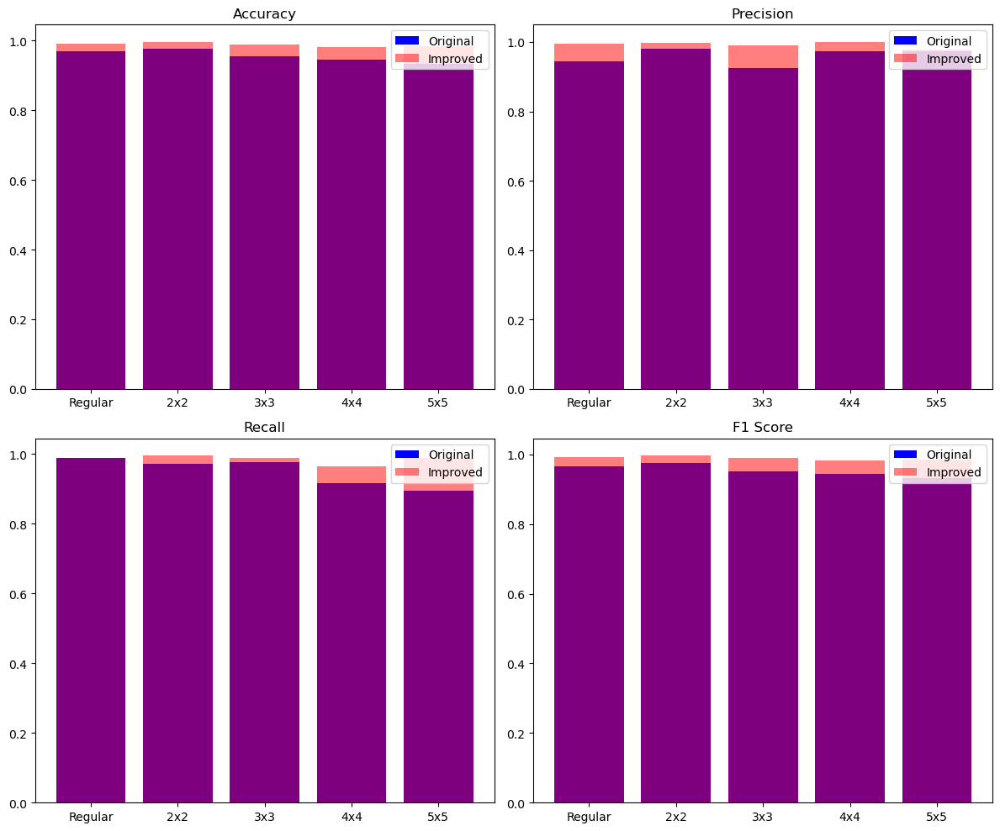

In [36]:

# Original data
googlenet_data = {
    'Accuracy': [0.9688, 0.9775, 0.9550, 0.9450, 0.9337],
    'Recall': [0.9889, 0.9712, 0.9777, 0.9154, 0.8954],
    'Precision': [0.9444, 0.9815, 0.9259, 0.9735, 0.9735],
    'F1 Score': [0.9662, 0.9763, 0.9511, 0.9436, 0.9328]
}

# Improved data
improved_data = {
    'Accuracy': [0.9925, 0.9962, 0.9900, 0.9825, 0.9850],
    'Precision': [0.9947, 0.9974, 0.9894, 1.0000, 0.9788],
    'Recall': [0.9895, 0.9947, 0.9894, 0.9643, 0.9893],
    'F1 Score': [0.9921, 0.9960, 0.9894, 0.9818, 0.9840]
}

# Permutations
permutations = ['Regular', '2x2', '3x3', '4x4', '5x5']

# Plotting
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
for i in range(2):
    for j in range(2):
        metric = metrics[i*2 + j]
        axs[i, j].bar(permutations, googlenet_data[metric], color='b',label='Original')
        axs[i, j].bar(permutations, improved_data[metric], color='r',  label='Improved')
        axs[i, j].set_title(metric)
        axs[i, j].legend()

plt.tight_layout()
plt.show()


**The models enhanced performance demonstrates resilience to permutation tests, showcasing negligible variations. Its robustness ensures consistent results across different data permutations, signifying heightened stability. And as resaults in most cases we can see sagnificant improvments**

### Increasing epochs

Creating train and evaluation function, to save the train and test accuracy - for the learning curve

In [47]:
def train_and_eval(model, optimizer, criterion, train_loader, test_loader, num_epochs=2, print_every=100):
    train_accuracies = []  # List to store training accuracies for each epoch
    test_accuracies = []   # List to store test accuracies for each epoch
    total_iters = 0        # Counter to keep track of total iterations
    
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for i, (images, labels) in enumerate(train_loader):
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            correct_train += (predicted == labels).sum().item()
            total_train += labels.size(0)
            total_iters += 1

            if total_iters % print_every == 0:
                print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{total_iters}], Loss: {running_loss / print_every:.4f}')
                running_loss = 0.0  # Reset running loss after printing

        # Calculate training and test accuracy at the end of each epoch
        train_accuracy = 100 * correct_train / total_train

        model.eval()  # Set the model to evaluation mode
        correct_test = 0
        total_test = 0
        with torch.no_grad():
            for images, labels in test_loader:
                outputs = model(images)
                _, predicted = torch.max(outputs.data, 1)
                total_test += labels.size(0)
                correct_test += (predicted == labels).sum().item()

        test_accuracy = 100 * correct_test / total_test

        # Append accuracies for the current epoch to the lists
        train_accuracies.append(train_accuracy)
        test_accuracies.append(test_accuracy)

        print(f'Epoch [{epoch+1}/{num_epochs}], Training Accuracy: {train_accuracy:.2f}%, Test Accuracy: {test_accuracy:.2f}%')

    return train_accuracies, test_accuracies


Since the model has worse train accuracy (than test) at the early stages of training (and because of regulariztion effects) as explained before, we will compare also the loss, to the train accuracy and test accuracy.

* **Increase epocs on 2x2 permutation + Learning Curve**

In [51]:
# Define the model architecture
googlenet_X_2x2 = models.googlenet(pretrained=True)
num_ftrs = googlenet_X_2x2.fc.in_features
googlenet_X_2x2.fc = nn.Linear(num_ftrs, 2)

# Define the optimizer and criterion
optimizer = optim.Adam(googlenet_X_2x2.parameters(), lr=0.0001)
criterion = nn.CrossEntropyLoss()

# Train and evaluate the model
train_accuracies_2x2, test_accuracies_2x2 = train_and_eval(googlenet_X_2x2, optimizer, criterion, train_loader_2x2, test_loader_2x2, num_epochs=4, print_every=100)


Epoch [1/4], Iteration [100], Loss: 0.3551
Epoch [1/4], Iteration [200], Loss: 0.2274
Epoch [1/4], Iteration [300], Loss: 0.2519
Epoch [1/4], Iteration [400], Loss: 0.1966
Epoch [1/4], Iteration [500], Loss: 0.2326
Epoch [1/4], Iteration [600], Loss: 0.2382
Epoch [1/4], Iteration [700], Loss: 0.2004
Epoch [1/4], Iteration [800], Loss: 0.1673
Epoch [1/4], Training Accuracy: 90.47%, Test Accuracy: 98.12%
Epoch [2/4], Iteration [900], Loss: 0.1452
Epoch [2/4], Iteration [1000], Loss: 0.1470
Epoch [2/4], Iteration [1100], Loss: 0.1341
Epoch [2/4], Iteration [1200], Loss: 0.1221
Epoch [2/4], Iteration [1300], Loss: 0.2002
Epoch [2/4], Iteration [1400], Loss: 0.1495
Epoch [2/4], Iteration [1500], Loss: 0.0737
Epoch [2/4], Iteration [1600], Loss: 0.1027
Epoch [2/4], Training Accuracy: 95.03%, Test Accuracy: 99.38%
Epoch [3/4], Iteration [1700], Loss: 0.1156
Epoch [3/4], Iteration [1800], Loss: 0.1005
Epoch [3/4], Iteration [1900], Loss: 0.0590
Epoch [3/4], Iteration [2000], Loss: 0.0416
Epoch

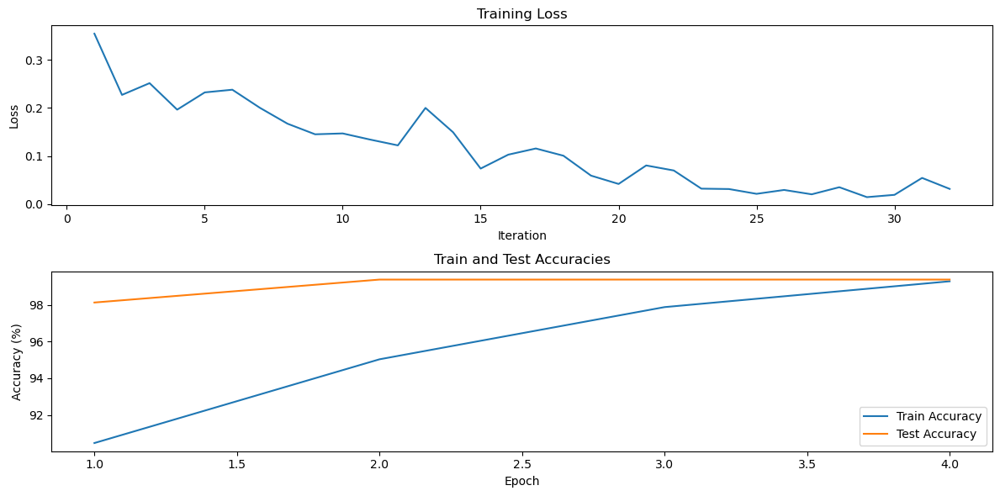

In [54]:

# Losses - - we forgot to save them :)
train_losses = [0.3551, 0.2274, 0.2519, 0.1966, 0.2326, 0.2382, 0.2004, 0.1673,
                0.1452, 0.1470, 0.1341, 0.1221, 0.2002, 0.1495, 0.0737, 0.1027,
                0.1156, 0.1005, 0.0590, 0.0416, 0.0802, 0.0697, 0.0318, 0.0310,
                0.0210, 0.0291, 0.0200, 0.0348, 0.0141, 0.0189, 0.0542, 0.0313]

# Number of epochs
num_epochs = len(train_accuracies)

# Plotting
plt.figure(figsize=(12, 6))

# Plot loss
plt.subplot(2, 1, 1)
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Training Loss')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Training Loss')

# Plot train and test accuracies
plt.subplot(2, 1, 2)
plt.plot(range(1, num_epochs + 1), train_accuracies_2x2, label='Train Accuracy')
plt.plot(range(1, num_epochs + 1), test_accuracies_2x2, label='Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.title('Train and Test Accuracies')
plt.legend()

plt.tight_layout()
plt.show()


It's evident that the peak accuracy is reached as early as the second epoch, with the loss plateauing shortly after (after the 16th iteration).

* **Increase epocs on 3x3 permutation + Learning Curve**

In [48]:
# Define the model architecture
googlenet_X_3x3 = models.googlenet(pretrained=True)
num_ftrs = googlenet_X_3x3.fc.in_features
googlenet_X_3x3.fc = nn.Linear(num_ftrs, 2)

# Define the optimizer and criterion
optimizer = optim.Adam(googlenet_X_3x3.parameters(), lr=0.0001)
criterion = nn.CrossEntropyLoss()

# Train and evaluate the model
train_accuracies_3x3, test_accuracies_3x3 = train_and_eval(googlenet_X_3x3, optimizer, criterion, train_loader_3x3, test_loader_3x3, num_epochs=4, print_every=100)


Epoch [1/4], Iteration [100], Loss: 0.4337
Epoch [1/4], Iteration [200], Loss: 0.2908
Epoch [1/4], Iteration [300], Loss: 0.2667
Epoch [1/4], Iteration [400], Loss: 0.2362
Epoch [1/4], Iteration [500], Loss: 0.2112
Epoch [1/4], Iteration [600], Loss: 0.2805
Epoch [1/4], Iteration [700], Loss: 0.2504
Epoch [1/4], Iteration [800], Loss: 0.1818
Epoch [1/4], Training Accuracy: 89.00%, Test Accuracy: 99.00%
Epoch [2/4], Iteration [900], Loss: 0.1838
Epoch [2/4], Iteration [1000], Loss: 0.1528
Epoch [2/4], Iteration [1100], Loss: 0.1254
Epoch [2/4], Iteration [1200], Loss: 0.1313
Epoch [2/4], Iteration [1300], Loss: 0.1611
Epoch [2/4], Iteration [1400], Loss: 0.1625
Epoch [2/4], Iteration [1500], Loss: 0.0915
Epoch [2/4], Iteration [1600], Loss: 0.0999
Epoch [2/4], Training Accuracy: 94.84%, Test Accuracy: 97.62%
Epoch [3/4], Iteration [1700], Loss: 0.1206
Epoch [3/4], Iteration [1800], Loss: 0.1055
Epoch [3/4], Iteration [1900], Loss: 0.0586
Epoch [3/4], Iteration [2000], Loss: 0.0939
Epoch

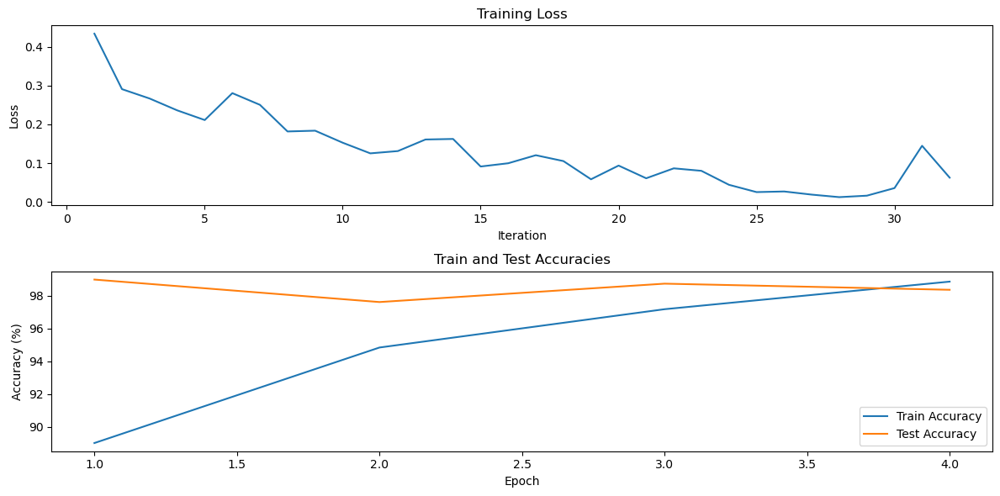

In [49]:

# Losses - - we forgot to save them :)
train_losses = [0.4337, 0.2908, 0.2667, 0.2362, 0.2112, 0.2805, 0.2504, 0.1818,
                0.1838, 0.1528, 0.1254, 0.1313, 0.1611, 0.1625, 0.0915, 0.0999,
                0.1206, 0.1055, 0.0586, 0.0939, 0.0612, 0.0868, 0.0804, 0.0444,
                0.0256, 0.0272, 0.0191, 0.0126, 0.0164, 0.0359, 0.1449, 0.0628]


# Number of epochs
num_epochs = len(train_accuracies)

# Plotting
plt.figure(figsize=(12, 6))

# Plot loss
plt.subplot(2, 1, 1)
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Training Loss')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Training Loss')

# Plot train and test accuracies
plt.subplot(2, 1, 2)
plt.plot(range(1, num_epochs + 1), train_accuracies_3x3, label='Train Accuracy')
plt.plot(range(1, num_epochs + 1), test_accuracies_3x3, label='Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.title('Train and Test Accuracies')
plt.legend()

plt.tight_layout()
plt.show()


We can see that the loss goes down and reaches kind of a plateau during the fourth epoch (which led to only a slight increase in the training accuracy), where the test accuracy doesn't improve after the first epoch, meaning 1 epoch is enough for the 3x3 resolution and we even overfit a bit after this.

* **Increase epocs on 4x4 permutation + Learning Curve**

In [52]:
# Define the model architecture
googlenet_X_4x4 = models.googlenet(pretrained=True)
num_ftrs = googlenet_X_4x4.fc.in_features
googlenet_X_4x4.fc = nn.Linear(num_ftrs, 2)

# Define the optimizer and criterion
optimizer = optim.Adam(googlenet_X_4x4.parameters(), lr=0.0001)
criterion = nn.CrossEntropyLoss()

# Train and evaluate the model
train_accuracies_4x4, test_accuracies_4x4 = train_and_eval(googlenet_X_4x4, optimizer, criterion, train_loader_4x4, test_loader_4x4, num_epochs=4, print_every=100)


Epoch [1/4], Iteration [100], Loss: 0.3672
Epoch [1/4], Iteration [200], Loss: 0.3285
Epoch [1/4], Iteration [300], Loss: 0.2924
Epoch [1/4], Iteration [400], Loss: 0.2551
Epoch [1/4], Iteration [500], Loss: 0.2665
Epoch [1/4], Iteration [600], Loss: 0.2407
Epoch [1/4], Iteration [700], Loss: 0.2643
Epoch [1/4], Iteration [800], Loss: 0.2023
Epoch [1/4], Training Accuracy: 88.78%, Test Accuracy: 97.62%
Epoch [2/4], Iteration [900], Loss: 0.1767
Epoch [2/4], Iteration [1000], Loss: 0.2110
Epoch [2/4], Iteration [1100], Loss: 0.1681
Epoch [2/4], Iteration [1200], Loss: 0.1662
Epoch [2/4], Iteration [1300], Loss: 0.0915
Epoch [2/4], Iteration [1400], Loss: 0.1304
Epoch [2/4], Iteration [1500], Loss: 0.1238
Epoch [2/4], Iteration [1600], Loss: 0.1101
Epoch [2/4], Training Accuracy: 95.34%, Test Accuracy: 98.62%
Epoch [3/4], Iteration [1700], Loss: 0.0676
Epoch [3/4], Iteration [1800], Loss: 0.0968
Epoch [3/4], Iteration [1900], Loss: 0.1736
Epoch [3/4], Iteration [2000], Loss: 0.1131
Epoch

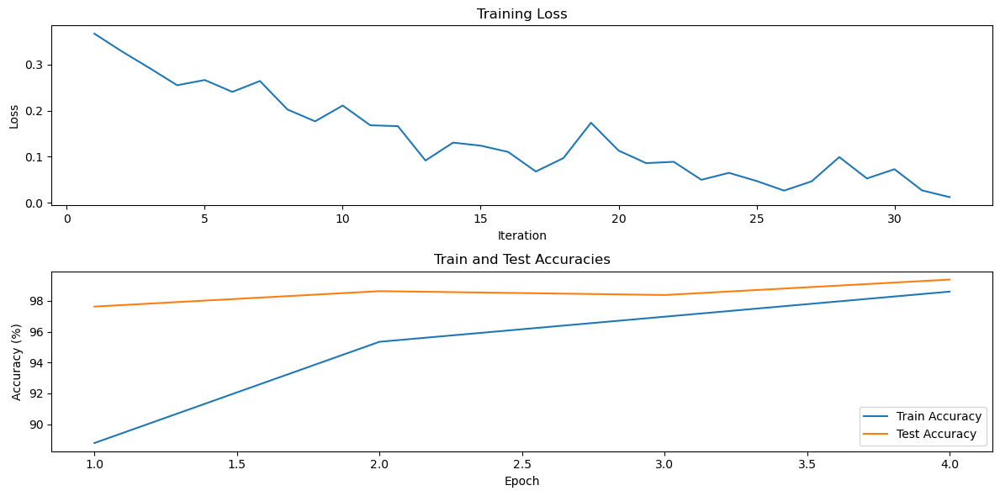

In [55]:

# Losses - - we forgot to save them :)
train_losses = [0.3672, 0.3285, 0.2924, 0.2551, 0.2665, 0.2407, 0.2643, 0.2023,
                0.1767, 0.2110, 0.1681, 0.1662, 0.0915, 0.1304, 0.1238, 0.1101,
                0.0676, 0.0968, 0.1736, 0.1131, 0.0858, 0.0887, 0.0496, 0.0647,
                0.0470, 0.0261, 0.0463, 0.0990, 0.0525, 0.0726, 0.0265, 0.0119]



# Number of epochs
num_epochs = len(train_accuracies)

# Plotting
plt.figure(figsize=(12, 6))

# Plot loss
plt.subplot(2, 1, 1)
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Training Loss')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Training Loss')

# Plot train and test accuracies
plt.subplot(2, 1, 2)
plt.plot(range(1, num_epochs + 1), train_accuracies_4x4, label='Train Accuracy')
plt.plot(range(1, num_epochs + 1), test_accuracies_4x4, label='Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.title('Train and Test Accuracies')
plt.legend()

plt.tight_layout()
plt.show()


In this case, we see that the model does improve almost at each epoch and has the best test accuracy in the fourth epoch. The loss doesn't seem to get to a certain plateau (but it is close to it).

* **Increase epocs on 5x5 permutation + Learning Curve**

In [53]:
# Define the model architecture
googlenet_X_5x5 = models.googlenet(pretrained=True)
num_ftrs = googlenet_X_5x5.fc.in_features
googlenet_X_5x5.fc = nn.Linear(num_ftrs, 2)

# Define the optimizer and criterion
optimizer = optim.Adam(googlenet_X_5x5.parameters(), lr=0.0001)
criterion = nn.CrossEntropyLoss()

# Train and evaluate the model
train_accuracies_5x5, test_accuracies_5x5 = train_and_eval(googlenet_X_5x5, optimizer, criterion, train_loader_5x5, test_loader_5x5, num_epochs=4, print_every=100)


Epoch [1/4], Iteration [100], Loss: 0.3823
Epoch [1/4], Iteration [200], Loss: 0.3275
Epoch [1/4], Iteration [300], Loss: 0.2889
Epoch [1/4], Iteration [400], Loss: 0.2817
Epoch [1/4], Iteration [500], Loss: 0.3138
Epoch [1/4], Iteration [600], Loss: 0.2514
Epoch [1/4], Iteration [700], Loss: 0.2357
Epoch [1/4], Iteration [800], Loss: 0.2162
Epoch [1/4], Training Accuracy: 87.66%, Test Accuracy: 97.00%
Epoch [2/4], Iteration [900], Loss: 0.1761
Epoch [2/4], Iteration [1000], Loss: 0.1343
Epoch [2/4], Iteration [1100], Loss: 0.1690
Epoch [2/4], Iteration [1200], Loss: 0.1140
Epoch [2/4], Iteration [1300], Loss: 0.1431
Epoch [2/4], Iteration [1400], Loss: 0.1561
Epoch [2/4], Iteration [1500], Loss: 0.1360
Epoch [2/4], Iteration [1600], Loss: 0.1286
Epoch [2/4], Training Accuracy: 94.84%, Test Accuracy: 97.88%
Epoch [3/4], Iteration [1700], Loss: 0.1070
Epoch [3/4], Iteration [1800], Loss: 0.0628
Epoch [3/4], Iteration [1900], Loss: 0.0618
Epoch [3/4], Iteration [2000], Loss: 0.0814
Epoch

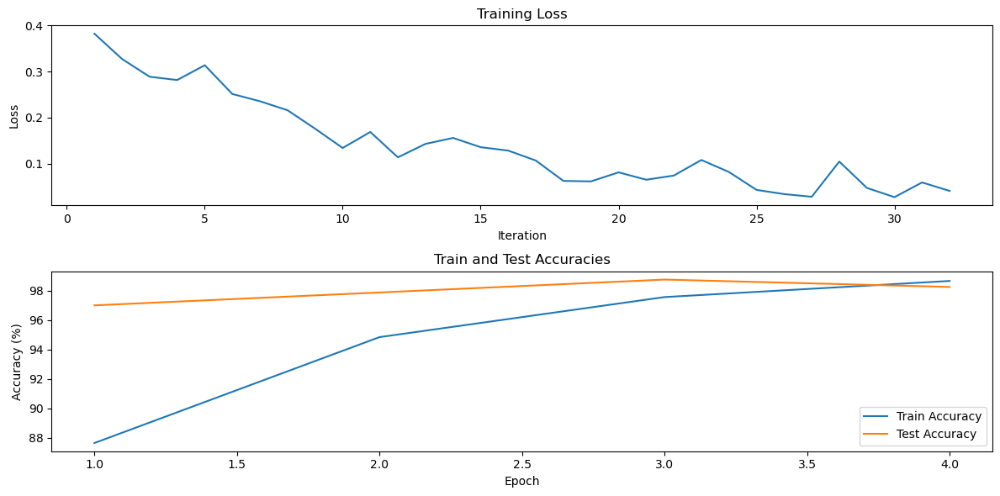

In [56]:

# Losses - - we forgot to save them :)
train_losses = [0.3823, 0.3275, 0.2889, 0.2817, 0.3138, 0.2514, 0.2357, 0.2162,
                0.1761, 0.1343, 0.1690, 0.1140, 0.1431, 0.1561, 0.1360, 0.1286,
                0.1070, 0.0628, 0.0618, 0.0814, 0.0654, 0.0744, 0.1082, 0.0822,
                0.0433, 0.0342, 0.0284, 0.1048, 0.0476, 0.0276, 0.0595, 0.0411]


# Number of epochs
num_epochs = len(train_accuracies)

# Plotting
plt.figure(figsize=(12, 6))

# Plot loss
plt.subplot(2, 1, 1)
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Training Loss')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Training Loss')

# Plot train and test accuracies
plt.subplot(2, 1, 2)
plt.plot(range(1, num_epochs + 1), train_accuracies_5x5, label='Train Accuracy')
plt.plot(range(1, num_epochs + 1), test_accuracies_5x5, label='Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.title('Train and Test Accuracies')
plt.legend()

plt.tight_layout()
plt.show()


Similarly, in this case, the test accuracy shows improvement with nearly every epoch, but it reaches its peak at the third epoch. The subsequent decrease in loss occurs at a slower rate after the third epoch, possibly validating this observation (and leading to only a slight increase in training accuracy).

#### Summary

As the complexity of the resolution increases, the significance of additional epochs becomes more apparent, as they achive almost 1% of improvement in test accuracy. It is observed that for the initial two resolutions, the model attains its highest accuracy on the test set within the first two epochs. However, for more intricate resolutions, peak accuracy is reached in the third and fourth epochs.

Furthermore, the GoogLenet model achieves very good results on the 2x2 and 3x3 resolutions, so it makes sense that more epochs won't increase the performance by much. Where in the 4x4 and 5x5 resolutions, the model (with 2 epochs) does slightly worse, meaning that perhaps there is room for improvement.

In such instances, increasing the number of epochs can be beneficial for the model's performance, but it's essential to proceed with caution to prevent overfitting.

## Permutation Ranking

We will start by looking at the 3x3 resolution

### 3x3 resolution

We will look at 5 different permutations:

#### First permutation

The original permutation will be the first (can be seen in the code above)

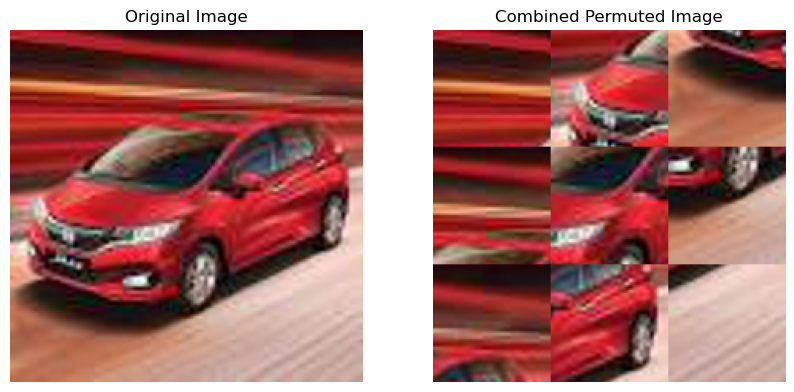

In [59]:
img_display = images_array[0] 
# Define the number of tiles you want to divide the image into (2 for a 2x2 grid)
num_tiles = 3

# Split the image into tiles
tiles = split_into_tiles(img_display, num_tiles)

# Permute the order of tiles
permuted_tiles = permute_tiles(tiles, num_tiles)

# Combine permuted tiles into a single image
combined_image = combine_tiles(permuted_tiles, num_tiles)

# Display the original and combined images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(img_display)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Combined Permuted Image')
plt.imshow(combined_image)
plt.axis('off')

plt.show()

#### Second permutation

This permutation logic reverses the tiles in each row. For a 2x2 grid, it flips the left and right tiles in each row. For a 3x3 grid, it flips the order of tiles in each row while keeping the rows in their original order.

In [391]:

def permute_tiles_second(tiles, num_tiles):
    # Initialize the list for permuted tiles
    permuted_tiles = []
    
    # Reverse the order of tiles in each row
    for j in range(num_tiles):
        for i in range(num_tiles - 1, -1, -1):
            index = j * num_tiles + i
            permuted_tiles.append(tiles[index])
    
    return permuted_tiles


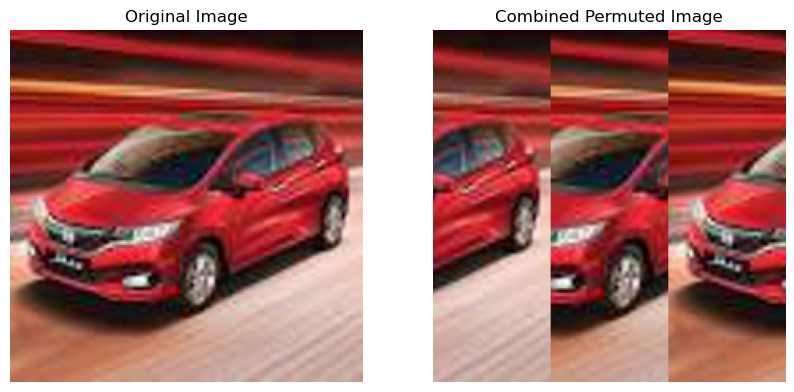

In [392]:
img_display = images_array[0] 
num_tiles = 3

# Split the image into tiles
tiles = split_into_tiles(img_display, num_tiles)

# Permute the order of tiles
permuted_tiles = permute_tiles_second(tiles, num_tiles)

# Combine permuted tiles into a single image
combined_image = combine_tiles(permuted_tiles, num_tiles)

# Display the original and combined images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(img_display)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Combined Permuted Image')
plt.imshow(combined_image)
plt.axis('off')

plt.show()



In [393]:
combined_images_list = []
for img_array in images_array:
    # Define the number of tiles you want to divide the image into (2 for a 2x2 grid)
    num_tiles = 3

    # Split the image into tiles
    tiles = split_into_tiles(img_array, num_tiles)

    # Permute the order of tiles
    permuted_tiles = permute_tiles_second(tiles, num_tiles)

    # Combine permuted tiles into a single image
    combined_image = combine_tiles(permuted_tiles, num_tiles)

    # Append the combined image to the list
    combined_images_list.append(combined_image)

# Convert the list of combined images to a numpy array
combined_images_array3_second = np.array(combined_images_list)

In [394]:
# now we put the 3x3 tile permuted images
images_tensor_3x3_second = torch.from_numpy(combined_images_array3_second).float()
labels_tensor = torch.from_numpy(labels_array).long()

images_tensor_3x3_second = images_tensor_3x3_second.permute(0, 3, 1, 2)

print(f"Images tensor shape: {images_tensor_3x3_second.shape}")  # Should be (N, 3, 224, 224)
print(f"Labels tensor shape: {labels_tensor.shape}")

# Split data into training and testing sets
train_images_3x3_second, test_images_3x3_second, train_labels_3x3_second, test_labels_3x3_second = train_test_split(images_tensor_3x3_second, labels_tensor, test_size=0.2, random_state=42)    
    
# Assuming you have defined your images and labels tensors
train_dataset_3x3_second = CustomDataset(images=train_images_3x3_second, labels=train_labels_3x3_second)
test_dataset_3x3_second = CustomDataset(images=test_images_3x3_second, labels=test_labels_3x3_second)

# Define DataLoader
train_loader_3x3_second = DataLoader(train_dataset_3x3_second, batch_size=4, shuffle=True)
test_loader_3x3_second = DataLoader(test_dataset_3x3_second, batch_size=4, shuffle=False)


Images tensor shape: torch.Size([4000, 3, 222, 222])
Labels tensor shape: torch.Size([4000])


#### Third permutation

This permutation logic takes each tile and moves it to the next position in a clockwise direction within the grid. The last tile in each cycle moves to the first position of the cycle.

In [353]:
def permute_tiles_clockwise_third(tiles, num_tiles):
    # Calculate total number of tiles
    total_tiles = num_tiles * num_tiles
    # Create an empty list for the new order of tiles
    permuted_tiles = [None] * total_tiles

    # Map each tile to its new position
    for i in range(total_tiles):
        row = i // num_tiles
        col = i % num_tiles

        # Calculate new position
        new_row = col
        new_col = num_tiles - 1 - row

        new_index = new_row * num_tiles + new_col
        permuted_tiles[new_index] = tiles[i]

    return permuted_tiles


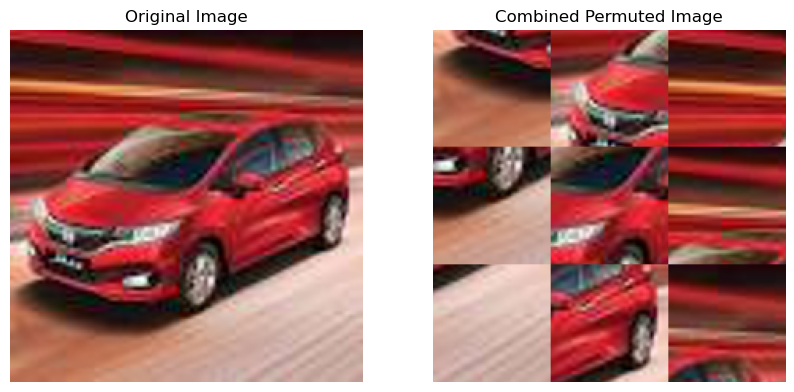

In [326]:
img_display = images_array[0] 
num_tiles = 3

# Split the image into tiles
tiles = split_into_tiles(img_display, num_tiles)

# Permute the order of tiles
permuted_tiles = permute_tiles_clockwise_third(tiles, num_tiles)

# Combine permuted tiles into a single image
combined_image = combine_tiles(permuted_tiles, num_tiles)

# Display the original and combined images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(img_display)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Combined Permuted Image')
plt.imshow(combined_image)
plt.axis('off')

plt.show()



In [359]:
combined_images_list = []
for img_array in images_array:
    num_tiles = 3
    tiles = split_into_tiles(img_array, num_tiles)
    permuted_tiles = permute_tiles_clockwise_third(tiles, num_tiles)
    combined_image = combine_tiles(permuted_tiles, num_tiles)
    combined_images_list.append(combined_image)

combined_images_array3_third = np.array(combined_images_list)
images_tensor_3x3_third = torch.from_numpy(combined_images_array3_third).float()
labels_tensor = torch.from_numpy(labels_array).long()
images_tensor_3x3_third = images_tensor_3x3_third.permute(0, 3, 1, 2)

print(f"Images tensor shape: {images_tensor_3x3_third.shape}")
print(f"Labels tensor shape: {labels_tensor.shape}")

train_images_3x3_third, test_images_3x3_third, train_labels_3x3_third, test_labels_3x3_third = train_test_split(images_tensor_3x3_third, labels_tensor, test_size=0.2, random_state=42)    

train_dataset_3x3_third = CustomDataset(images=train_images_3x3_third, labels=train_labels_3x3_third)
test_dataset_3x3_third = CustomDataset(images=test_images_3x3_third, labels=test_labels_3x3_third)

train_loader_3x3_third = DataLoader(train_dataset_3x3_third, batch_size=4, shuffle=True)
test_loader_3x3_third = DataLoader(test_dataset_3x3_third, batch_size=4, shuffle=False)


Images tensor shape: torch.Size([4000, 3, 222, 222])
Labels tensor shape: torch.Size([4000])


#### Fourth permutation

This logic swaps each even-indexed tile with the next tile (which will be odd-indexed), working across the grid in a linear fashion. This approach effectively interchanges even and odd tiles throughout the image.

In [327]:
def permute_tiles_even_odd_fourth(tiles, num_tiles):
    # Ensure we have a flat list of tiles
    total_tiles = len(tiles)
    # Create a new list for permuted tiles
    permuted_tiles = tiles.copy()

    # Swap even-indexed tile with the next odd-indexed tile
    for i in range(0, total_tiles - 1, 2):
        permuted_tiles[i], permuted_tiles[i + 1] = permuted_tiles[i + 1], permuted_tiles[i]
    
    return permuted_tiles


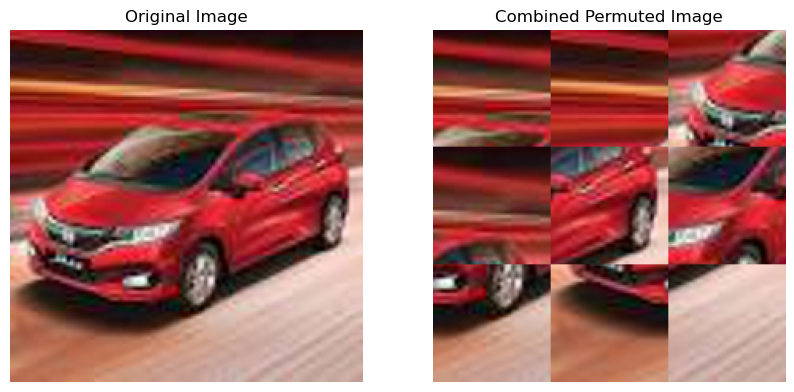

In [332]:
img_display = images_array[0] 
num_tiles = 3

# Split the image into tiles
tiles = split_into_tiles(img_display, num_tiles)

# Permute the order of tiles
permuted_tiles = permute_tiles_even_odd_fourth(tiles, num_tiles)

# Combine permuted tiles into a single image
combined_image = combine_tiles(permuted_tiles, num_tiles)

# Display the original and combined images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(img_display)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Combined Permuted Image')
plt.imshow(combined_image)
plt.axis('off')

plt.show()



In [361]:
combined_images_list = []
for img_array in images_array:
    num_tiles = 3
    tiles = split_into_tiles(img_array, num_tiles)
    permuted_tiles = permute_tiles_even_odd_forth(tiles, num_tiles)
    combined_image = combine_tiles(permuted_tiles, num_tiles)
    combined_images_list.append(combined_image)

combined_images_array3_fourth = np.array(combined_images_list)
images_tensor_3x3_fourth = torch.from_numpy(combined_images_array3_fourth).float()
labels_tensor = torch.from_numpy(labels_array).long()
images_tensor_3x3_fourth = images_tensor_3x3_fourth.permute(0, 3, 1, 2)

print(f"Images tensor shape: {images_tensor_3x3_fourth.shape}")
print(f"Labels tensor shape: {labels_tensor.shape}")

train_images_3x3_fourth, test_images_3x3_fourth, train_labels_3x3_fourth, test_labels_3x3_fourth = train_test_split(images_tensor_3x3_fourth, labels_tensor, test_size=0.2, random_state=42)    

train_dataset_3x3_fourth = CustomDataset(images=train_images_3x3_fourth, labels=train_labels_3x3_fourth)
test_dataset_3x3_fourth = CustomDataset(images=test_images_3x3_fourth, labels=test_labels_3x3_fourth)

train_loader_3x3_fourth = DataLoader(train_dataset_3x3_fourth, batch_size=4, shuffle=True)
test_loader_3x3_fourth = DataLoader(test_dataset_3x3_fourth, batch_size=4, shuffle=False)


Images tensor shape: torch.Size([4000, 3, 222, 222])
Labels tensor shape: torch.Size([4000])


#### Fifth permutation

This permutation logic flips the tiles within each row and then flips the order of all rows, mirroring the image both horizontally and vertically.

In [341]:
def permute_tiles_double_mirror_flip_fifth(tiles, num_tiles):
    # Initialize an empty list to hold the permuted tiles
    permuted_tiles = []
    
    # First, reverse the order of tiles within each row
    for row in range(num_tiles):
        start_index = row * num_tiles
        end_index = start_index + num_tiles
        # Extract the row of tiles and reverse it
        row_tiles = tiles[start_index:end_index]
        reversed_row_tiles = row_tiles[::-1]
        permuted_tiles.extend(reversed_row_tiles)
    
    # Then, reverse the order of all rows
    # This is done by chunking the flat list back into rows and reversing the list of rows
    rows = [permuted_tiles[i:i + num_tiles] for i in range(0, len(permuted_tiles), num_tiles)]
    reversed_rows = rows[::-1]
    
    # Flatten the reversed rows back into a single list of permuted tiles
    permuted_tiles = [tile for row in reversed_rows for tile in row]
    
    return permuted_tiles


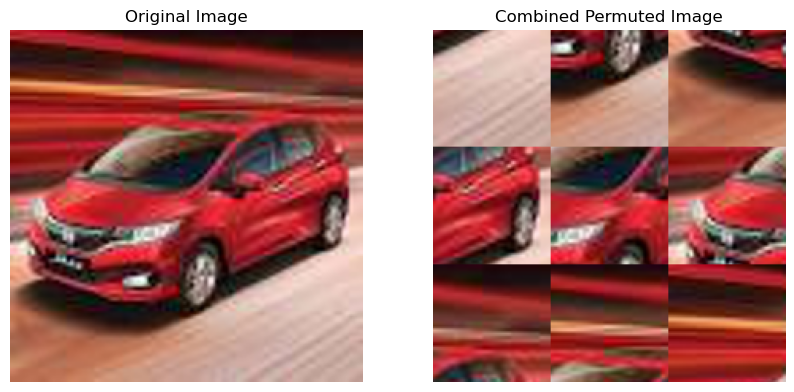

In [344]:
img_display = images_array[0] 
num_tiles = 3

# Split the image into tiles
tiles = split_into_tiles(img_display, num_tiles)

# Permute the order of tiles
permuted_tiles = permute_tiles_double_mirror_flip_fifth(tiles, num_tiles)

# Combine permuted tiles into a single image
combined_image = combine_tiles(permuted_tiles, num_tiles)

# Display the original and combined images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(img_display)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Combined Permuted Image')
plt.imshow(combined_image)
plt.axis('off')

plt.show()



In [363]:
combined_images_list = []
for img_array in images_array:
    num_tiles = 3
    tiles = split_into_tiles(img_array, num_tiles)
    permuted_tiles = permute_tiles_double_mirror_flip_fifth(tiles, num_tiles)
    combined_image = combine_tiles(permuted_tiles, num_tiles)
    combined_images_list.append(combined_image)

combined_images_array3_fifth = np.array(combined_images_list)
images_tensor_3x3_fifth = torch.from_numpy(combined_images_array3_fifth).float()
labels_tensor = torch.from_numpy(labels_array).long()
images_tensor_3x3_fifth = images_tensor_3x3_fifth.permute(0, 3, 1, 2)

print(f"Images tensor shape: {images_tensor_3x3_fifth.shape}")
print(f"Labels tensor shape: {labels_tensor.shape}")

train_images_3x3_fifth, test_images_3x3_fifth, train_labels_3x3_fifth, test_labels_3x3_fifth = train_test_split(images_tensor_3x3_fifth, labels_tensor, test_size=0.2, random_state=42)    

train_dataset_3x3_fifth = CustomDataset(images=train_images_3x3_fifth, labels=train_labels_3x3_fifth)
test_dataset_3x3_fifth = CustomDataset(images=test_images_3x3_fifth, labels=test_labels_3x3_fifth)

train_loader_3x3_fifth = DataLoader(train_dataset_3x3_fifth, batch_size=4, shuffle=True)
test_loader_3x3_fifth = DataLoader(test_dataset_3x3_fifth, batch_size=4, shuffle=False)



Images tensor shape: torch.Size([4000, 3, 222, 222])
Labels tensor shape: torch.Size([4000])


### Training the different models:

We already trained a model with the first permutation

#### Second permutation

In [364]:

googlenet_3x3_second = models.googlenet(pretrained=True)
num_ftrs = googlenet_3x3_second.fc.in_features
googlenet_3x3_second.fc = nn.Linear(num_ftrs, 2)  # 2 classes (cars and bikes)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(googlenet_3x3_second.parameters(), lr=0.001)


C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [365]:
# Training loop
for epoch in range(num_epochs):
    googlenet_3x3_second.train()
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader_3x3_second, 1):
        optimizer.zero_grad()
        outputs = googlenet_3x3_second(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every print_every iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader_3x3_second)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0  # Reset running loss
        
        # Compute train accuracy
        _, predicted = torch.max(outputs, 1)  # Use logits for predictions
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")


Epoch [1/2], Iteration [100/800], Loss: 0.5112
Epoch [1/2], Iteration [200/800], Loss: 0.4209
Epoch [1/2], Iteration [300/800], Loss: 0.4441
Epoch [1/2], Iteration [400/800], Loss: 0.3728
Epoch [1/2], Iteration [500/800], Loss: 0.3293
Epoch [1/2], Iteration [600/800], Loss: 0.3509
Epoch [1/2], Iteration [700/800], Loss: 0.2538
Epoch [1/2], Iteration [800/800], Loss: 0.2939
Epoch [1/2], Loss: 1.1574, Train Accuracy: 84.88%
Epoch [2/2], Iteration [100/800], Loss: 0.3086
Epoch [2/2], Iteration [200/800], Loss: 0.3308
Epoch [2/2], Iteration [300/800], Loss: 0.3631
Epoch [2/2], Iteration [400/800], Loss: 0.2594
Epoch [2/2], Iteration [500/800], Loss: 0.2601
Epoch [2/2], Iteration [600/800], Loss: 0.2559
Epoch [2/2], Iteration [700/800], Loss: 0.2603
Epoch [2/2], Iteration [800/800], Loss: 0.2913
Epoch [2/2], Loss: 1.1801, Train Accuracy: 88.41%
Training completed.


In [369]:

model_performance = []  # List to store performance metrics for each model

googlenet_3x3_second.eval()
correct_test = 0
total_test = 0
predicted_labels = []
true_labels = []

with torch.no_grad():
    for images, labels in test_loader_3x3_second:
        outputs = googlenet_3x3_second(images)
        _, predicted = torch.max(outputs.data, 1)
        
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())
        
        correct_test += (predicted == labels).sum().item()
        total_test += labels.size(0)

accuracy = 100 * correct_test / total_test

# Ensure labels and outputs are in the correct form for multiclass AUC calculation if necessary
if len(true_labels[0].shape) == 1:  # Binary classification
    f1 = f1_score(true_labels, predicted_labels, average='binary')
    auc = roc_auc_score(true_labels, predicted_labels)
else:  # Multiclass classification, one-vs-rest
    f1 = f1_score(true_labels, predicted_labels, average='macro')
    auc = roc_auc_score(true_labels, predicted_labels, average='macro', multi_class='ovr')

print(f'Test Accuracy: {accuracy:.2f}%')
print(f'F1 Score: {f1:.2f}')
print(f'AUC: {auc:.2f}')

# Append performance metrics for the current model to the list
model_performance.append({
    'model': 'googlenet_3x3_second',
    'accuracy': accuracy,
    'f1': f1,
    'auc': auc
})


Test Accuracy: 96.75%
F1 Score: 0.97
AUC: 0.97


#### Third permutation

In [370]:
googlenet_3x3_third = models.googlenet(pretrained=True)
num_ftrs = googlenet_3x3_third.fc.in_features
googlenet_3x3_third.fc = nn.Linear(num_ftrs, 2)  # 2 classes (cars and bikes)

#  loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(googlenet_3x3_third.parameters(), lr=0.001)



C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [371]:
# Training loop
for epoch in range(num_epochs):
    googlenet_3x3_third.train()
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader_3x3_third, 1):
        optimizer.zero_grad()
        outputs = googlenet_3x3_third(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every print_every iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader_3x3_third)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0
        
        # Compute train accuracy
        _, predicted = torch.max(outputs, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")



Epoch [1/2], Iteration [100/800], Loss: 0.5170
Epoch [1/2], Iteration [200/800], Loss: 0.3641
Epoch [1/2], Iteration [300/800], Loss: 0.4527
Epoch [1/2], Iteration [400/800], Loss: 0.3690
Epoch [1/2], Iteration [500/800], Loss: 0.3752
Epoch [1/2], Iteration [600/800], Loss: 0.3334
Epoch [1/2], Iteration [700/800], Loss: 0.4033
Epoch [1/2], Iteration [800/800], Loss: 0.3797
Epoch [1/2], Loss: 1.7364, Train Accuracy: 83.41%
Epoch [2/2], Iteration [100/800], Loss: 0.3544
Epoch [2/2], Iteration [200/800], Loss: 0.3816
Epoch [2/2], Iteration [300/800], Loss: 0.3891
Epoch [2/2], Iteration [400/800], Loss: 0.3863
Epoch [2/2], Iteration [500/800], Loss: 0.3367
Epoch [2/2], Iteration [600/800], Loss: 0.3250
Epoch [2/2], Iteration [700/800], Loss: 0.3102
Epoch [2/2], Iteration [800/800], Loss: 0.3035
Epoch [2/2], Loss: 0.1688, Train Accuracy: 86.03%
Training completed.


In [372]:

googlenet_3x3_third.eval()
correct_test = 0
total_test = 0
predicted_labels = []
true_labels = []

with torch.no_grad():
    for images, labels in test_loader_3x3_third:
        outputs = googlenet_3x3_third(images)
        _, predicted = torch.max(outputs.data, 1)
        
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())
        
        correct_test += (predicted == labels).sum().item()
        total_test += labels.size(0)

accuracy = 100 * correct_test / total_test

# Ensure labels and outputs are in the correct form for multiclass AUC calculation if necessary
if len(true_labels[0].shape) == 1:  # Binary classification
    f1 = f1_score(true_labels, predicted_labels, average='binary')
    auc = roc_auc_score(true_labels, predicted_labels)
else:  # Multiclass classification, one-vs-rest
    f1 = f1_score(true_labels, predicted_labels, average='macro')
    auc = roc_auc_score(true_labels, predicted_labels, average='macro', multi_class='ovr')

print(f'Test Accuracy: {accuracy:.2f}%')
print(f'F1 Score: {f1:.2f}')
print(f'AUC: {auc:.2f}')

# Append performance metrics for the current model to the list
model_performance.append({
    'model': 'googlenet_3x3_third',
    'accuracy': accuracy,
    'f1': f1,
    'auc': auc
})


Test Accuracy: 93.00%
F1 Score: 0.93
AUC: 0.93


#### Fourth permutation

In [373]:
googlenet_3x3_fourth = models.googlenet(pretrained=True)
num_ftrs = googlenet_3x3_fourth.fc.in_features
googlenet_3x3_fourth.fc = nn.Linear(num_ftrs, 2)  # 2 classes (cars and bikes)

# loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(googlenet_3x3_fourth.parameters(), lr=0.001)



C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [375]:
# Training loop
for epoch in range(num_epochs):
    googlenet_3x3_fourth.train()
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader_3x3_fourth, 1):
        optimizer.zero_grad()
        outputs = googlenet_3x3_fourth(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every print_every iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader_3x3_fourth)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0
        
        # Compute train accuracy
        _, predicted = torch.max(outputs, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")



Epoch [1/2], Iteration [100/800], Loss: 0.4673
Epoch [1/2], Iteration [200/800], Loss: 0.4118
Epoch [1/2], Iteration [300/800], Loss: 0.3502
Epoch [1/2], Iteration [400/800], Loss: 0.3133
Epoch [1/2], Iteration [500/800], Loss: 0.4601
Epoch [1/2], Iteration [600/800], Loss: 0.4006
Epoch [1/2], Iteration [700/800], Loss: 0.3457
Epoch [1/2], Iteration [800/800], Loss: 0.4035
Epoch [1/2], Loss: 0.6620, Train Accuracy: 83.72%
Epoch [2/2], Iteration [100/800], Loss: 0.3204
Epoch [2/2], Iteration [200/800], Loss: 0.3214
Epoch [2/2], Iteration [300/800], Loss: 0.2256
Epoch [2/2], Iteration [400/800], Loss: 0.2877
Epoch [2/2], Iteration [500/800], Loss: 0.2675
Epoch [2/2], Iteration [600/800], Loss: 0.3566
Epoch [2/2], Iteration [700/800], Loss: 0.3032
Epoch [2/2], Iteration [800/800], Loss: 0.2997
Epoch [2/2], Loss: 0.1981, Train Accuracy: 88.06%
Training completed.


In [376]:

googlenet_3x3_fourth.eval()
correct_test = 0
total_test = 0
predicted_labels = []
true_labels = []

with torch.no_grad():
    for images, labels in test_loader_3x3_fourth:
        outputs = googlenet_3x3_third(images)
        _, predicted = torch.max(outputs.data, 1)
        
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())
        
        correct_test += (predicted == labels).sum().item()
        total_test += labels.size(0)

accuracy = 100 * correct_test / total_test

# Ensure labels and outputs are in the correct form for multiclass AUC calculation if necessary
if len(true_labels[0].shape) == 1:  # Binary classification
    f1 = f1_score(true_labels, predicted_labels, average='binary')
    auc = roc_auc_score(true_labels, predicted_labels)
else:  # Multiclass classification, one-vs-rest
    f1 = f1_score(true_labels, predicted_labels, average='macro')
    auc = roc_auc_score(true_labels, predicted_labels, average='macro', multi_class='ovr')

print(f'Test Accuracy: {accuracy:.2f}%')
print(f'F1 Score: {f1:.2f}')
print(f'AUC: {auc:.2f}')

# Append performance metrics for the current model to the list
model_performance.append({
    'model': 'googlenet_3x3_fourth',
    'accuracy': accuracy,
    'f1': f1,
    'auc': auc
})


Test Accuracy: 89.00%
F1 Score: 0.89
AUC: 0.89


#### Fifth permutation

In [377]:
googlenet_3x3_fifth = models.googlenet(pretrained=True)
num_ftrs = googlenet_3x3_fifth.fc.in_features
googlenet_3x3_fifth.fc = nn.Linear(num_ftrs, 2)  # 2 classes (cars and bikes)

# loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(googlenet_3x3_fifth.parameters(), lr=0.001)




C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [378]:
# Training loop
for epoch in range(num_epochs):
    googlenet_3x3_fifth.train()
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader_3x3_fifth, 1):
        optimizer.zero_grad()
        outputs = googlenet_3x3_fifth(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every print_every iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader_3x3_fifth)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0  # Reset running loss
        
        # Compute train accuracy
        _, predicted = torch.max(outputs, 1)  # Use logits for predictions
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")


Epoch [1/2], Iteration [100/800], Loss: 0.4401
Epoch [1/2], Iteration [200/800], Loss: 0.4503
Epoch [1/2], Iteration [300/800], Loss: 0.4594
Epoch [1/2], Iteration [400/800], Loss: 0.4303
Epoch [1/2], Iteration [500/800], Loss: 0.4246
Epoch [1/2], Iteration [600/800], Loss: 0.4284
Epoch [1/2], Iteration [700/800], Loss: 0.3470
Epoch [1/2], Iteration [800/800], Loss: 0.3358
Epoch [1/2], Loss: 0.7084, Train Accuracy: 83.00%
Epoch [2/2], Iteration [100/800], Loss: 0.3923
Epoch [2/2], Iteration [200/800], Loss: 0.3189
Epoch [2/2], Iteration [300/800], Loss: 0.3274
Epoch [2/2], Iteration [400/800], Loss: 0.3943
Epoch [2/2], Iteration [500/800], Loss: 0.3352
Epoch [2/2], Iteration [600/800], Loss: 0.3678
Epoch [2/2], Iteration [700/800], Loss: 0.3055
Epoch [2/2], Iteration [800/800], Loss: 0.3529
Epoch [2/2], Loss: 0.2068, Train Accuracy: 86.38%
Training completed.


In [379]:

# Set the model to evaluation mode
googlenet_3x3_fifth.eval()
correct_test = 0
total_test = 0
predicted_labels = []
true_labels = []

with torch.no_grad():
    for images, labels in test_loader_3x3_fifth:
        outputs = googlenet_3x3_fifth(images)
        _, predicted = torch.max(outputs.data, 1)
        
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())
        
        correct_test += (predicted == labels).sum().item()
        total_test += labels.size(0)

accuracy = 100 * correct_test / total_test

if len(true_labels[0].shape) == 1:  # Binary classification
    f1 = f1_score(true_labels, predicted_labels, average='binary')
    auc = roc_auc_score(true_labels, predicted_labels)
else:  # Multiclass classification, one-vs-rest
    f1 = f1_score(true_labels, predicted_labels, average='macro')
    auc = roc_auc_score(true_labels, predicted_labels, average='macro', multi_class='ovr')

print(f'Test Accuracy: {accuracy:.2f}%')
print(f'F1 Score: {f1:.2f}')
print(f'AUC: {auc:.2f}')

# Append performance metrics for the current model to the list
model_performance.append({
    'model': 'googlenet_3x3_fifth',
    'accuracy': accuracy,
    'f1': f1,
    'auc': auc
})


Test Accuracy: 94.62%
F1 Score: 0.95
AUC: 0.95


Since the F1 and AUC of all models are similar to their responding accuracy, we will focus just on that. In addition the data is not skewd so accuracy is a good metric for evaluation.

Adding the accuracy for the original permutation

In [383]:
# Adding performance metrics for googlenet_3x3_original
model_performance.append({
    'model': 'googlenet_3x3_original',
    'accuracy': 95.50,
    'f1': 'unknown',  
    'auc': 'unknown'  
})

# printing out the model performance for verification
for model_info in model_performance:
    print(f"Model: {model_info['model']}, Accuracy: {model_info['accuracy']}, F1: {model_info['f1']}, AUC: {model_info['auc']}")


Model: googlenet_3x3_second, Accuracy: 96.75, F1: 0.9674754032737256, AUC: 0.9689184783971514
Model: googlenet_3x3_third, Accuracy: 93.0, F1: 0.9295491143317229, AUC: 0.9284084355174402
Model: googlenet_3x3_fourth, Accuracy: 89.0, F1: 0.8887139505915234, AUC: 0.8867699791870408
Model: googlenet_3x3_fifth, Accuracy: 94.625, F1: 0.9462196645295237, AUC: 0.9478108779056647
Model: googlenet_3x3_original, Accuracy: 95.5, F1: unknown, AUC: unknown


### Permutation Ranking:

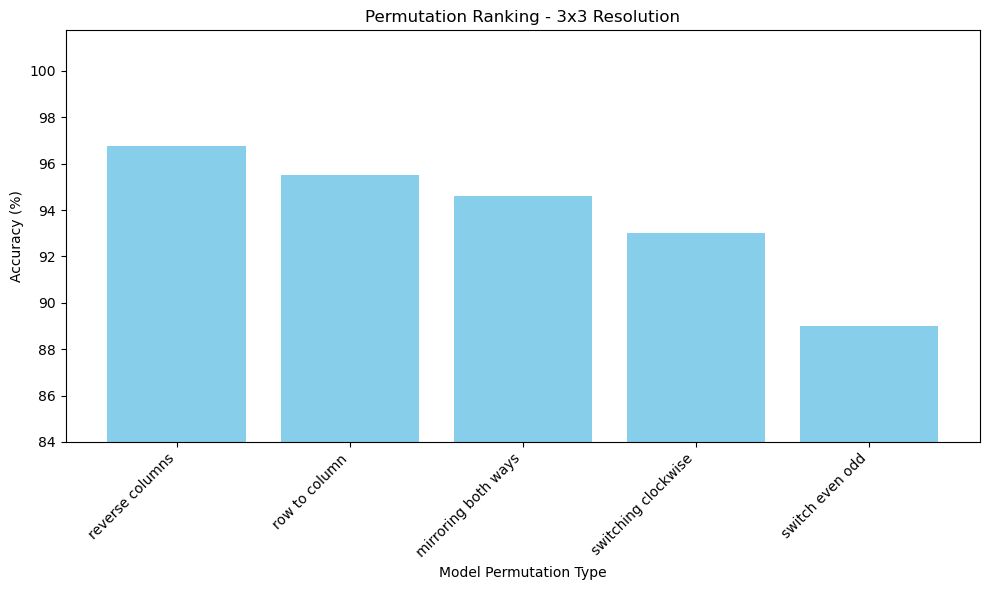

In [434]:

# Sort the model_performance list by accuracy in decreasing order
sorted_performance = sorted(model_performance, key=lambda x: x['accuracy'], reverse=True)

# Extract model names and their accuracies
model_names = [model['model'] for model in sorted_performance]
accuracies = [model['accuracy'] for model in sorted_performance]

# Define a mapping from model names to new descriptions
name_to_description = {
    'googlenet_3x3_original': 'row to column',
    'googlenet_3x3_second': 'reverse columns',
    'googlenet_3x3_third': 'switching clockwise',
    'googlenet_3x3_fourth': 'switch even odd',
    'googlenet_3x3_fifth': 'mirroring both ways'
}

# Use the mapping to update model names with descriptions
model_descriptions = [name_to_description[name] for name in model_names]

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(model_descriptions, accuracies, color='skyblue')
plt.xlabel('Model Permutation Type')
plt.ylabel('Accuracy (%)')
plt.title('Permutation Ranking - 3x3 Resolution')
plt.xticks(rotation=45, ha="right")
plt.ylim([min(accuracies) - 5, max(accuracies) + 5])  # Adjust limits to give some space above the highest bar
plt.tight_layout()
plt.show()


It seems that when the permutation is more complex the accuracy gets down

Reverse Columns: This permutation, which likely involves reversing the order of columns within the image, appears to have minimal impact on the model's performance, suggesting that GoogLeNet is able to recognize features irrespective of horizontal flips. It might be due to the model's convolutional layers capturing patterns that are invariant to horizontal shifts. It is easy to understand why it looks the less complex, as it is only changes the picture in 1 dimension.

Row to Column: The slight decrease in accuracy here could be attributed to the transformation of spatial relationships within the image. Since the model has been pretrained on standard images, it might initially struggle with new patterns of features aligned differently.

Mirroring Both Ways: The drop in accuracy is more noticeable with this permutation. Mirroring both horizontally and vertically can significantly alter the context and composition of the images, making it harder for the model to identify the objects based on its pretrained knowledge.

Switching Clockwise: A clockwise permutation might rotate segments of the image, which changes the orientation of the objects. The model's performance dip indicates that while GoogLeNet can handle some rotation invariance, a complete restructuring of the image affects its ability to classify objects correctly.

Switch Even Odd: The most significant drop in accuracy occurs with this permutation, suggesting that alternating the position of even and odd segments disrupts the model's ability to correctly interpret and classify the images. This type of permutation may lead to the most substantial feature distortion, making it difficult for the model to apply its learned filters effectively.

In summary, the model's performance varies with the complexity of the permutations. Simple flips or positional changes that preserve most of the original structure are handled well, while more complex manipulations that significantly distort the spatial relationships within the image lead to a decrease in performance. This indicates that GoogLeNet, despite its powerful feature extraction capabilities, still relies on the spatial arrangement of features within an image to some extent for accurate classification.

Let's try with different number of tiles - higher resolution, and see if the trend is the same.

### 5x5 resolution

#### First permutation

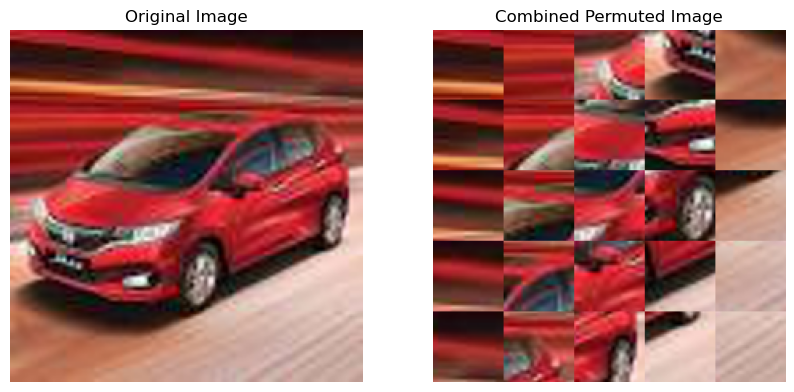

In [60]:
img_display = images_array[0] 
# Define the number of tiles you want to divide the image into (2 for a 2x2 grid)
num_tiles = 5

# Split the image into tiles
tiles = split_into_tiles(img_display, num_tiles)

# Permute the order of tiles
permuted_tiles = permute_tiles(tiles, num_tiles)

# Combine permuted tiles into a single image
combined_image = combine_tiles(permuted_tiles, num_tiles)

# Display the original and combined images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(img_display)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Combined Permuted Image')
plt.imshow(combined_image)
plt.axis('off')

plt.show()

#### Second permutation

This permutation logic reverses the tiles in each row. For a 2x2 grid, it flips the left and right tiles in each row. For a 3x3 grid, it flips the order of tiles in each row while keeping the rows in their original order.

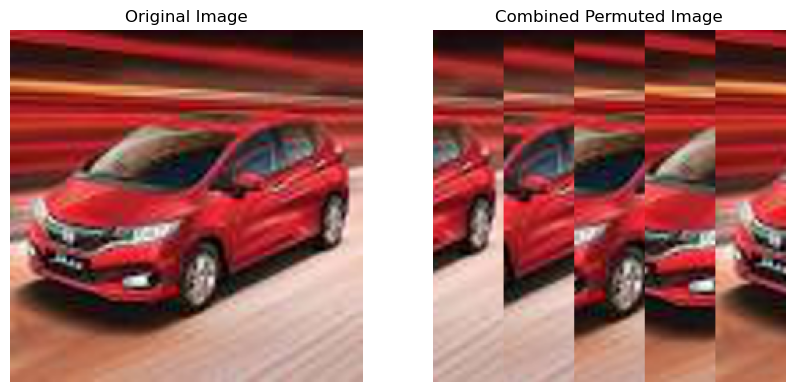

In [400]:
img_display = images_array[0] 
num_tiles = 5

# Split the image into tiles
tiles = split_into_tiles(img_display, num_tiles)

# Permute the order of tiles
permuted_tiles = permute_tiles_second(tiles, num_tiles)

# Combine permuted tiles into a single image
combined_image = combine_tiles(permuted_tiles, num_tiles)

# Display the original and combined images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(img_display)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Combined Permuted Image')
plt.imshow(combined_image)
plt.axis('off')

plt.show()



In [401]:
combined_images_list = []
for img_array in images_array:
    num_tiles = 5

    # Split the image into tiles
    tiles = split_into_tiles(img_array, num_tiles)

    # Permute the order of tiles
    permuted_tiles = permute_tiles_second(tiles, num_tiles)

    # Combine permuted tiles into a single image
    combined_image = combine_tiles(permuted_tiles, num_tiles)

    # Append the combined image to the list
    combined_images_list.append(combined_image)

# Convert the list of combined images to a numpy array
combined_images_array5_second = np.array(combined_images_list)

In [402]:
images_tensor_5x5_second = torch.from_numpy(combined_images_array5_second).float()
labels_tensor = torch.from_numpy(labels_array).long()

images_tensor_5x5_second = images_tensor_5x5_second.permute(0, 3, 1, 2)

print(f"Images tensor shape: {images_tensor_5x5_second.shape}")  # Should be (N, 3, 224, 224)
print(f"Labels tensor shape: {labels_tensor.shape}")

# Split data into training and testing sets
train_images_5x5_second, test_images_5x5_second, train_labels_5x5_second, test_labels_5x5_second = train_test_split(images_tensor_5x5_second, labels_tensor, test_size=0.2, random_state=42)    
    
# Assuming you have defined your images and labels tensors
train_dataset_5x5_second = CustomDataset(images=train_images_5x5_second, labels=train_labels_5x5_second)
test_dataset_5x5_second = CustomDataset(images=test_images_5x5_second, labels=test_labels_5x5_second)

# Define DataLoader
train_loader_5x5_second = DataLoader(train_dataset_5x5_second, batch_size=4, shuffle=True)
test_loader_5x5_second = DataLoader(test_dataset_5x5_second, batch_size=4, shuffle=False)


Images tensor shape: torch.Size([4000, 3, 220, 220])
Labels tensor shape: torch.Size([4000])


#### Third permutation

This permutation logic takes each tile and moves it to the next position in a clockwise direction within the grid. The last tile in each cycle moves to the first position of the cycle.

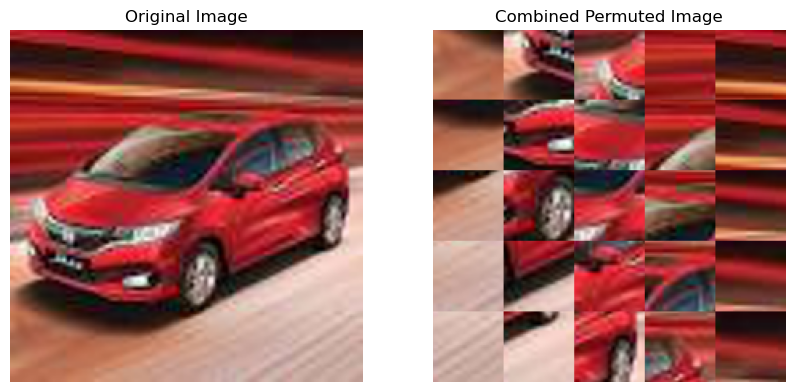

In [405]:
img_display = images_array[0] 
num_tiles = 5

# Split the image into tiles
tiles = split_into_tiles(img_display, num_tiles)

# Permute the order of tiles
permuted_tiles = permute_tiles_clockwise_third(tiles, num_tiles)

# Combine permuted tiles into a single image
combined_image = combine_tiles(permuted_tiles, num_tiles)

# Display the original and combined images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(img_display)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Combined Permuted Image')
plt.imshow(combined_image)
plt.axis('off')

plt.show()



In [406]:
combined_images_list = []
for img_array in images_array:
    num_tiles = 5
    tiles = split_into_tiles(img_array, num_tiles)
    permuted_tiles = permute_tiles_clockwise_third(tiles, num_tiles)
    combined_image = combine_tiles(permuted_tiles, num_tiles)
    combined_images_list.append(combined_image)

combined_images_array5_third = np.array(combined_images_list)
images_tensor_5x5_third = torch.from_numpy(combined_images_array5_third).float()
labels_tensor = torch.from_numpy(labels_array).long()
images_tensor_5x5_third = images_tensor_5x5_third.permute(0, 3, 1, 2)

print(f"Images tensor shape: {images_tensor_5x5_third.shape}")
print(f"Labels tensor shape: {labels_tensor.shape}")

train_images_5x5_third, test_images_5x5_third, train_labels_5x5_third, test_labels_5x5_third = train_test_split(images_tensor_5x5_third, labels_tensor, test_size=0.2, random_state=42)    

train_dataset_5x5_third = CustomDataset(images=train_images_5x5_third, labels=train_labels_5x5_third)
test_dataset_5x5_third = CustomDataset(images=test_images_5x5_third, labels=test_labels_5x5_third)

train_loader_5x5_third = DataLoader(train_dataset_5x5_third, batch_size=4, shuffle=True)
test_loader_5x5_third = DataLoader(test_dataset_5x5_third, batch_size=4, shuffle=False)


Images tensor shape: torch.Size([4000, 3, 220, 220])
Labels tensor shape: torch.Size([4000])


#### Fourth permutation

This logic swaps each even-indexed tile with the next tile (which will be odd-indexed), working across the grid in a linear fashion. This approach effectively interchanges even and odd tiles throughout the image.

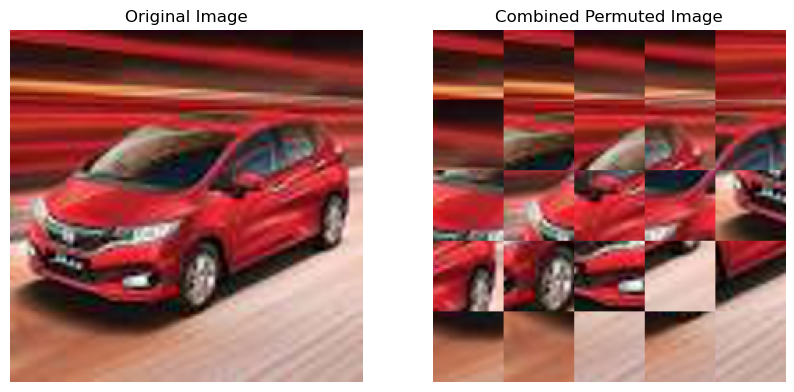

In [407]:
img_display = images_array[0] 
num_tiles = 5

# Split the image into tiles
tiles = split_into_tiles(img_display, num_tiles)

# Permute the order of tiles
permuted_tiles = permute_tiles_even_odd_fourth(tiles, num_tiles)

# Combine permuted tiles into a single image
combined_image = combine_tiles(permuted_tiles, num_tiles)

# Display the original and combined images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(img_display)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Combined Permuted Image')
plt.imshow(combined_image)
plt.axis('off')

plt.show()



In [408]:
combined_images_list = []
for img_array in images_array:
    num_tiles = 5
    tiles = split_into_tiles(img_array, num_tiles)
    permuted_tiles = permute_tiles_even_odd_forth(tiles, num_tiles)
    combined_image = combine_tiles(permuted_tiles, num_tiles)
    combined_images_list.append(combined_image)

combined_images_array5_fourth = np.array(combined_images_list)
images_tensor_5x5_fourth = torch.from_numpy(combined_images_array5_fourth).float()
labels_tensor = torch.from_numpy(labels_array).long()
images_tensor_5x5_fourth = images_tensor_5x5_fourth.permute(0, 3, 1, 2)

print(f"Images tensor shape: {images_tensor_5x5_fourth.shape}")
print(f"Labels tensor shape: {labels_tensor.shape}")

train_images_5x5_fourth, test_images_5x5_fourth, train_labels_5x5_fourth, test_labels_5x5_fourth = train_test_split(images_tensor_5x5_fourth, labels_tensor, test_size=0.2, random_state=42)    

train_dataset_5x5_fourth = CustomDataset(images=train_images_5x5_fourth, labels=train_labels_5x5_fourth)
test_dataset_5x5_fourth = CustomDataset(images=test_images_5x5_fourth, labels=test_labels_5x5_fourth)

train_loader_5x5_fourth = DataLoader(train_dataset_3x3_fourth, batch_size=4, shuffle=True)
test_loader_5x5_fourth = DataLoader(test_dataset_3x3_fourth, batch_size=4, shuffle=False)


Images tensor shape: torch.Size([4000, 3, 220, 220])
Labels tensor shape: torch.Size([4000])


#### Fifth permutation

This permutation logic flips the tiles within each row and then flips the order of all rows, mirroring the image both horizontally and vertically.

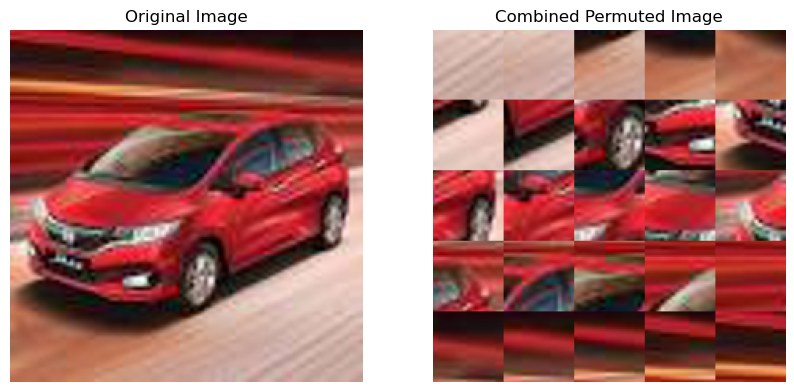

In [409]:
img_display = images_array[0] 
num_tiles = 5

# Split the image into tiles
tiles = split_into_tiles(img_display, num_tiles)

# Permute the order of tiles
permuted_tiles = permute_tiles_double_mirror_flip_fifth(tiles, num_tiles)

# Combine permuted tiles into a single image
combined_image = combine_tiles(permuted_tiles, num_tiles)

# Display the original and combined images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(img_display)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Combined Permuted Image')
plt.imshow(combined_image)
plt.axis('off')

plt.show()



In [60]:
combined_images_list = []
for img_array in images_array:
    num_tiles = 5
    tiles = split_into_tiles(img_array, num_tiles)
    permuted_tiles = permute_tiles_double_mirror_flip_fifth(tiles, num_tiles)
    combined_image = combine_tiles(permuted_tiles, num_tiles)
    combined_images_list.append(combined_image)

combined_images_array5_fifth = np.array(combined_images_list)
images_tensor_5x5_fifth = torch.from_numpy(combined_images_array5_fifth).float()
labels_tensor = torch.from_numpy(labels_array).long()
images_tensor_5x5_fifth = images_tensor_5x5_fifth.permute(0, 3, 1, 2)

print(f"Images tensor shape: {images_tensor_5x5_fifth.shape}")
print(f"Labels tensor shape: {labels_tensor.shape}")

train_images_5x5_fifth, test_images_5x5_fifth, train_labels_5x5_fifth, test_labels_5x5_fifth = train_test_split(images_tensor_5x5_fifth, labels_tensor, test_size=0.2, random_state=42)    

train_dataset_5x5_fifth = CustomDataset(images=train_images_5x5_fifth, labels=train_labels_5x5_fifth)
test_dataset_5x5_fifth = CustomDataset(images=test_images_5x5_fifth, labels=test_labels_5x5_fifth)

train_loader_5x5_fifth = DataLoader(train_dataset_5x5_fifth, batch_size=4, shuffle=True)
test_loader_5x5_fifth = DataLoader(test_dataset_5x5_fifth, batch_size=4, shuffle=False)



AttributeError: 'ellipsis' object has no attribute 'shape'

### Training the different models - 5 tiles:

#### Second permutation

In [411]:

googlenet_5x5_second = models.googlenet(pretrained=True)
num_ftrs = googlenet_5x5_second.fc.in_features
googlenet_5x5_second.fc = nn.Linear(num_ftrs, 2)  # 2 classes (cars and bikes)

# loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(googlenet_5x5_second.parameters(), lr=0.001)


In [412]:
# Training loop
for epoch in range(num_epochs):
    googlenet_5x5_second.train()
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader_5x5_second, 1):
        optimizer.zero_grad()
        outputs = googlenet_5x5_second(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every print_every iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader_5x5_second)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0  # Reset running loss
        
        # Compute train accuracy
        _, predicted = torch.max(outputs, 1)  # Use logits for predictions
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")


Epoch [1/2], Iteration [100/800], Loss: 0.4551
Epoch [1/2], Iteration [200/800], Loss: 0.4215
Epoch [1/2], Iteration [300/800], Loss: 0.3844
Epoch [1/2], Iteration [400/800], Loss: 0.4362
Epoch [1/2], Iteration [500/800], Loss: 0.3854
Epoch [1/2], Iteration [600/800], Loss: 0.2819
Epoch [1/2], Iteration [700/800], Loss: 0.3445
Epoch [1/2], Iteration [800/800], Loss: 0.3258
Epoch [1/2], Loss: 0.1313, Train Accuracy: 85.75%
Epoch [2/2], Iteration [100/800], Loss: 0.2940
Epoch [2/2], Iteration [200/800], Loss: 0.3193
Epoch [2/2], Iteration [300/800], Loss: 0.2792
Epoch [2/2], Iteration [400/800], Loss: 0.3291
Epoch [2/2], Iteration [500/800], Loss: 0.2286
Epoch [2/2], Iteration [600/800], Loss: 0.2811
Epoch [2/2], Iteration [700/800], Loss: 0.2927
Epoch [2/2], Iteration [800/800], Loss: 0.2917
Epoch [2/2], Loss: 0.0497, Train Accuracy: 88.88%
Training completed.


In [413]:

model_performance_5x5 = []  # List to store performance metrics for each model

googlenet_5x5_second.eval()
correct_test = 0
total_test = 0
predicted_labels = []
true_labels = []

with torch.no_grad():
    for images, labels in test_loader_5x5_second:
        outputs = googlenet_5x5_second(images)
        _, predicted = torch.max(outputs.data, 1)
        
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())
        
        correct_test += (predicted == labels).sum().item()
        total_test += labels.size(0)

accuracy = 100 * correct_test / total_test

# Ensure labels and outputs are in the correct form for multiclass AUC calculation if necessary
if len(true_labels[0].shape) == 1:  # Binary classification
    f1 = f1_score(true_labels, predicted_labels, average='binary')
    auc = roc_auc_score(true_labels, predicted_labels)
else:  # Multiclass classification, one-vs-rest
    f1 = f1_score(true_labels, predicted_labels, average='macro')
    auc = roc_auc_score(true_labels, predicted_labels, average='macro', multi_class='ovr')

print(f'Test Accuracy: {accuracy:.2f}%')
print(f'F1 Score: {f1:.2f}')
print(f'AUC: {auc:.2f}')

# Append performance metrics for the current model to the list
model_performance_5x5.append({
    'model': 'googlenet_5x5_second',
    'accuracy': accuracy,
    'f1': f1,
    'auc': auc
})


Test Accuracy: 96.50%
F1 Score: 0.96
AUC: 0.96


#### third permutation

In [427]:
googlenet_5x5_third = models.googlenet(pretrained=True)
num_ftrs = googlenet_5x5_third.fc.in_features
googlenet_5x5_third.fc = nn.Linear(num_ftrs, 2)  # 2 classes (cars and bikes)

# loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(googlenet_5x5_third.parameters(), lr=0.001)



C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [428]:
# Training loop
for epoch in range(num_epochs):
    googlenet_5x5_third.train()
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader_5x5_third, 1):
        optimizer.zero_grad()
        outputs = googlenet_5x5_third(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every print_every iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader_5x5_third)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0
        
        # Compute train accuracy
        _, predicted = torch.max(outputs, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")



Epoch [1/2], Iteration [100/800], Loss: 0.5260
Epoch [1/2], Iteration [200/800], Loss: 0.4192
Epoch [1/2], Iteration [300/800], Loss: 0.3814
Epoch [1/2], Iteration [400/800], Loss: 0.4311
Epoch [1/2], Iteration [500/800], Loss: 0.4658
Epoch [1/2], Iteration [600/800], Loss: 0.4377
Epoch [1/2], Iteration [700/800], Loss: 0.4195
Epoch [1/2], Iteration [800/800], Loss: 0.4058
Epoch [1/2], Loss: 0.2251, Train Accuracy: 81.47%
Epoch [2/2], Iteration [100/800], Loss: 0.2935
Epoch [2/2], Iteration [200/800], Loss: 0.2618
Epoch [2/2], Iteration [300/800], Loss: 0.3632
Epoch [2/2], Iteration [400/800], Loss: 0.2998
Epoch [2/2], Iteration [500/800], Loss: 0.3459
Epoch [2/2], Iteration [600/800], Loss: 0.2954
Epoch [2/2], Iteration [700/800], Loss: 0.3103
Epoch [2/2], Iteration [800/800], Loss: 0.3693
Epoch [2/2], Loss: 0.3671, Train Accuracy: 87.22%
Training completed.


In [429]:

googlenet_5x5_third.eval()
correct_test = 0
total_test = 0
predicted_labels = []
true_labels = []

with torch.no_grad():
    for images, labels in test_loader_5x5_third:
        outputs = googlenet_5x5_third(images)
        _, predicted = torch.max(outputs.data, 1)
        
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())
        
        correct_test += (predicted == labels).sum().item()
        total_test += labels.size(0)

accuracy = 100 * correct_test / total_test

# Ensure labels and outputs are in the correct form for multiclass AUC calculation if necessary
if len(true_labels[0].shape) == 1:  # Binary classification
    f1 = f1_score(true_labels, predicted_labels, average='binary')
    auc = roc_auc_score(true_labels, predicted_labels)
else:  # Multiclass classification, one-vs-rest
    f1 = f1_score(true_labels, predicted_labels, average='macro')
    auc = roc_auc_score(true_labels, predicted_labels, average='macro', multi_class='ovr')

print(f'Test Accuracy: {accuracy:.2f}%')
print(f'F1 Score: {f1:.2f}')
print(f'AUC: {auc:.2f}')

# Append performance metrics for the current model to the list
model_performance_5x5.append({
    'model': 'googlenet_5x5_third',
    'accuracy': accuracy,
    'f1': f1,
    'auc': auc
})


Test Accuracy: 92.50%
F1 Score: 0.92
AUC: 0.93


#### Fourth permutation

In [417]:
googlenet_5x5_fourth = models.googlenet(pretrained=True)
num_ftrs = googlenet_5x5_fourth.fc.in_features
googlenet_5x5_fourth.fc = nn.Linear(num_ftrs, 2)  # 2 classes (cars and bikes)

# loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(googlenet_5x5_fourth.parameters(), lr=0.001)



C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [418]:
# Training loop
for epoch in range(num_epochs):
    googlenet_5x5_fourth.train()
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader_5x5_fourth, 1):
        optimizer.zero_grad()
        outputs = googlenet_5x5_fourth(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every print_every iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader_5x5_fourth)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0
        
        # Compute train accuracy
        _, predicted = torch.max(outputs, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")



Epoch [1/2], Iteration [100/800], Loss: 0.5150
Epoch [1/2], Iteration [200/800], Loss: 0.4727
Epoch [1/2], Iteration [300/800], Loss: 0.4389
Epoch [1/2], Iteration [400/800], Loss: 0.3963
Epoch [1/2], Iteration [500/800], Loss: 0.3279
Epoch [1/2], Iteration [600/800], Loss: 0.4019
Epoch [1/2], Iteration [700/800], Loss: 0.3283
Epoch [1/2], Iteration [800/800], Loss: 0.3238
Epoch [1/2], Loss: 0.2368, Train Accuracy: 83.44%
Epoch [2/2], Iteration [100/800], Loss: 0.3628
Epoch [2/2], Iteration [200/800], Loss: 0.3611
Epoch [2/2], Iteration [300/800], Loss: 0.3173
Epoch [2/2], Iteration [400/800], Loss: 0.3010
Epoch [2/2], Iteration [500/800], Loss: 0.2840
Epoch [2/2], Iteration [600/800], Loss: 0.3015
Epoch [2/2], Iteration [700/800], Loss: 0.3192
Epoch [2/2], Iteration [800/800], Loss: 0.2243
Epoch [2/2], Loss: 0.0174, Train Accuracy: 87.66%
Training completed.


In [419]:

googlenet_5x5_fourth.eval()
correct_test = 0
total_test = 0
predicted_labels = []
true_labels = []

with torch.no_grad():
    for images, labels in test_loader_5x5_fourth:
        outputs = googlenet_5x5_third(images)
        _, predicted = torch.max(outputs.data, 1)
        
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())
        
        correct_test += (predicted == labels).sum().item()
        total_test += labels.size(0)

accuracy = 100 * correct_test / total_test

# Ensure labels and outputs are in the correct form for multiclass AUC calculation if necessary
if len(true_labels[0].shape) == 1:  # Binary classification
    f1 = f1_score(true_labels, predicted_labels, average='binary')
    auc = roc_auc_score(true_labels, predicted_labels)
else:  # Multiclass classification, one-vs-rest
    f1 = f1_score(true_labels, predicted_labels, average='macro')
    auc = roc_auc_score(true_labels, predicted_labels, average='macro', multi_class='ovr')

print(f'Test Accuracy: {accuracy:.2f}%')
print(f'F1 Score: {f1:.2f}')
print(f'AUC: {auc:.2f}')

# Append performance metrics for the current model to the list
model_performance_5x5.append({
    'model': 'googlenet_5x5_fourth',
    'accuracy': accuracy,
    'f1': f1,
    'auc': auc
})


Test Accuracy: 83.50%
F1 Score: 0.83
AUC: 0.84


#### Fifth permutation

In [420]:
googlenet_5x5_fifth = models.googlenet(pretrained=True)
num_ftrs = googlenet_5x5_fifth.fc.in_features
googlenet_5x5_fifth.fc = nn.Linear(num_ftrs, 2)  # 2 classes (cars and bikes)

# loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(googlenet_5x5_fifth.parameters(), lr=0.001)




C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\adamb\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [421]:
# Training loop
for epoch in range(num_epochs):
    googlenet_5x5_fifth.train()
    correct_train = 0
    total_train = 0
    running_loss = 0.0
    for i, (images, labels) in enumerate(train_loader_5x5_fifth, 1):
        optimizer.zero_grad()
        outputs = googlenet_5x5_fifth(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Print loss every print_every iterations
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(train_loader_5x5_fifth)}], Loss: {running_loss / print_every:.4f}')
            running_loss = 0.0  # Reset running loss
        
        # Compute train accuracy
        _, predicted = torch.max(outputs, 1)  # Use logits for predictions
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    # Print loss and train accuracy for each epoch
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train Accuracy: {(100 * correct_train / total_train):.2f}%')

print("Training completed.")


Epoch [1/2], Iteration [100/800], Loss: 0.4996
Epoch [1/2], Iteration [200/800], Loss: 0.4373
Epoch [1/2], Iteration [300/800], Loss: 0.4230
Epoch [1/2], Iteration [400/800], Loss: 0.4525
Epoch [1/2], Iteration [500/800], Loss: 0.3811
Epoch [1/2], Iteration [600/800], Loss: 0.3996
Epoch [1/2], Iteration [700/800], Loss: 0.3988
Epoch [1/2], Iteration [800/800], Loss: 0.2813
Epoch [1/2], Loss: 0.5760, Train Accuracy: 82.97%
Epoch [2/2], Iteration [100/800], Loss: 0.2889
Epoch [2/2], Iteration [200/800], Loss: 0.3390
Epoch [2/2], Iteration [300/800], Loss: 0.3466
Epoch [2/2], Iteration [400/800], Loss: 0.3106
Epoch [2/2], Iteration [500/800], Loss: 0.3077
Epoch [2/2], Iteration [600/800], Loss: 0.3844
Epoch [2/2], Iteration [700/800], Loss: 0.3355
Epoch [2/2], Iteration [800/800], Loss: 0.3666
Epoch [2/2], Loss: 0.1181, Train Accuracy: 87.25%
Training completed.


In [422]:

# Set the model to evaluation mode
googlenet_5x5_fifth.eval()
correct_test = 0
total_test = 0
predicted_labels = []
true_labels = []

with torch.no_grad():
    for images, labels in test_loader_5x5_fifth:
        outputs = googlenet_5x5_fifth(images)
        _, predicted = torch.max(outputs.data, 1)
        
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())
        
        correct_test += (predicted == labels).sum().item()
        total_test += labels.size(0)

accuracy = 100 * correct_test / total_test

if len(true_labels[0].shape) == 1:  # Binary classification
    f1 = f1_score(true_labels, predicted_labels, average='binary')
    auc = roc_auc_score(true_labels, predicted_labels)
else:  # Multiclass classification, one-vs-rest
    f1 = f1_score(true_labels, predicted_labels, average='macro')
    auc = roc_auc_score(true_labels, predicted_labels, average='macro', multi_class='ovr')

print(f'Test Accuracy: {accuracy:.2f}%')
print(f'F1 Score: {f1:.2f}')
print(f'AUC: {auc:.2f}')

# Append performance metrics for the current model to the list
model_performance_5x5.append({
    'model': 'googlenet_5x5_fifth',
    'accuracy': accuracy,
    'f1': f1,
    'auc': auc
})


Test Accuracy: 93.12%
F1 Score: 0.93
AUC: 0.93


Adding the accuracy for the original permutation

In [423]:
model_performance_5x5.append({
    'model': 'googlenet_5x5_original',
    'accuracy': 93.37,
    'f1': 'unknown', 
    'auc': 'unknown'  
})

# printing out the model performance for verification
for model_info in model_performance_5x5:
    print(f"Model: {model_info['model']}, Accuracy: {model_info['accuracy']}, F1: {model_info['f1']}, AUC: {model_info['auc']}")


Model: googlenet_5x5_second, Accuracy: 96.5, F1: 0.9648838973857315, AUC: 0.9647558865568344
Model: googlenet_5x5_third, Accuracy: 97.0, F1: 0.9699519230769231, AUC: 0.9707364778454827
Model: googlenet_5x5_fourth, Accuracy: 83.5, F1: 0.8332480624561803, AUC: 0.8431881441360115
Model: googlenet_5x5_fifth, Accuracy: 93.125, F1: 0.9310317802421725, AUC: 0.9309724416359488
Model: googlenet_5x5_original, Accuracy: 93.37, F1: unknown, AUC: unknown


### Permutation ranking:

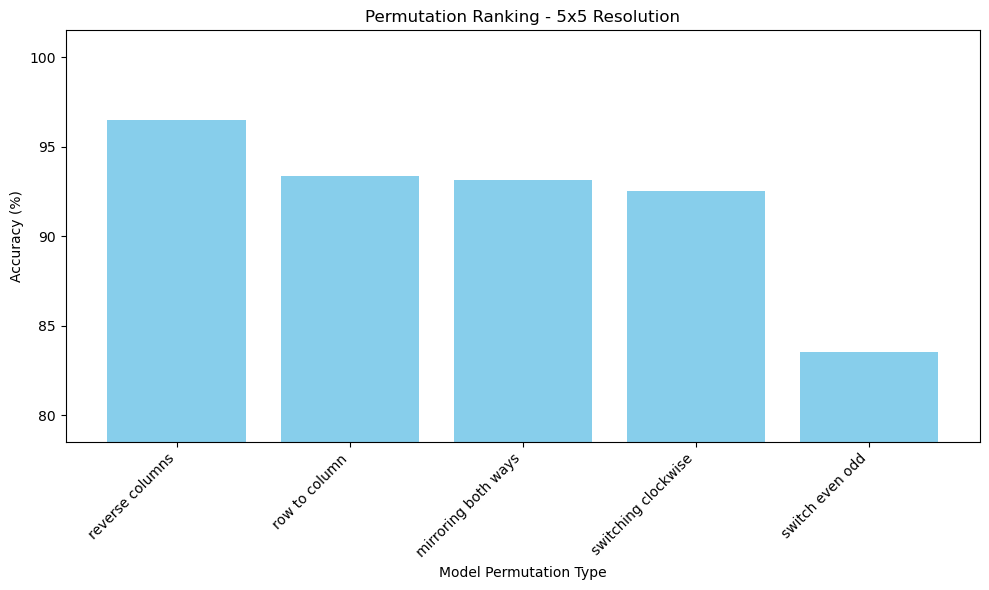

In [433]:

# Sort the model_performance list by accuracy in decreasing order
sorted_performance = sorted(model_performance_5x5, key=lambda x: x['accuracy'], reverse=True)

# Extract model names and their accuracies
model_names = [model['model'] for model in sorted_performance]
accuracies = [model['accuracy'] for model in sorted_performance]

# Define a mapping from model names to new descriptions
name_to_description = {
    'googlenet_5x5_original': 'row to column',
    'googlenet_5x5_second': 'reverse columns',
    'googlenet_5x5_third': 'switching clockwise',
    'googlenet_5x5_fourth': 'switch even odd',
    'googlenet_5x5_fifth': 'mirroring both ways'
}

# Use the mapping to update model names with descriptions
model_descriptions = [name_to_description[name] for name in model_names]

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(model_descriptions, accuracies, color='skyblue')
plt.xlabel('Model Permutation Type')
plt.ylabel('Accuracy (%)')
plt.title('Permutation Ranking - 5x5 Resolution')
plt.xticks(rotation=45, ha="right")
plt.ylim([min(accuracies) - 5, max(accuracies) + 5])  # Adjust limits to give some space above the highest bar
plt.tight_layout()
plt.show()


Let's look at the 3x3 graph again:

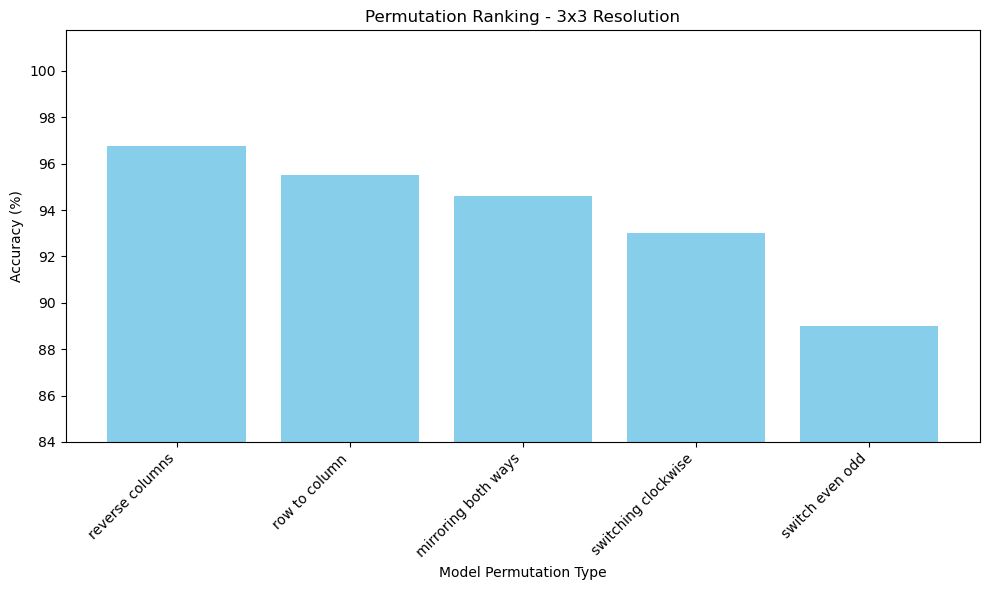

In [434]:

# Sort the model_performance list by accuracy in decreasing order
sorted_performance = sorted(model_performance, key=lambda x: x['accuracy'], reverse=True)

# Extract model names and their accuracies
model_names = [model['model'] for model in sorted_performance]
accuracies = [model['accuracy'] for model in sorted_performance]

# Define a mapping from model names to new descriptions
name_to_description = {
    'googlenet_3x3_original': 'row to column',
    'googlenet_3x3_second': 'reverse columns',
    'googlenet_3x3_third': 'switching clockwise',
    'googlenet_3x3_fourth': 'switch even odd',
    'googlenet_3x3_fifth': 'mirroring both ways'
}

# Use the mapping to update model names with descriptions
model_descriptions = [name_to_description[name] for name in model_names]

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(model_descriptions, accuracies, color='skyblue')
plt.xlabel('Model Permutation Type')
plt.ylabel('Accuracy (%)')
plt.title('Permutation Ranking - 3x3 Resolution')
plt.xticks(rotation=45, ha="right")
plt.ylim([min(accuracies) - 5, max(accuracies) + 5])  # Adjust limits to give some space above the highest bar
plt.tight_layout()
plt.show()


The trend observed in the 5x5 resolution mirrors that of the previous resolutions, where the classification accuracy tends to be inversely proportional to the complexity of the permutation. As expected, with the increase in resolution, the overall accuracy across all permutations has decreased. However, the pattern remains consistent, with simpler permutations achieving higher accuracy and more complex ones yielding lower accuracy.

## Thank You!

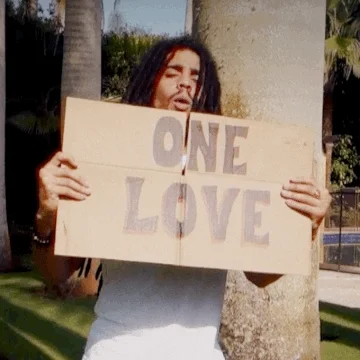